# Project Description
The Global Power Plant Database is a comprehensive, open source database of power plants around the world. It centralizes power plant data to make it easier to navigate, compare and draw insights for one’s own analysis. The database covers approximately 35,000 power plants from 167 countries and includes thermal plants (e.g. coal, gas, oil, nuclear, biomass, waste, geothermal) and renewables (e.g. hydro, wind, solar). Each power plant is geolocated and entries contain information on plant capacity, generation, ownership, and fuel type. It will be continuously updated as data becomes available.
Key attributes of the database
# The database includes the following indicators:
•	
•	`country` (text): 3 character country code corresponding to the ISO 3166-1 alpha-3 specification [5]
•	`country_long` (text): longer form of the country designation
•	`name` (text): name or title of the power plant, generally in Romanized form
•	`gppd_idnr` (text): 10 or 12 character identifier for the power plant
•	`capacity_mw` (number): electrical generating capacity in megawatts
•	`latitude` (number): geolocation in decimal degrees; WGS84 (EPSG:4326)
•	`longitude` (number): geolocation in decimal degrees; WGS84 (EPSG:4326)
•	`primary_fuel` (text): energy source used in primary electricity generation or export
•	`other_fuel1` (text): energy source used in electricity generation or export
•	`other_fuel2` (text): energy source used in electricity generation or export
•	`other_fuel3` (text): energy source used in electricity generation or export
•	 `commissioning_year` (number): year of plant operation, weighted by unit-capacity when data is available
•	`owner` (text): majority shareholder of the power plant, generally in Romanized form
•	`source` (text): entity reporting the data; could be an organization, report, or document, generally in Romanized form
•	`url` (text): web document corresponding to the `source` field
•	`geolocation_source` (text): attribution for geolocation information
•	`wepp_id` (text): a reference to a unique plant identifier in the widely-used PLATTS-WEPP database.
•	`year_of_capacity_data` (number): year the capacity information was reported
•	`generation_gwh_2013` (number): electricity generation in gigawatt-hours reported for the year 2013
•	`generation_gwh_2014` (number): electricity generation in gigawatt-hours reported for the year 2014
•	`generation_gwh_2015` (number): electricity generation in gigawatt-hours reported for the year 2015
•	`generation_gwh_2016` (number): electricity generation in gigawatt-hours reported for the year 2016
•	`generation_gwh_2017` (number): electricity generation in gigawatt-hours reported for the year 2017
•	`generation_gwh_2018` (number): electricity generation in gigawatt-hours reported for the year 2018
•	`generation_gwh_2019` (number): electricity generation in gigawatt-hours reported for the year 2019
•	`generation_data_source` (text): attribution for the reported generation information
•	`estimated_generation_gwh_2013` (number): estimated electricity generation in gigawatt-hours for the year 2013
•	`estimated_generation_gwh_2014` (number): estimated electricity generation in gigawatt-hours for the year 2014 
•	`estimated_generation_gwh_2015` (number): estimated electricity generation in gigawatt-hours for the year 2015 
•	`estimated_generation_gwh_2016` (number): estimated electricity generation in gigawatt-hours for the year 2016 
•	`estimated_generation_gwh_2017` (number): estimated electricity generation in gigawatt-hours for the year 2017 
•	'estimated_generation_note_2013` (text): label of the model/method used to estimate generation for the year 2013
•	`estimated_generation_note_2014` (text): label of the model/method used to estimate generation for the year 2014 
•	`estimated_generation_note_2015` (text): label of the model/method used to estimate generation for the year 2015
•	`estimated_generation_note_2016` (text): label of the model/method used to estimate generation for the year 2016
•	`estimated_generation_note_2017` (text): label of the model/method used to estimate generation for the year 2017 
Fuel Type Aggregation
We define the "Fuel Type" attribute of our database based on common fuel categories. 
# Prediction :   Make two prediction  1) Primary Fuel    2) capacity_mw 

# Dataset Link-
•	https://github.com/wri/global-power-plant-database/blob/master/source_databases_csv/database_IND.csv


In [3]:
# Imp libs:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV

# Algorithms
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
# Importing metrics
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [4]:
# Standardizing and Normalizing data:
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
import xgboost as xgb

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV

# Importing metrics
from sklearn import metrics
from sklearn.metrics import r2_score,mean_squared_error

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [5]:
file_loc = 'https://raw.githubusercontent.com/wri/global-power-plant-database/master/source_databases_csv/database_IND.csv'
df = pd.read_csv(file_loc)

In [6]:
print('First 10 rows')
df.head(10)

First 10 rows


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,2019.0,NaN,617.789264,843.7470,886.004428,663.774500,626.239128,NaN,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,2019.0,NaN,3035.550000,5916.3700,6243.000000,5385.579736,7279.000000,NaN,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.0,23.7689,68.6447,Coal,Oil,NaN,...,2019.0,NaN,1153.421000,1208.8520,1175.765000,1147.913000,976.655000,NaN,Central Electricity Authority,NaN
6,IND,India,ALIYAR,IND0000004,60.0,10.4547,77.0078,Hydro,NaN,NaN,...,2019.0,NaN,157.558250,152.1952,61.421350,89.629600,48.327150,NaN,Central Electricity Authority,NaN
7,IND,India,ALLAIN DUHANGAN,IND0000005,192.0,32.2258,77.2070,Hydro,NaN,NaN,...,2019.0,NaN,674.391100,721.3352,675.724400,679.594950,579.318850,NaN,Central Electricity Authority,NaN
8,IND,India,ALMATTI DAM,IND0000006,290.0,16.3300,75.8863,Hydro,NaN,NaN,...,2019.0,NaN,480.594950,144.4342,402.029750,439.372100,406.377900,NaN,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.0,23.1642,81.6373,Coal,Oil,NaN,...,2019.0,NaN,1887.904000,1643.0460,1338.093000,1563.457000,1487.880000,NaN,Central Electricity Authority,NaN


In [7]:
print('Last 10 rows')
df.tail(10)

Last 10 rows


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
897,IND,India,Wind power project by Riddhi Siddhi Gluco Biol...,WRI1026753,34.65,8.8709,77.4466,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
898,IND,India,Wind power project in Rajasthan,WRI1026769,42.00,27.1715,70.6877,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
899,IND,India,YAMUNANAGAR TPP,IND0000511,600.00,30.1081,77.3257,Coal,Oil,NaN,...,2019.0,NaN,3194.35982,3709.552200,3123.572061,3156.053669,3039.66118,NaN,Central Electricity Authority,NaN
900,IND,India,YASHWANTRAO MOHITE,WRI1019995,16.00,17.1653,74.2456,Biomass,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
901,IND,India,YELHANKA (DG),IND0000512,106.60,13.1156,77.5838,Oil,NaN,NaN,...,2019.0,NaN,0.00000,0.000000,0.000000,NaN,0.00000,NaN,Central Electricity Authority,NaN
902,IND,India,YERMARUS TPP,IND0000513,1600.00,16.2949,77.3568,Coal,Oil,NaN,...,2019.0,NaN,NaN,0.994875,233.596650,865.400000,686.50000,NaN,Central Electricity Authority,NaN
903,IND,India,Yelesandra Solar Power Plant,WRI1026222,3.00,12.8932,78.1654,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
904,IND,India,Yelisirur wind power project,WRI1026776,25.50,15.2758,75.5811,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
905,IND,India,ZAWAR MINES,WRI1019901,80.00,24.3500,73.7477,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
906,IND,India,iEnergy Theni Wind Farm,WRI1026761,16.50,9.9344,77.4768,Wind,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

In [9]:
df.shape

(907, 27)

In [10]:
df.dtypes

country                      object
country_long                 object
name                         object
gppd_idnr                    object
capacity_mw                 float64
latitude                    float64
longitude                   float64
primary_fuel                 object
other_fuel1                  object
other_fuel2                  object
other_fuel3                 float64
commissioning_year          float64
owner                        object
source                       object
url                          object
geolocation_source           object
wepp_id                     float64
year_of_capacity_data       float64
generation_gwh_2013         float64
generation_gwh_2014         float64
generation_gwh_2015         float64
generation_gwh_2016         float64
generation_gwh_2017         float64
generation_gwh_2018         float64
generation_gwh_2019         float64
generation_data_source       object
estimated_generation_gwh    float64
dtype: object

In [11]:
null_data = df.isnull().sum()
null_data.sort_values(ascending=0)

estimated_generation_gwh    907
other_fuel3                 907
wepp_id                     907
generation_gwh_2013         907
generation_gwh_2019         907
other_fuel2                 906
other_fuel1                 709
owner                       565
generation_gwh_2014         509
generation_gwh_2015         485
generation_gwh_2016         473
generation_gwh_2017         467
generation_gwh_2018         459
generation_data_source      458
year_of_capacity_data       388
commissioning_year          380
latitude                     46
longitude                    46
geolocation_source           19
country                       0
url                           0
country_long                  0
primary_fuel                  0
capacity_mw                   0
gppd_idnr                     0
name                          0
source                        0
dtype: int64

In [12]:
null_cols= ['estimated_generation_gwh','other_fuel3','wepp_id','generation_gwh_2013','generation_gwh_2019','other_fuel2',
            'other_fuel1']

In [13]:
df.shape[0]

907

In [13]:
df.drop(columns=null_cols,axis=1,inplace=True)

In [14]:
df.shape

(907, 20)

In [15]:
# Furthur treating null values:

df['owner'].fillna('Not available',axis=0,inplace=True)

In [16]:
df['generation_gwh_2014'].fillna(np.mean(df['generation_gwh_2014']),axis=0,inplace=True)        
df['generation_gwh_2015'].fillna(np.mean(df['generation_gwh_2015']),axis=0,inplace=True)         
df['generation_gwh_2016'].fillna(np.mean(df['generation_gwh_2016']),axis=0,inplace=True)
df['generation_gwh_2017'].fillna(np.mean(df['generation_gwh_2017']),axis=0,inplace=True)         
df['generation_gwh_2018'].fillna(np.mean(df['generation_gwh_2018']),axis=0,inplace=True)

In [17]:
df['generation_data_source'].fillna('Not available',axis=0,inplace=True)
df['year_of_capacity_data'].fillna('Not available',axis=0,inplace=True)
df['commissioning_year'].fillna('Not available',axis=0,inplace=True)

In [18]:
"""Null value treatment:
Lets fill missing values with mean values for generation columns.
For generation_data_source, year_of_capacity_data, commissioning_year since we dont know exact values
lets fill them using not available value"""

'Null value treatment:\nLets fill missing values with mean values for generation columns.\nFor generation_data_source, year_of_capacity_data, commissioning_year since we dont know exact values\nlets fill them using not available value'

In [19]:
desc = df.describe().T
desc['range']=desc['max']-desc['min']
desc

,count,mean,std,min,25%,50%,75%,max,range
capacity_mw,907.0,326.223755,590.085456,0.0000,16.725000,59.200000,385.250000,4760.000,4760.0000
latitude,861.0,21.197918,6.239612,8.1689,16.773900,21.780000,25.512400,34.649,26.4801
longitude,861.0,77.464907,4.939316,68.6447,74.256200,76.719500,79.440800,95.408,26.7633
generation_gwh_2014,907.0,2431.823590,2665.338608,0.0000,1211.362750,2431.823590,2431.823590,28127.000,28127.0000
generation_gwh_2015,907.0,2428.226946,2859.349132,0.0000,916.000000,2428.226946,2428.226946,30539.000,30539.0000
generation_gwh_2016,907.0,2467.936859,2877.890004,0.0000,896.500214,2467.936859,2467.936859,30015.000,30015.0000
generation_gwh_2017,907.0,2547.759305,2921.502193,0.0000,882.594850,2547.759305,2547.759305,35116.000,35116.0000
generation_gwh_2018,907.0,2600.804099,3030.808041,0.0000,824.842340,2600.804099,2600.804099,35136.000,35136.0000


In [20]:
df.describe(include='object').T


,count,unique,top,freq
country,907,1,IND,907
country_long,907,1,India,907
name,907,907,ACME Solar Tower,1
gppd_idnr,907,907,WRI1020239,1
primary_fuel,907,8,Coal,258
commissioning_year,907,74,Not available,380
owner,907,281,Not available,565
source,907,191,Central Electricity Authority,519
url,907,304,http://www.cea.nic.in/,519
geolocation_source,888,3,WRI,765


In [21]:
df.isnull().sum()

country                    0
country_long               0
name                       0
gppd_idnr                  0
capacity_mw                0
latitude                  46
longitude                 46
primary_fuel               0
commissioning_year         0
owner                      0
source                     0
url                        0
geolocation_source        19
year_of_capacity_data      0
generation_gwh_2014        0
generation_gwh_2015        0
generation_gwh_2016        0
generation_gwh_2017        0
generation_gwh_2018        0
generation_data_source     0
dtype: int64

In [22]:
df.dropna(axis=0,inplace=True)

In [23]:
df.isnull().sum()

country                   0
country_long              0
name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
commissioning_year        0
owner                     0
source                    0
url                       0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_gwh_2018       0
generation_data_source    0
dtype: int64

In [24]:
desc[['min','mean','max','range']]

,min,mean,max,range
capacity_mw,0.0000,326.223755,4760.000,4760.0000
latitude,8.1689,21.197918,34.649,26.4801
longitude,68.6447,77.464907,95.408,26.7633
generation_gwh_2014,0.0000,2431.823590,28127.000,28127.0000
generation_gwh_2015,0.0000,2428.226946,30539.000,30539.0000
generation_gwh_2016,0.0000,2467.936859,30015.000,30015.0000
generation_gwh_2017,0.0000,2547.759305,35116.000,35116.0000
generation_gwh_2018,0.0000,2600.804099,35136.000,35136.0000


In [25]:
cont_data = df.select_dtypes(include=['int64','float64'])

cat_data= df.select_dtypes(include=['object'])

cont_columns = cont_data.columns

cat_columns = cat_data.columns

In [26]:
cont_columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018'],
      dtype='object')

In [27]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

In [28]:
!pip install scipy

In [29]:
for i in ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel']:
    most_frequent_value = df[i].value_counts().idxmax()
    print('For', i, ', most frequent value is:', most_frequent_value)


For country , most frequent value is: IND
For country_long , most frequent value is: India
For name , most frequent value is: ACME Solar Tower
For gppd_idnr , most frequent value is: WRI1020239
For primary_fuel , most frequent value is: Coal


In [30]:
for i in cat_columns:
    print('For column',i,'unique values are: ',df[i].unique())
    print('For column',i,'count of unique values are: ',df[i].nunique(),'\n\n')
    

For column country unique values are:  ['IND']
For column country count of unique values are:  1 


For column country_long unique values are:  ['India']
For column country_long count of unique values are:  1 


For column name unique values are:  ['ACME Solar Tower' 'ADITYA CEMENT WORKS' 'AES Saurashtra Windfarms'
 'AGARTALA GT' 'AKALTARA TPP' 'AKRIMOTA LIG' 'ALIYAR' 'ALLAIN DUHANGAN'
 'ALMATTI DAM' 'AMAR KANTAK' 'AMARAVATI TPP' 'ANANDPUR SAHIB ST-I&II'
 'ANAPARA "C"' 'ANDHRA' 'ANPARA' 'ANTA GT' 'ANUPPUR' 'ANUPUR TPP'
 'ARVINDNAGAR SUGAR' 'ASHOKNAGAR MILL' 'ATHANI SUGAR' 'AURAIYA GT'
 'AVANTHA BHANDAR TPP' 'AWARPUR CEMENT PLANT' 'Amarsar Solar Power Plant'
 'Anabura Wind Farm' 'Ananthapur - Meil Solar Power Plant'
 'Andrha Lake Wind Farm' 'Anikkadavu Wind Farm' 'Arasinagundi Wind Farm'
 'Askandra - DREPL Solar Power Plant'
 'Askandra - Electromech Maritech Solar Power Plant'
 'Askandra - Finehope Solar Power Plant'
 'Askandra - Khaya Solar Power Plant'
 'Askandra - Newton Solar Power 

In [31]:
for i in cat_columns:
    print('For column --',i,'-- value counts are: \n',df[i].value_counts(),'\n\n')

For column -- country -- value counts are: 
 country
IND    861
Name: count, dtype: int64 


For column -- country_long -- value counts are: 
 country_long
India    861
Name: count, dtype: int64 


For column -- name -- value counts are: 
 name
ACME Solar Tower             1
PRAGATI CCCP -III            1
PRIYADARSHNI JURALA          1
PRYAGRAJ (BARA) TPP          1
PULICHINTALA                 1
                            ..
Jangi village wind farm      1
Jeloo Wind Farm              1
Jodiya Wind Farm             1
K.N. Ram Kaltek Wind Farm    1
iEnergy Theni Wind Farm      1
Name: count, Length: 861, dtype: int64 


For column -- gppd_idnr -- value counts are: 
 gppd_idnr
WRI1020239    1
IND0000343    1
IND0000345    1
IND0000346    1
IND0000523    1
             ..
WRI1026777    1
WRI1026099    1
WRI1026082    1
WRI1026339    1
WRI1026761    1
Name: count, Length: 861, dtype: int64 


For column -- primary_fuel -- value counts are: 
 primary_fuel
Coal       253
Hydro      233
Sola

In [32]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

In [33]:
cont_columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018'],
      dtype='object')

In [34]:
group_fuel = df.groupby(['primary_fuel','owner'])
group_fuel.first()

country  \
primary_fuel owner                                                    
Biomass      Ashok Ssk ltd                                      IND   
             Bannari Sugars ltd                                 IND   
             Core Fuels ltd                                     IND   
             Datta Ssk ltd                                      IND   
             Daund Sugar ltd                                    IND   
...                                                             ...   
Wind         Tratnagiri Wind Power Projects Private Limited     IND   
             UPL                                                IND   
             Vaayu Renew                                        IND   
             Weizzmann Forex Limited                            IND   
             iEnergy Wind Farms                                 IND   

                                                            country_long  \
primary_fuel owner                                                         
Biomass      Ashok Ssk ltd                                         India   
             Bannari Sugars ltd                                    India   
             Core Fuels ltd                                        India   
             Datta Ssk ltd                                         India   
             Daund Sugar ltd                                       India   
...                                                                  ...   
Wind         Tratnagiri Wind Power Projects Private Limited        India   
             UPL                                                   India   
             Vaayu Renew                                           India   
             Weizzmann Forex Limited                               India   
             iEnergy Wind Farms                                    India   

                                                                                         name  \
primary_fuel owner                                                                              
Biomass      Ashok Ssk ltd                                                    ASHOKNAGAR MILL   
             Bannari Sugars ltd                                                KOLLEGAL SUGAR   
             Core Fuels ltd                                                  CORE GREEN SUGAR   
             Datta Ssk ltd                                                        SHIROL MILL   
             Daund Sugar ltd                                                      DAUND SUGAR   
...                                                                                       ...   
Wind         Tratnagiri Wind Power Projects Private Limited            Patan Taluka Wind Farm   
             UPL                                                     UPL Dharapuram Wind Farm   
             Vaayu Renew                                                Vaayu Ashti Wind Farm   
             Weizzmann Forex Limited                         Weizzmann Forex Idukki Wind Farm   
             iEnergy Wind Farms                                       iEnergy Theni Wind Farm   

                                                              gppd_idnr  \
primary_fuel owner                                                        
Biomass      Ashok Ssk ltd                                   WRI1019939   
             Bannari Sugars ltd                              WRI1019922   
             Core Fuels ltd                                  WRI1019911   
             Datta Ssk ltd                                   WRI1019985   
             Daund Sugar ltd                                 WRI1019950   
...                                                                 ...   
Wind         Tratnagiri Wind Power Projects Private Limited  WRI1026663   
             UPL                                             WRI1026759   
             Vaayu Renew                                     WRI1026665   
             Weizzmann Forex Limited                        

In [35]:
grp1 = df.groupby(['primary_fuel','capacity_mw'])
grp1.first()

country country_long                   name  \
primary_fuel capacity_mw                                               
Biomass      10.00           IND        India      ARVINDNAGAR SUGAR   
             11.00           IND        India       RAMANAGARAM MILL   
             11.20           IND        India      MUNOLI DISTILLERY   
             12.50           IND        India           RANJANI MILL   
             12.96           IND        India       DNYANESHWAR MILL   
...                          ...          ...                    ...   
Wind         100.80          IND        India  Ingaleshwar Wind Farm   
             102.00          IND        India   ONGC Jerat Wind Farm   
             113.60          IND        India  Andrha Lake Wind Farm   
             150.00          IND        India         Bera Wind Farm   
             200.00          IND        India  Thimmapuram Wind Farm   

                           gppd_idnr  latitude  longitude commissioning_year  \
primary_fuel capacity_mw                                                       
Biomass      10.00        WRI1019938   18.0845    76.1851      Not available   
             11.00        WRI1019931   12.7145    77.4524      Not available   
             11.20        WRI1019928   15.8555    75.1002      Not available   
             12.50        WRI1019979   18.5354    76.2450      Not available   
             12.96        WRI1019952   19.4496    75.0382      Not available   
...                              ...       ...        ...                ...   
Wind         100.80       WRI1026661   16.6208    76.0223      Not available   
             102.00       WRI1026091   26.8180    71.0643      Not available   
             113.60       WRI1026768   18.8580    73.6396      Not available   
             150.00       WRI1026083   23.0544    68.8782      Not available   
             200.00       WRI1026659   14.7053    77.3355      Not available   

                                                              owner  \
primary_fuel capacity_mw                                              
Biomass      10.00                                       Dr Ssk ltd   
             11.00                                      Spr Pvt ltd   
             11.20                                 Shree Sugars ltd   
             12.50                           Natural Alliend indust   
             12.96                                     Shri Ssk ltd   
...                                                             ...   
Wind         100.80             Fortune Five Hydel Projects Limited   
             102.00                                   Not available   
             113.60                                   Not available   
             150.00                                   Not available   
             200.00       Rayala Wind Power Company Private Limited   

                                          source  \
primary_fuel capacity_mw                           
Biomass      10.00                    Dr Ssk ltd   
             11.00                   Spr Pvt ltd   
             11.20              Shree Sugars ltd   
             12.50        Natural Alliend indust   
             12.96                  Shri Ssk ltd   
...                                          ...   
Wind         100.80                          CDM   
             102.00                          CDM   
             113.60                          CDM   
             150.00                          CDM   
             200.00                          CDM   

                                                                        url  \
primary_fuel capacity_mw                                                      
Biomass      10.00                            http://www.ambedkarsugar.com/   
             11.00        http://www.mapsofindia.com/whitepages/foods-an...   
             11.20                             http://www.renukasugars.com/   
             12.50                                 

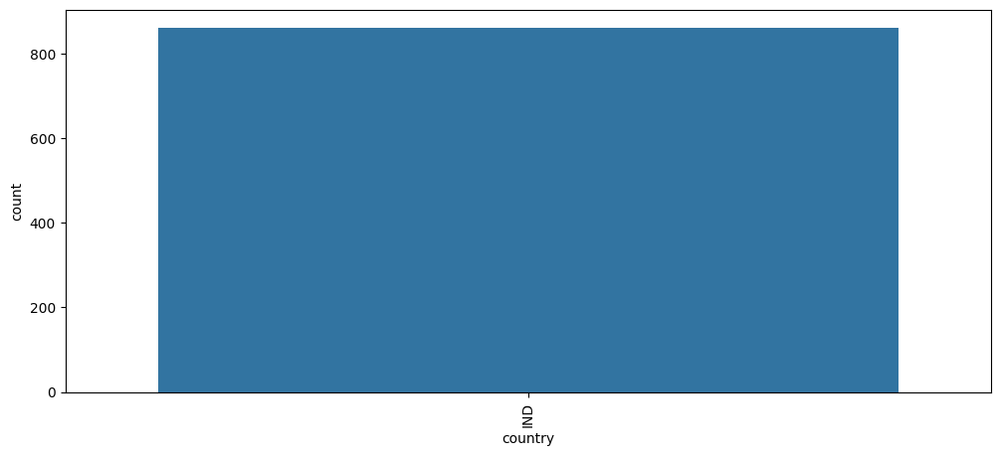

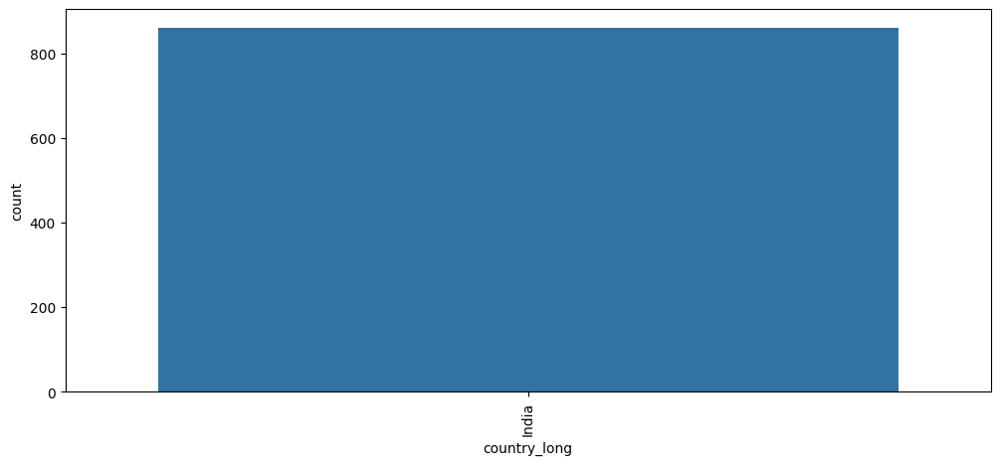

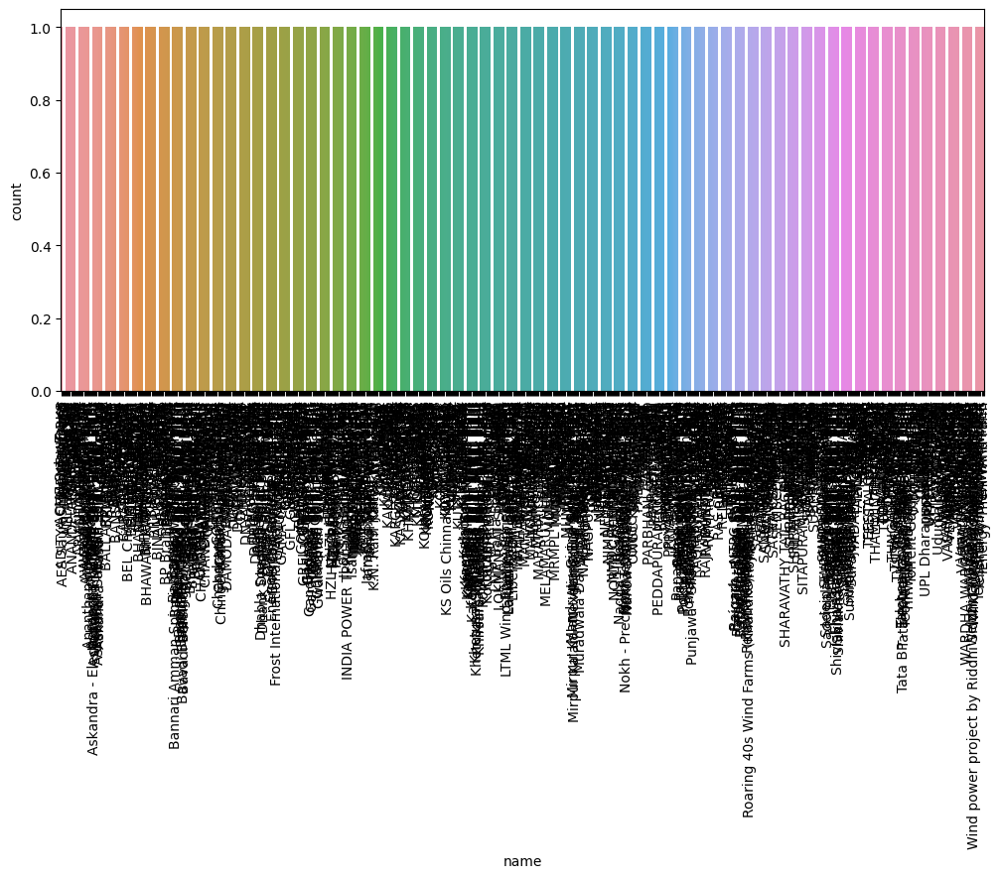

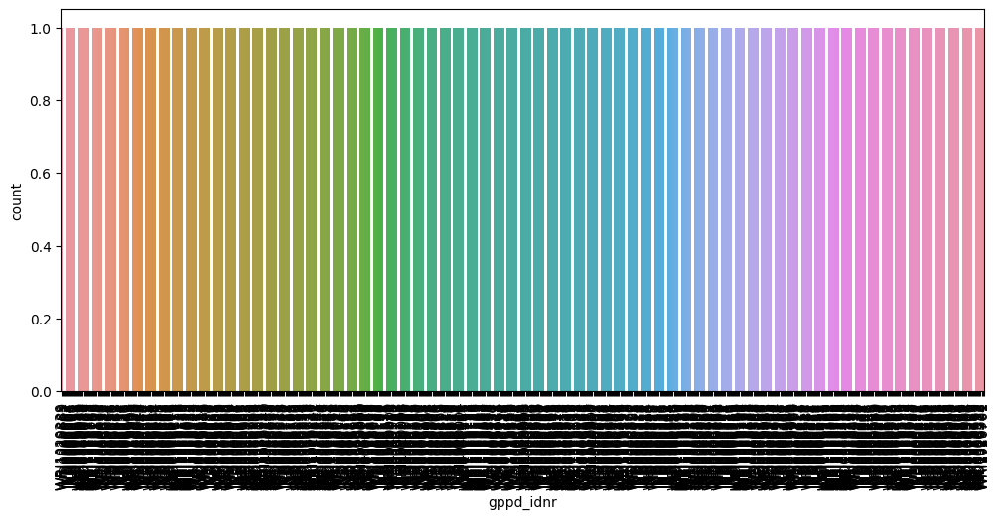

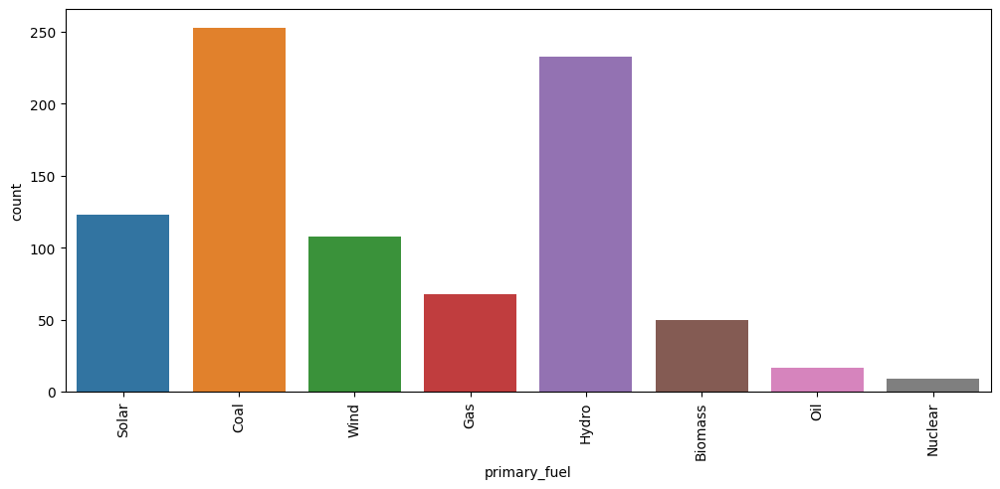

...

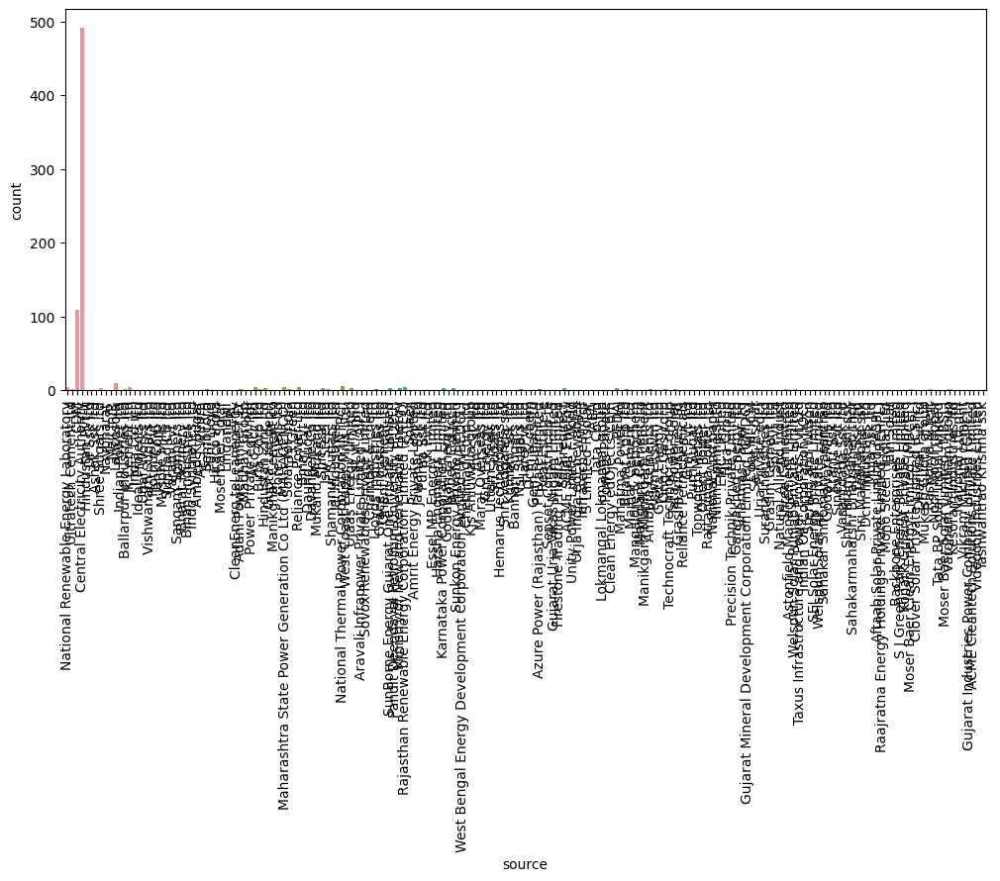

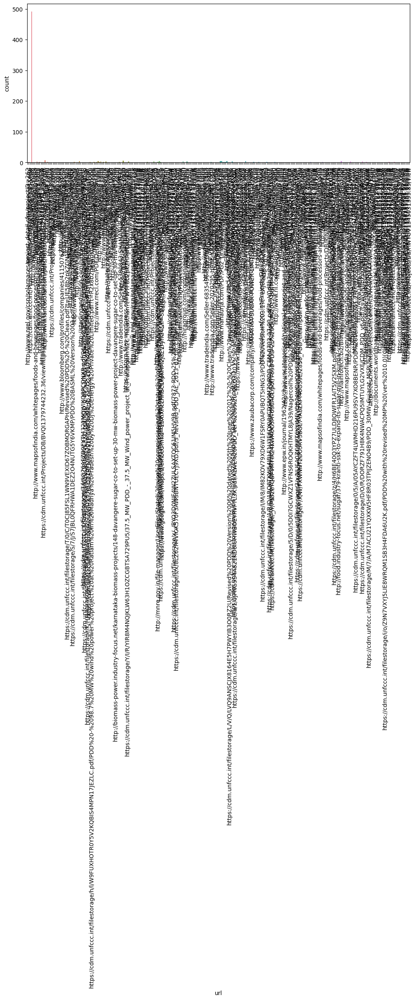

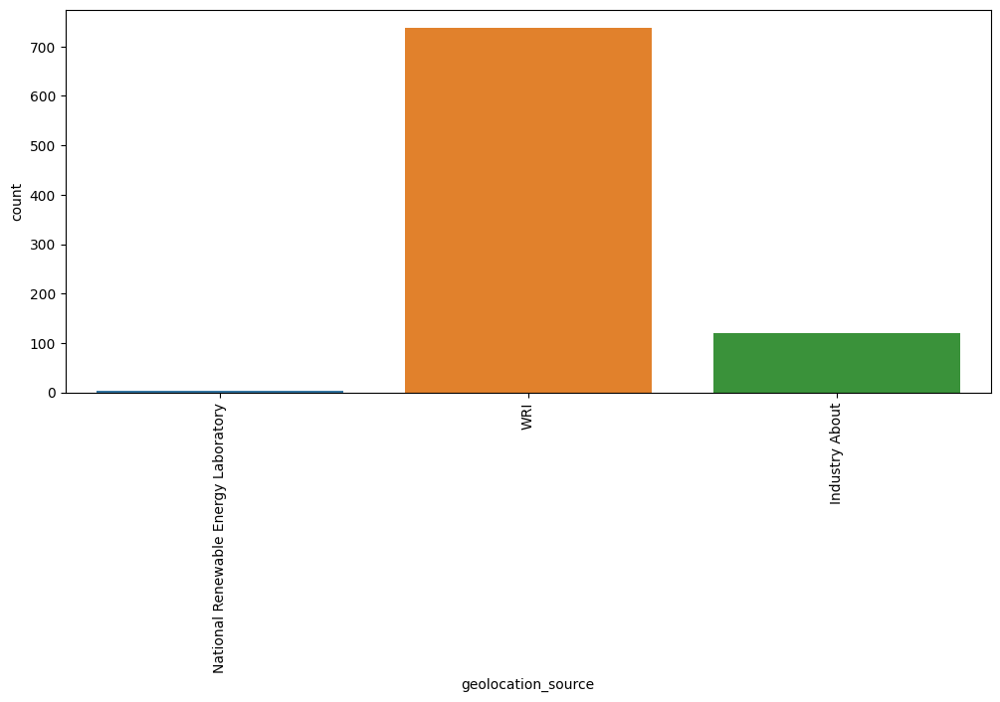

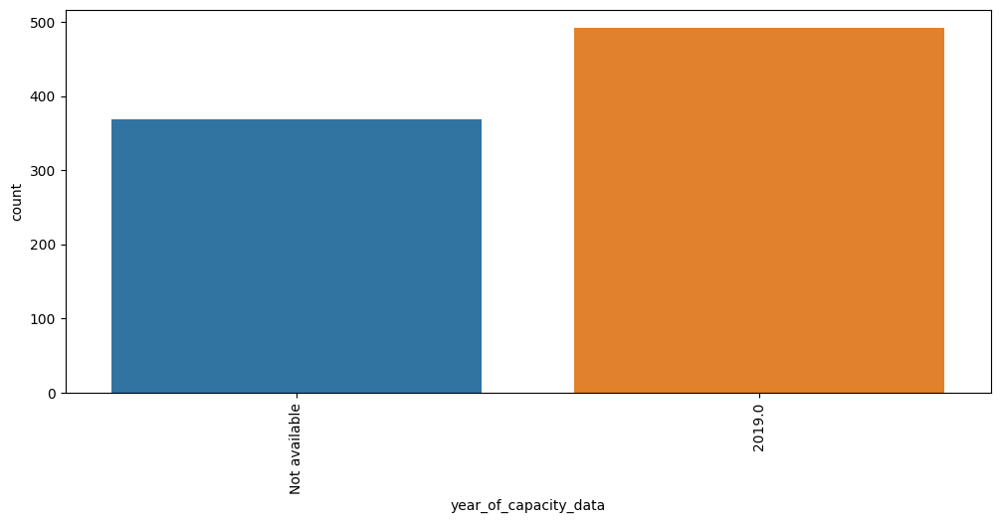

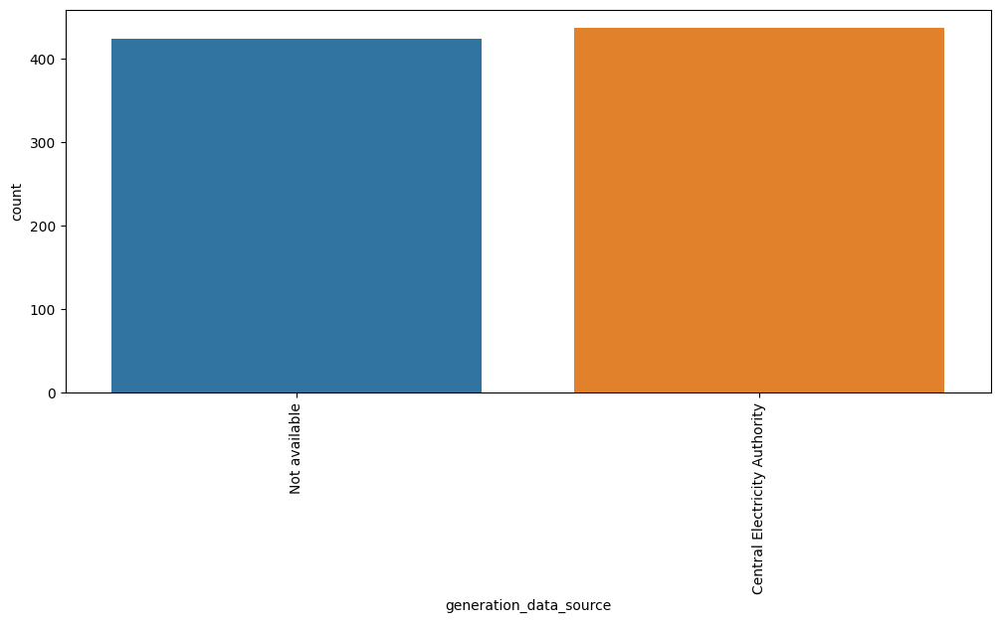

In [36]:
# Univariate analysis:

# COUNTPLOT

for i in cat_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.countplot(x=df[i],data=df)
    plt.xticks(rotation=90)

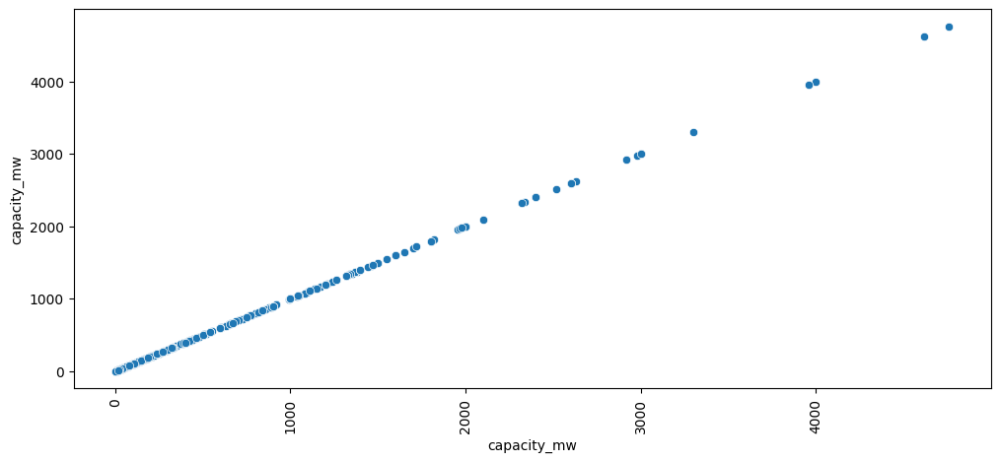

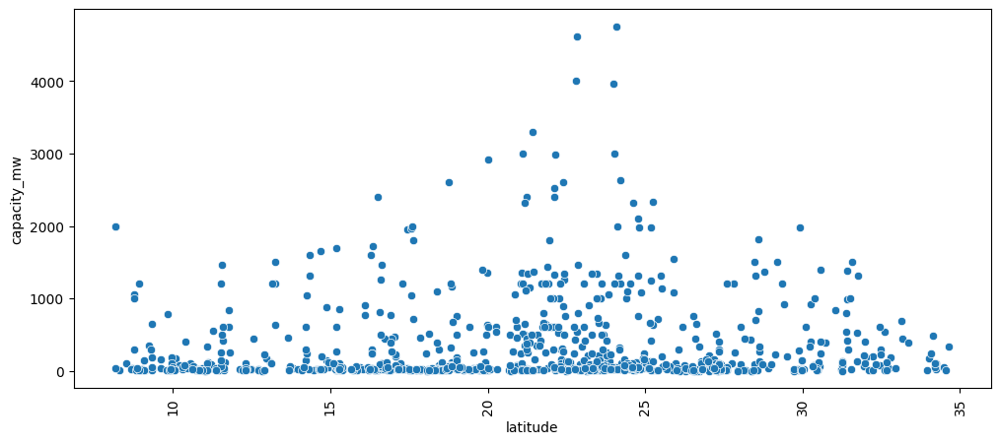

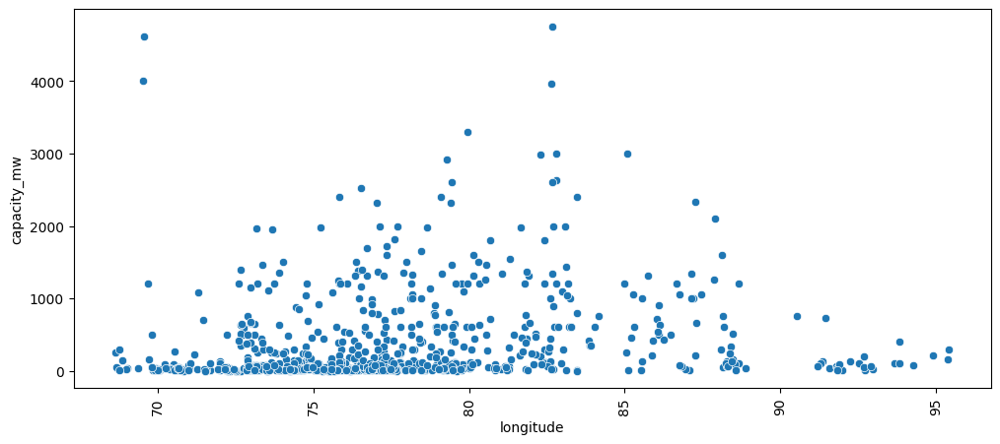

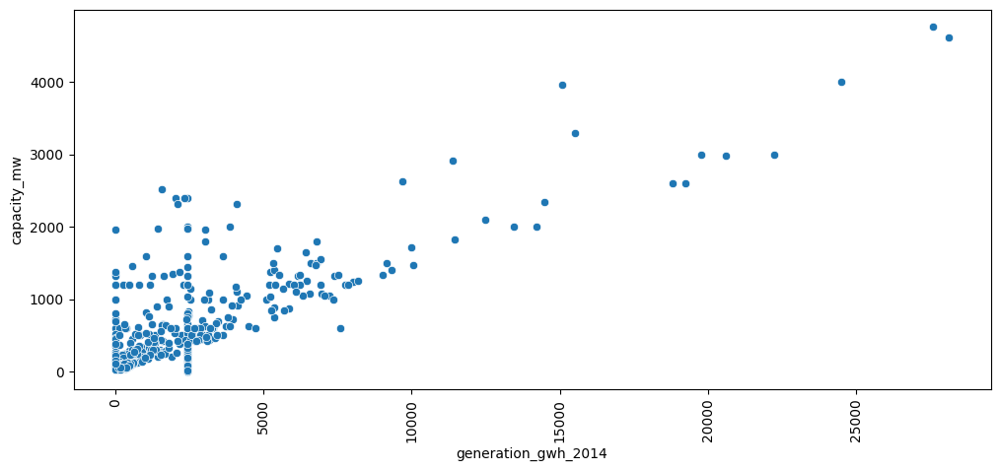

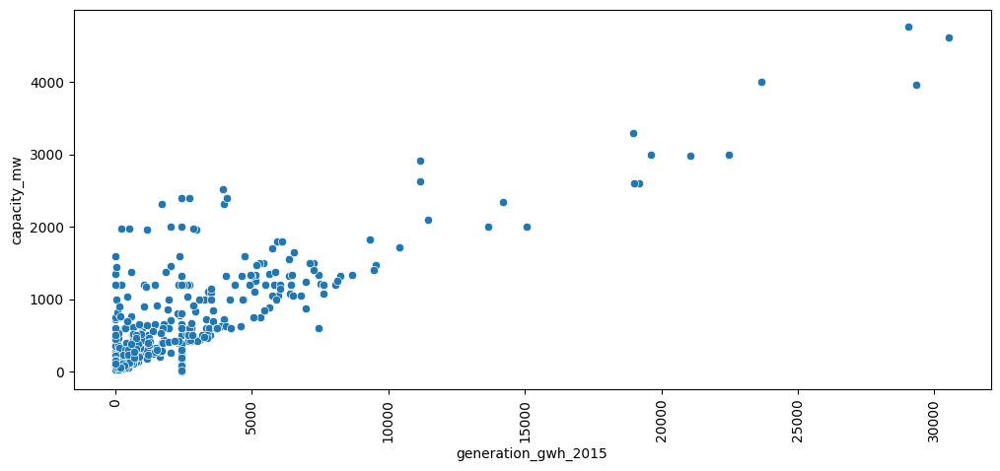

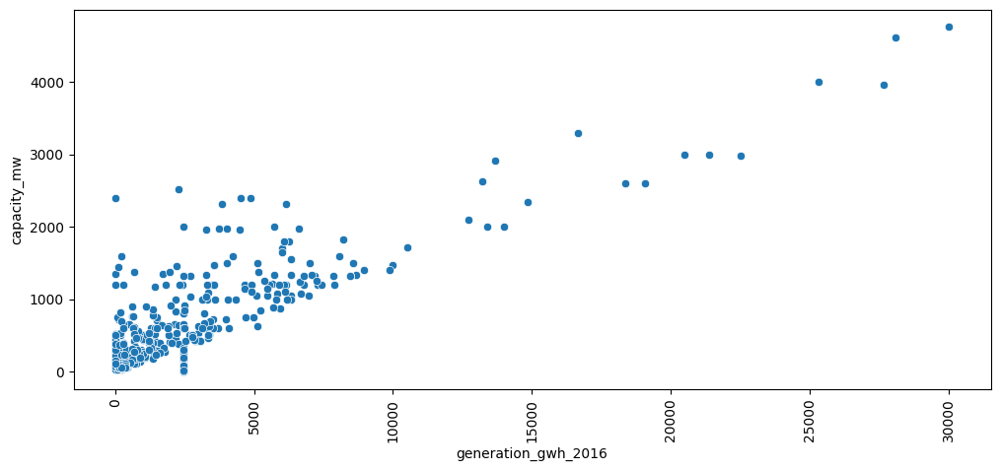

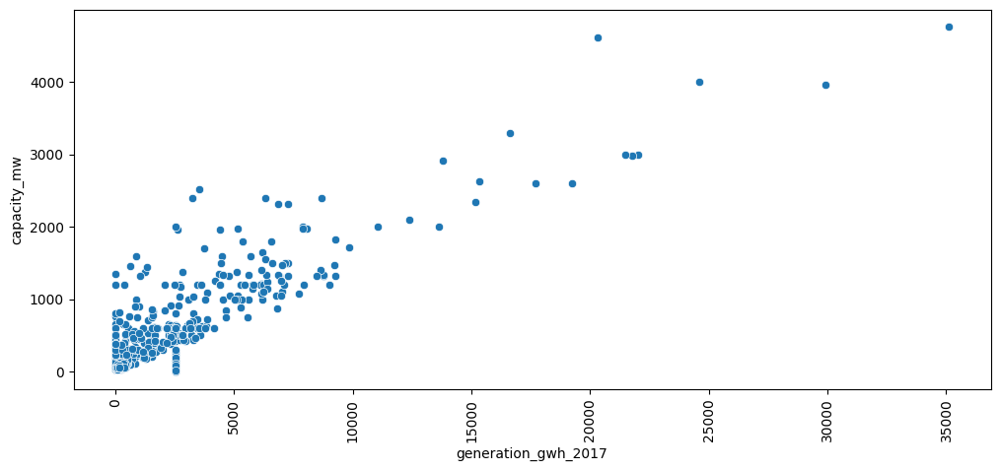

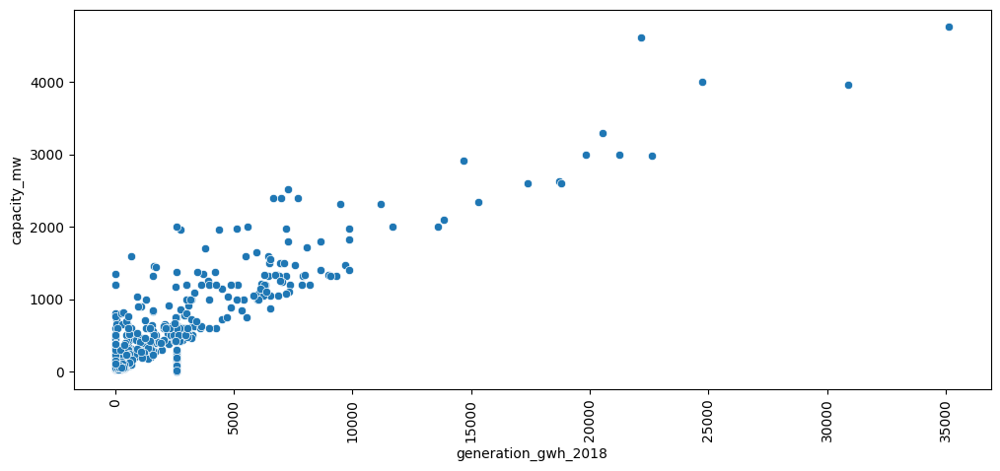

In [37]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='capacity_mw',data=df)
    plt.xticks(rotation=90)

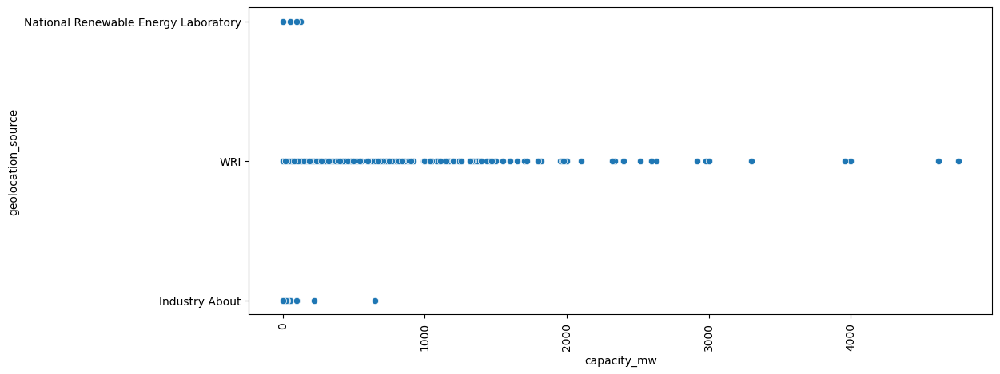

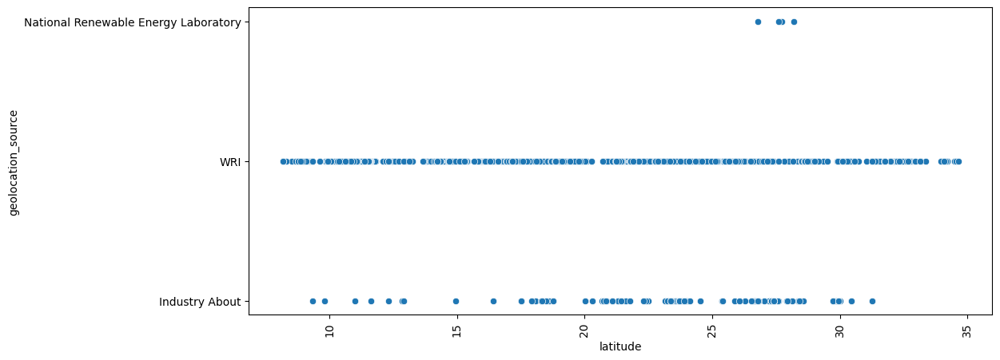

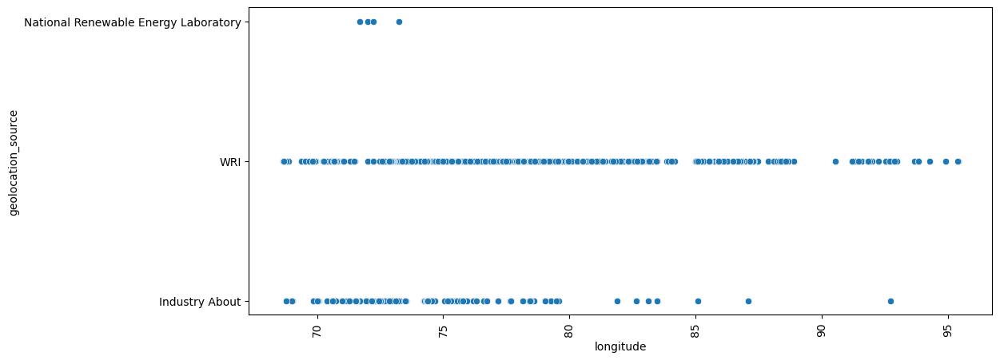

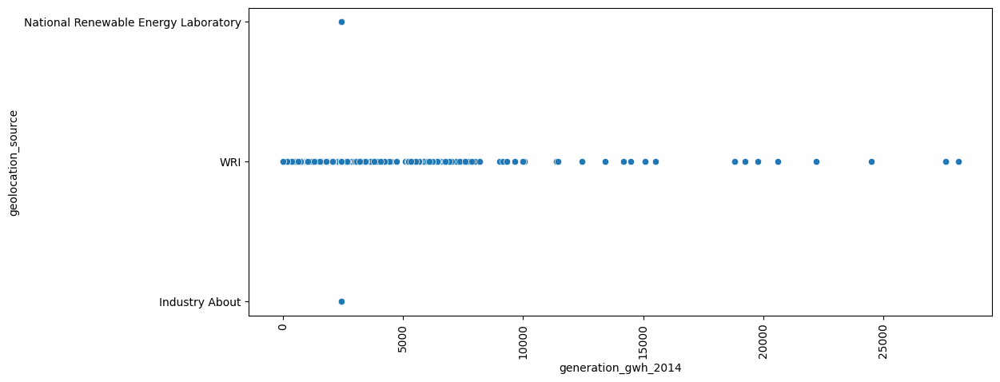

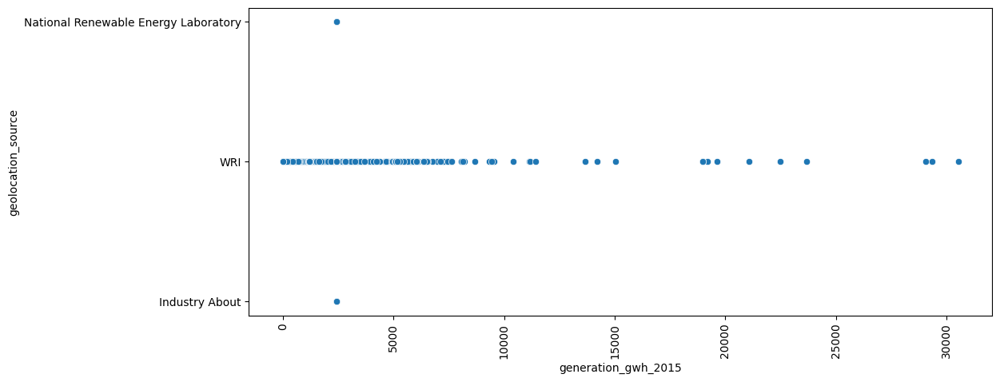

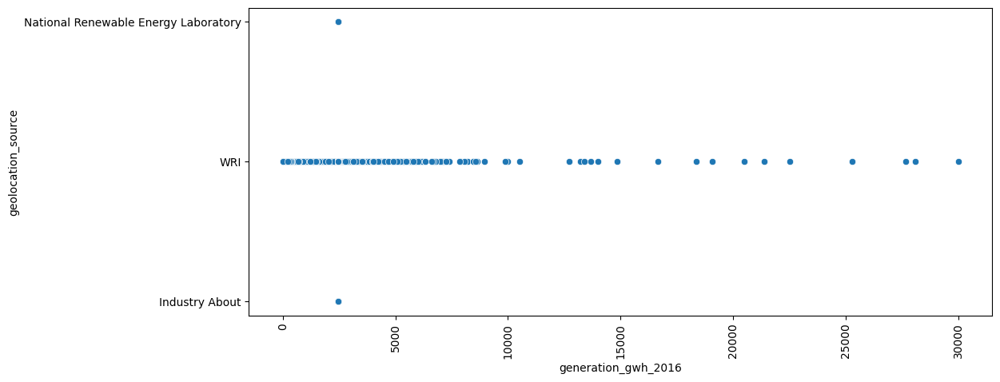

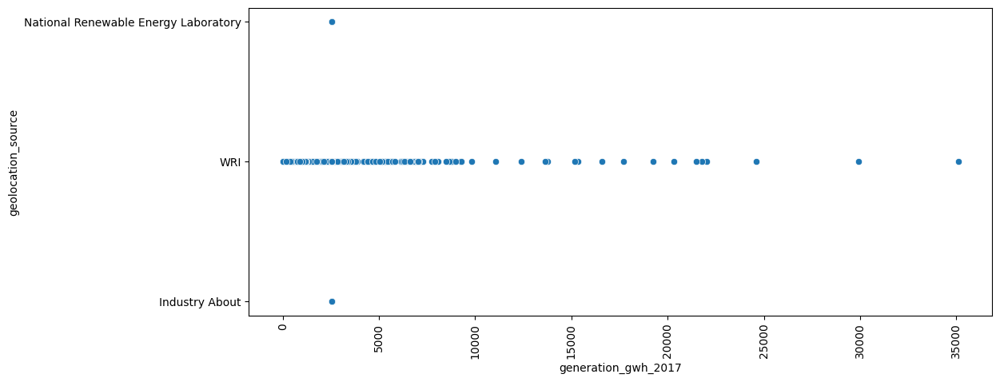

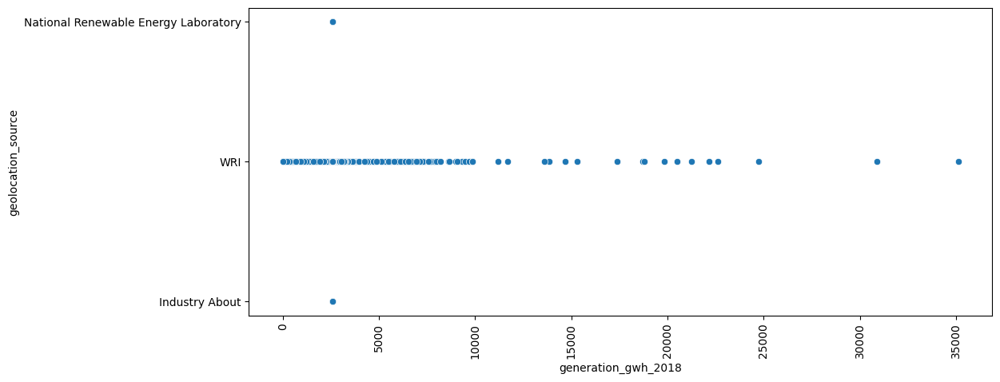

In [38]:
# Bivariate analysis

# Scaterplot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='geolocation_source',data=df)
    plt.xticks(rotation=90)

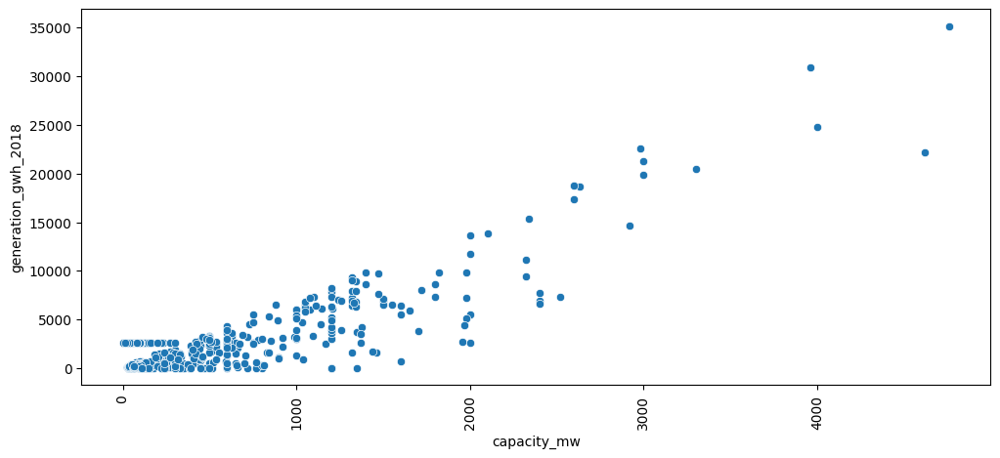

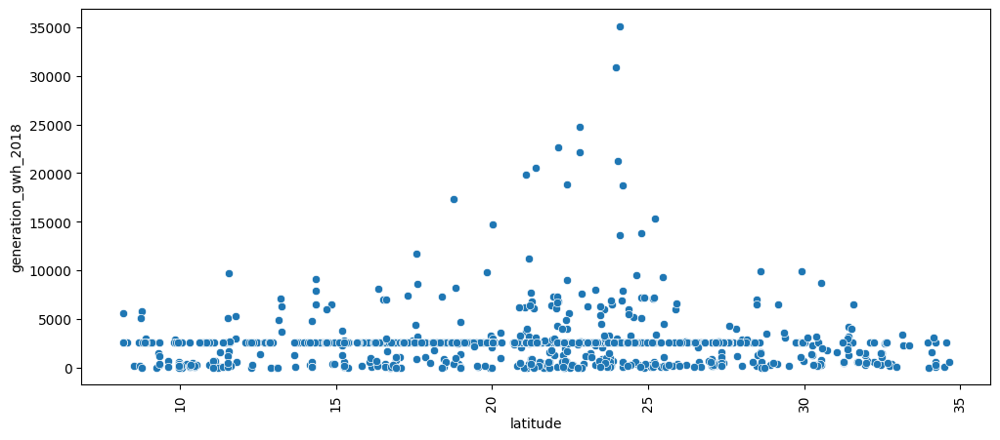

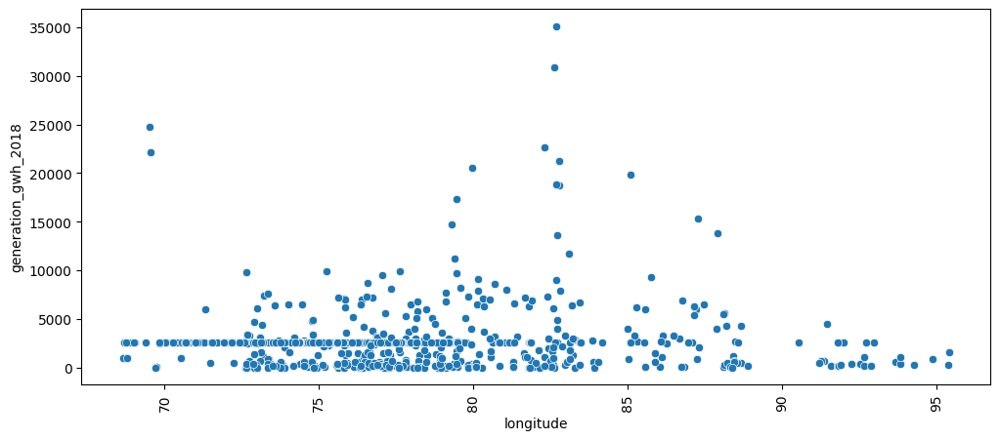

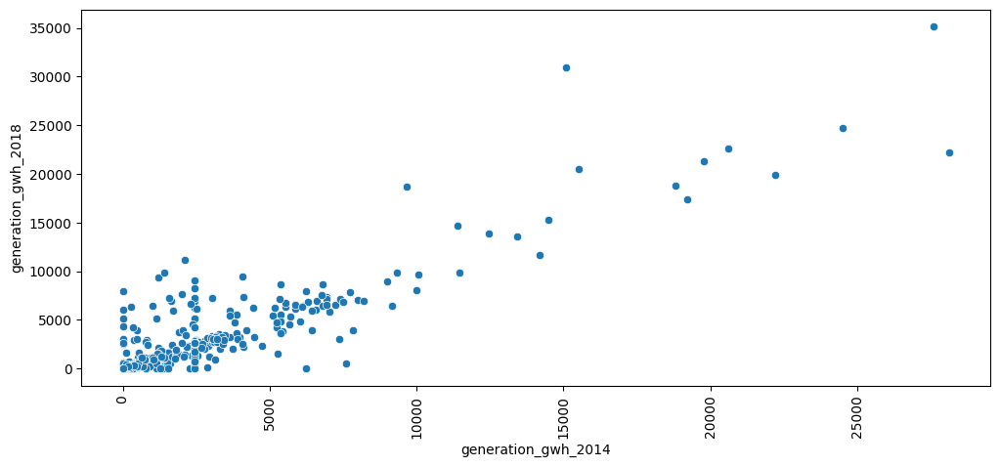

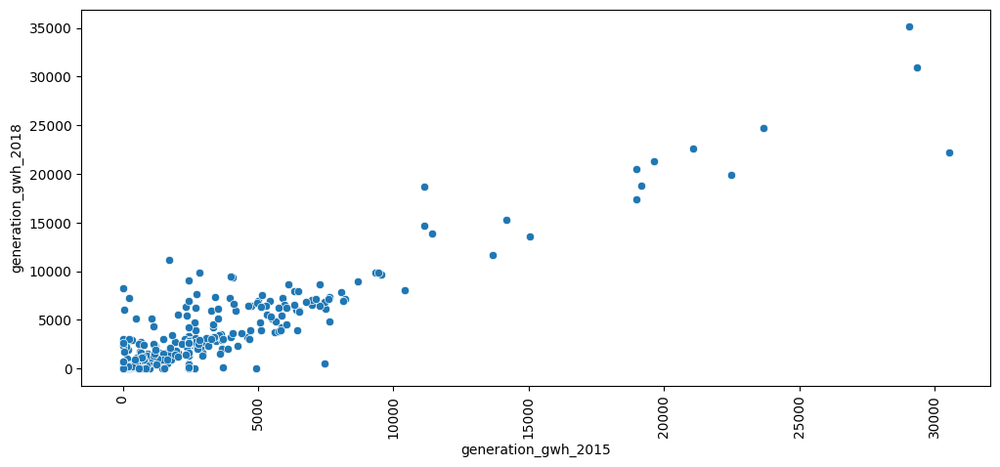

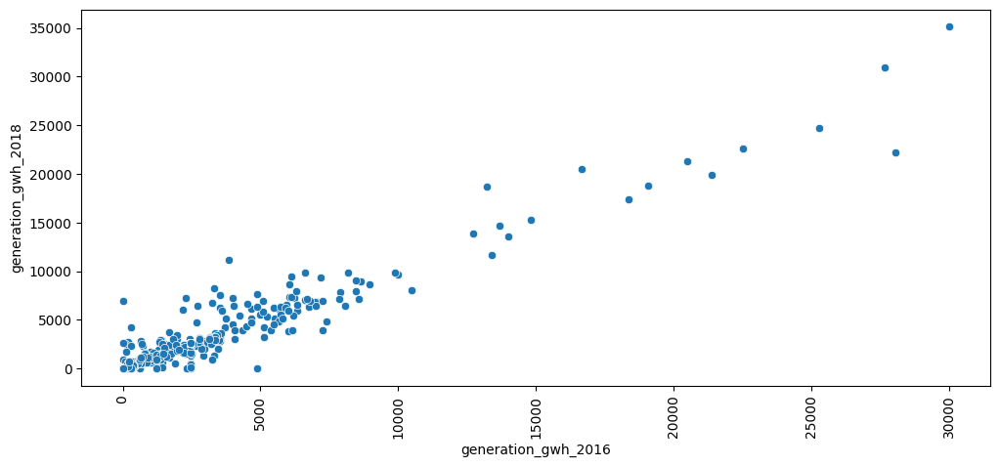

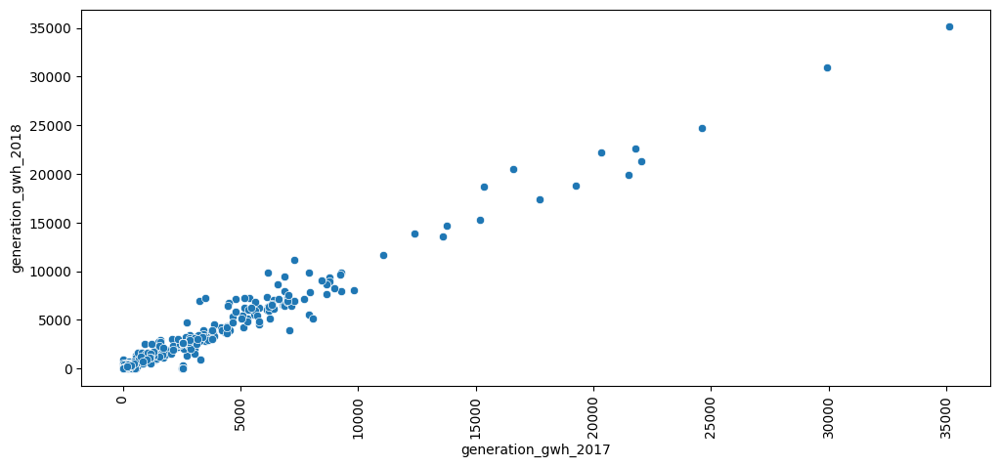

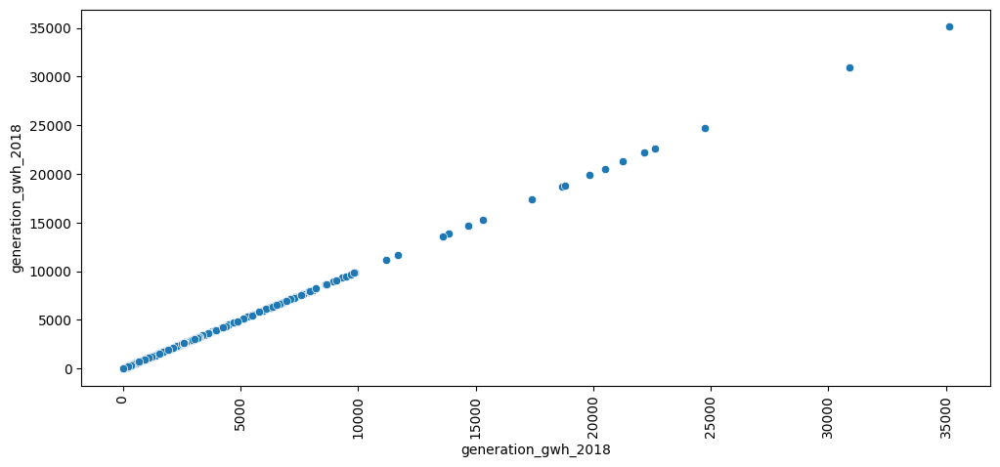

In [39]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2018',data=df)
    plt.xticks(rotation=90)

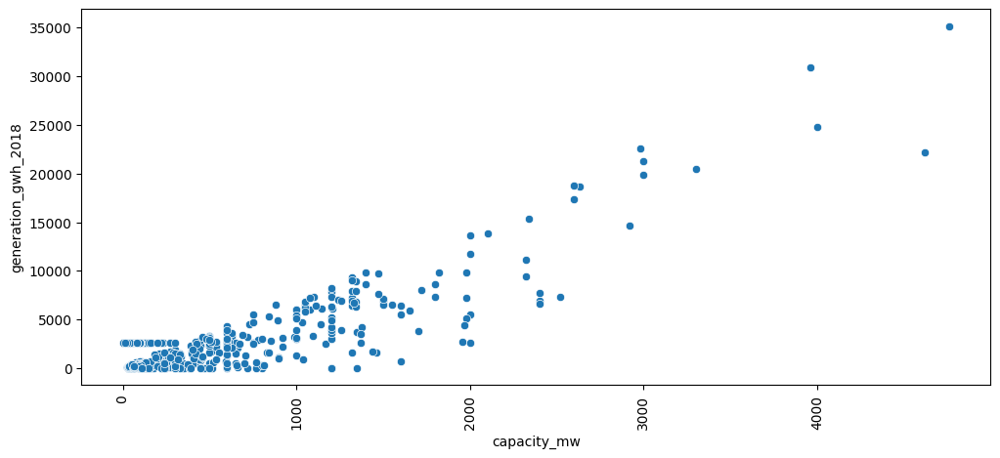

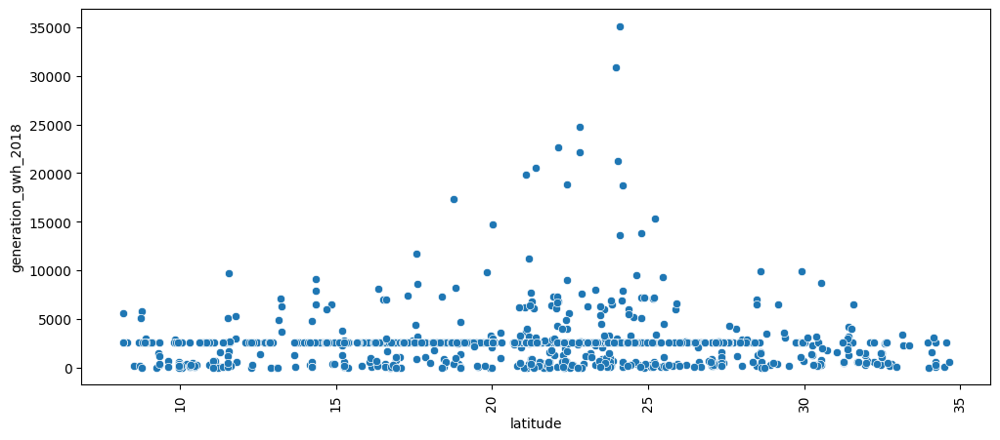

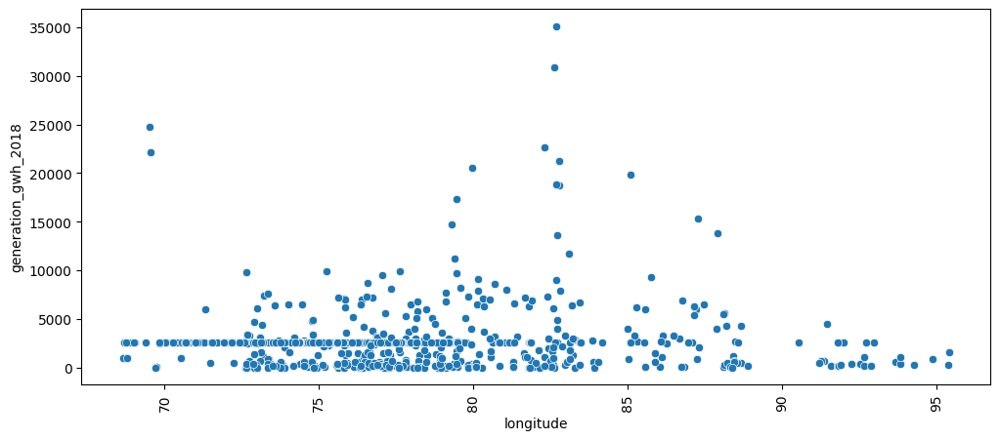

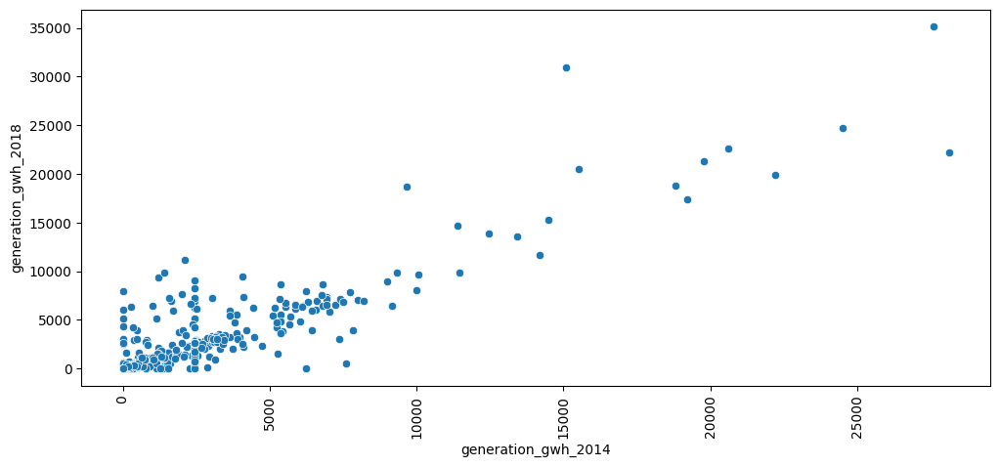

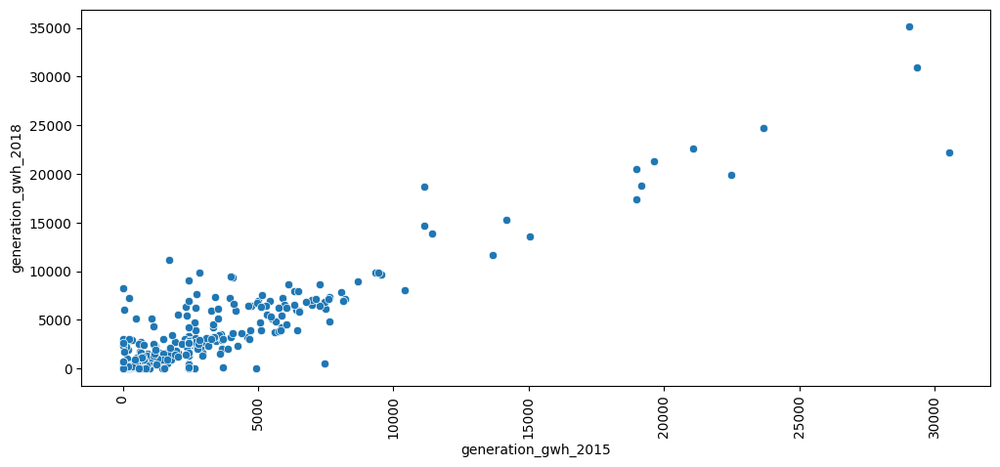

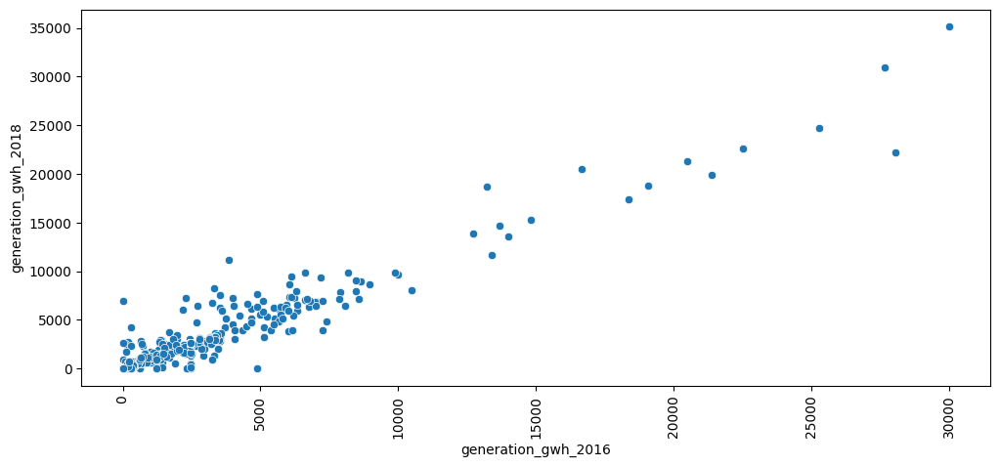

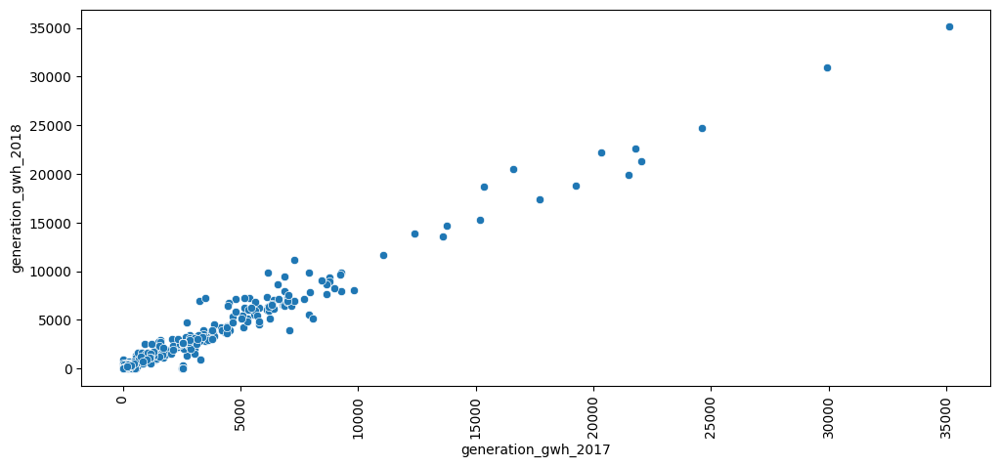

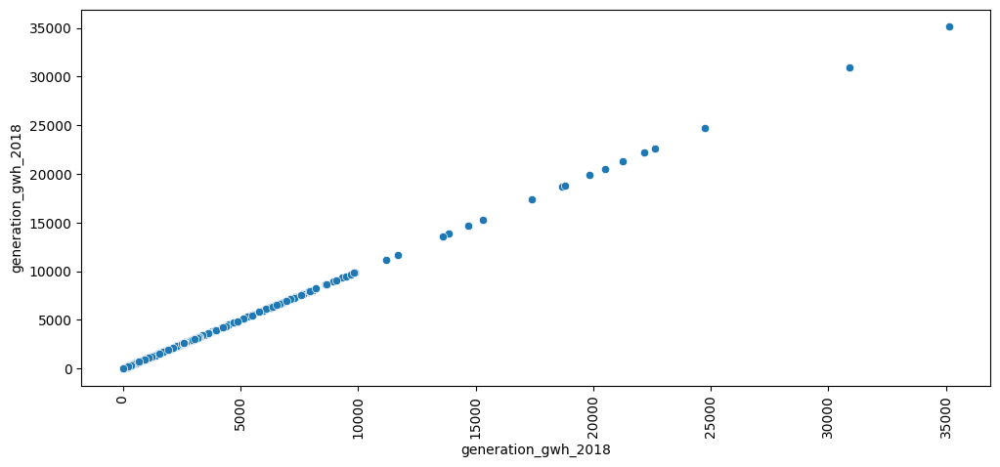

In [40]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2018',data=df)
    plt.xticks(rotation=90)

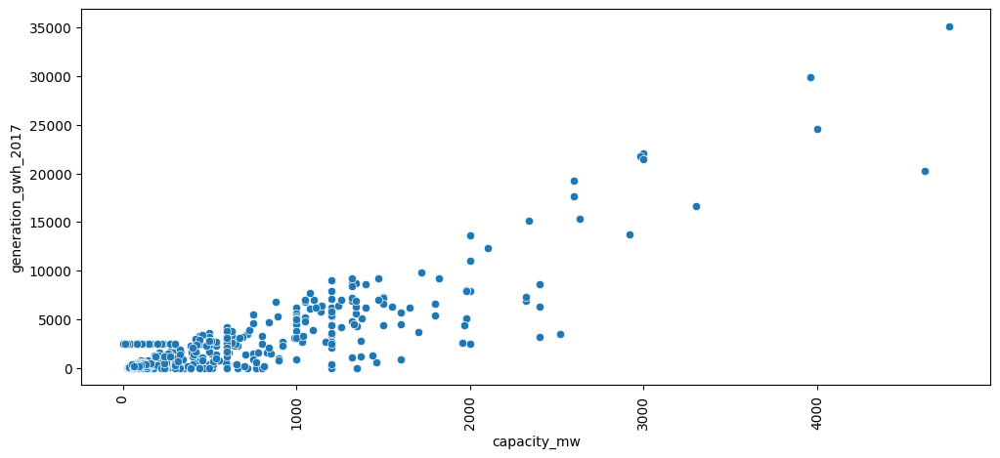

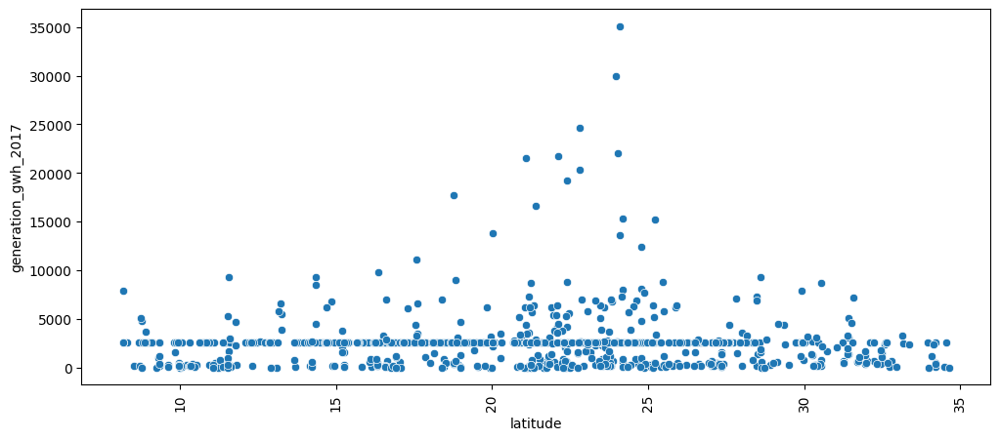

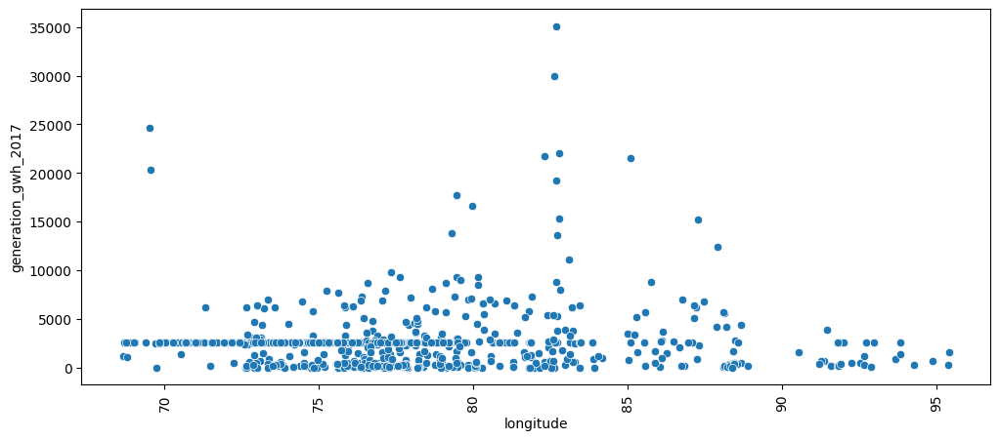

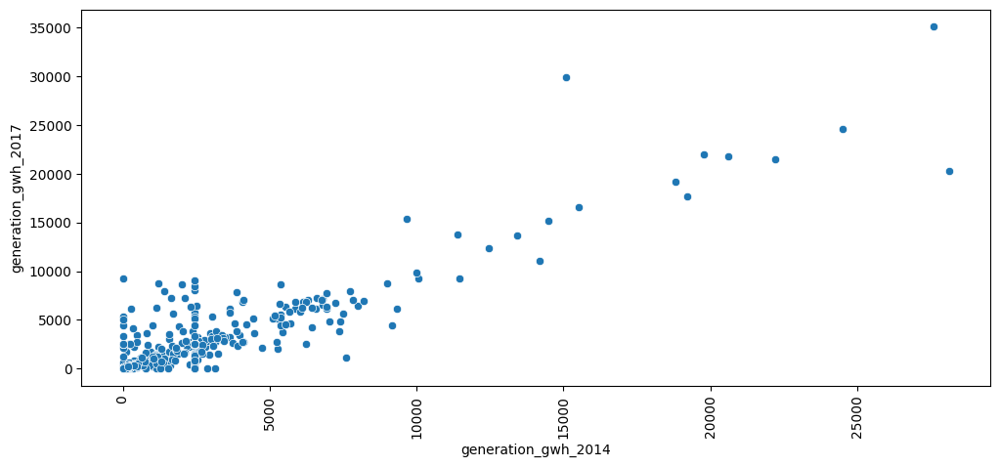

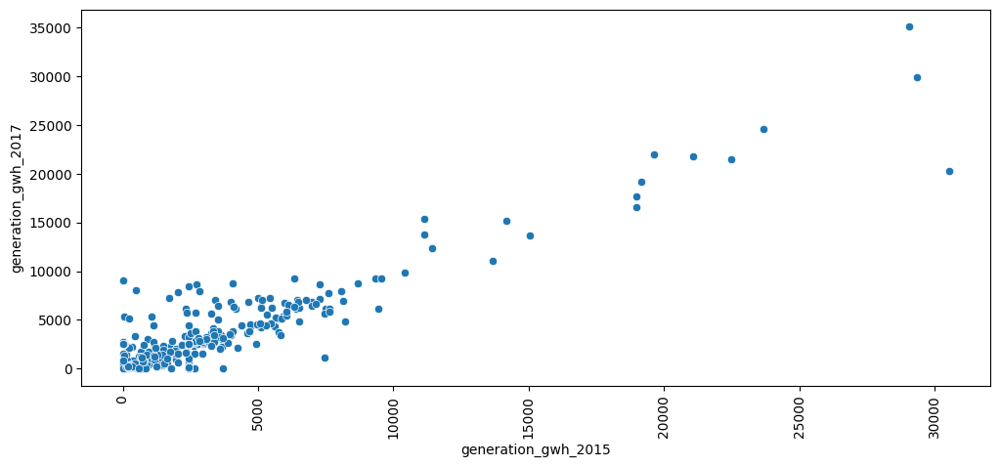

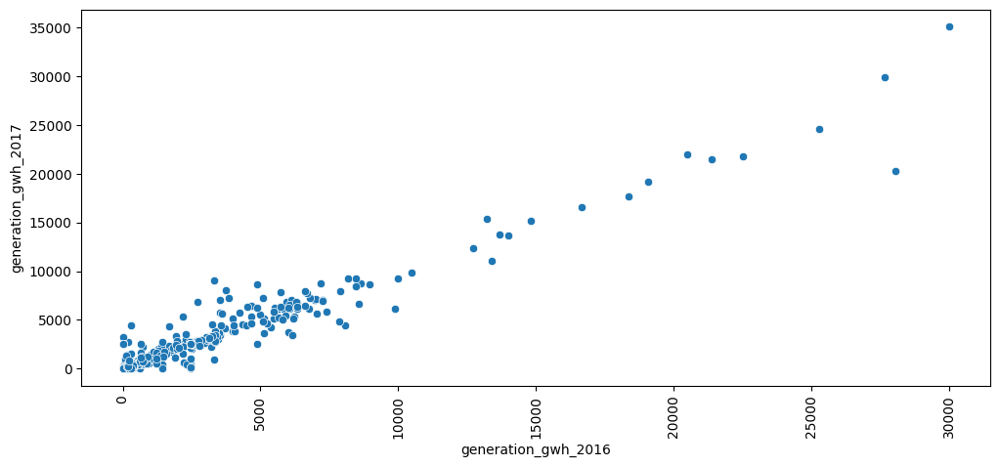

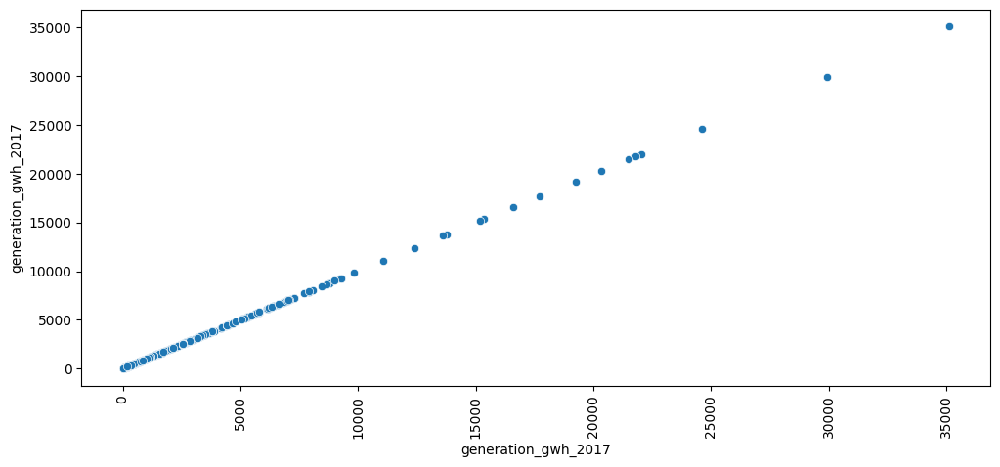

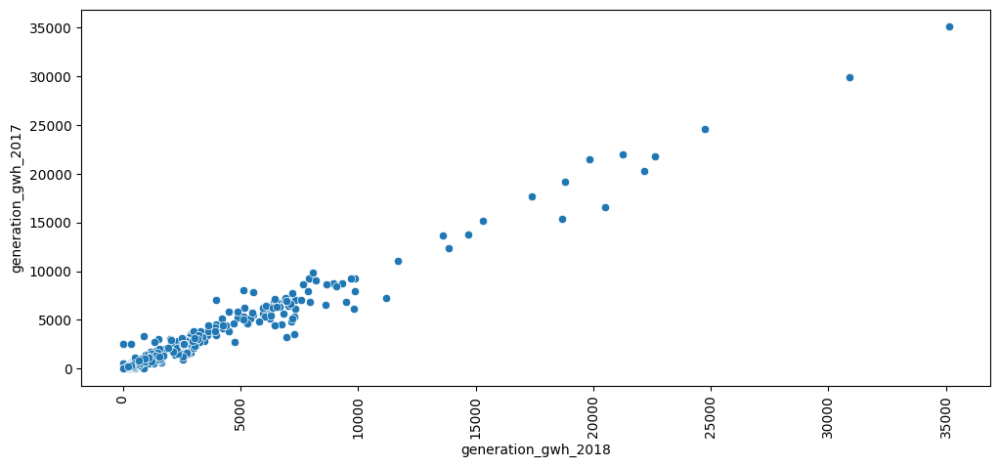

In [41]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2017',data=df)
    plt.xticks(rotation=90)

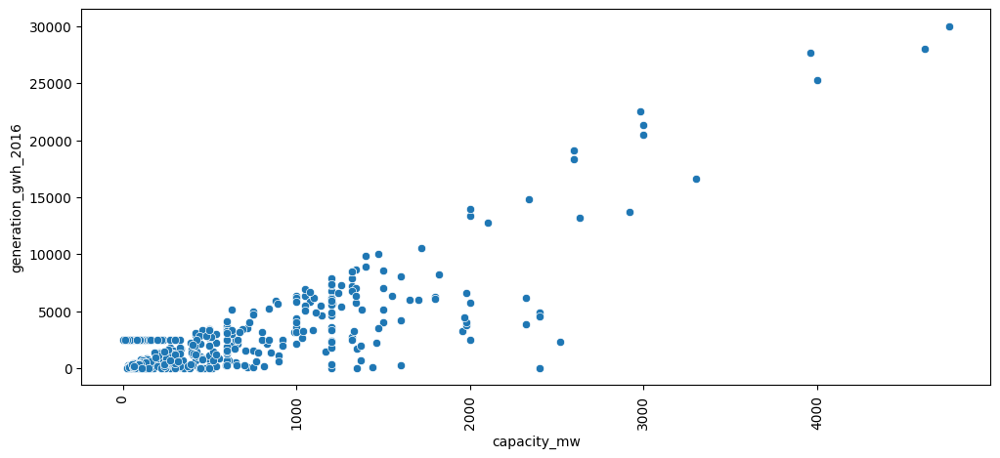

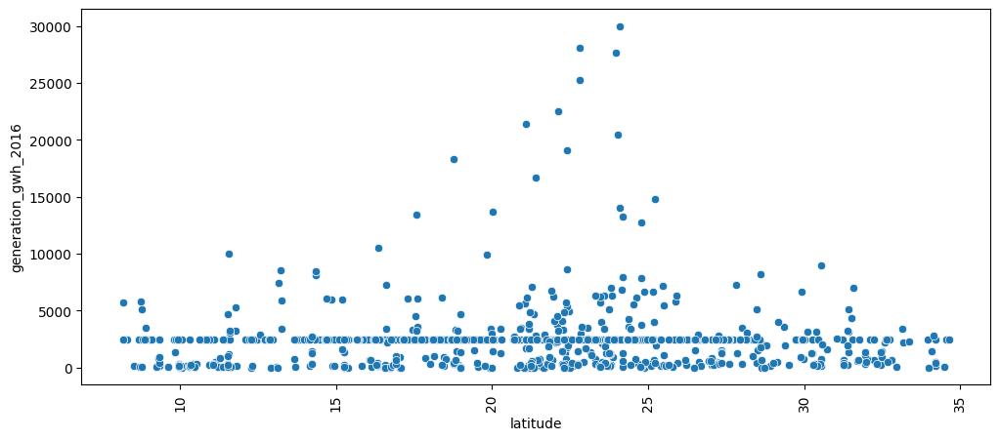

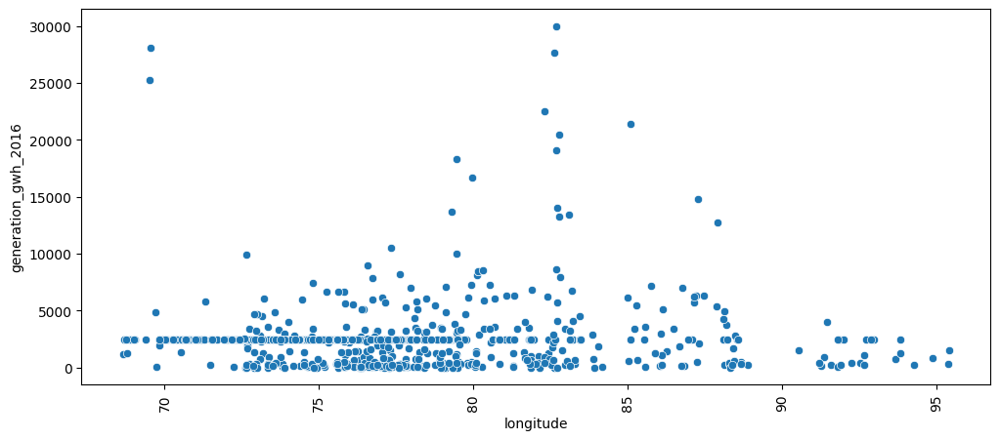

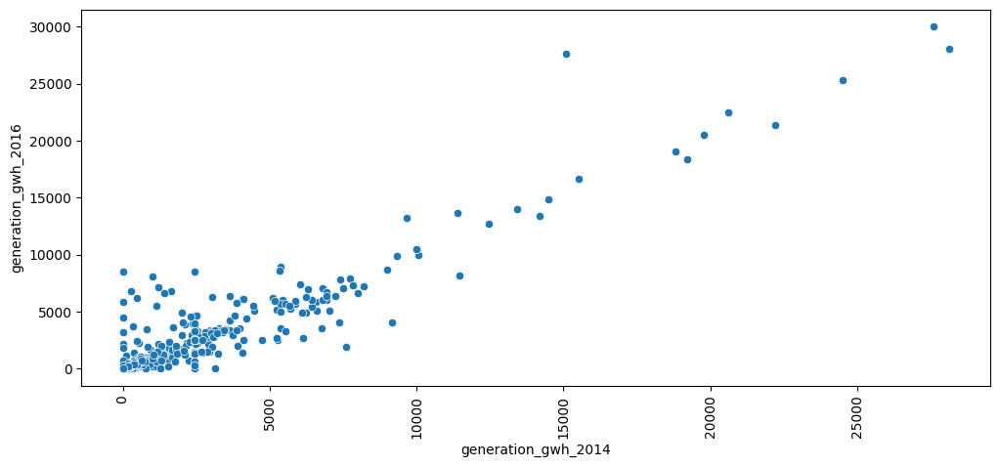

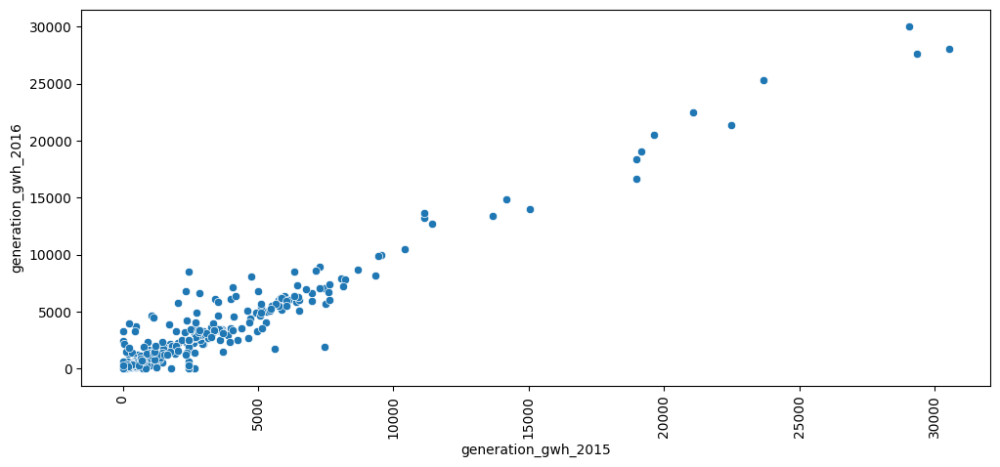

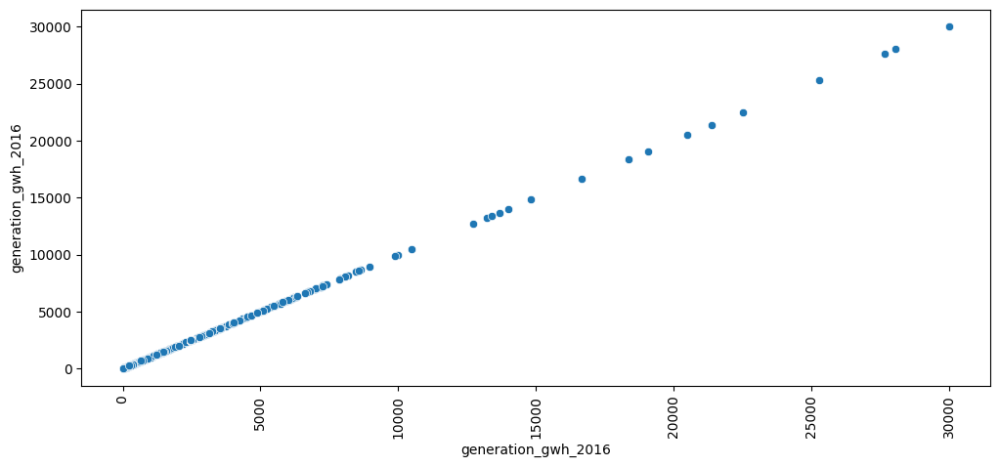

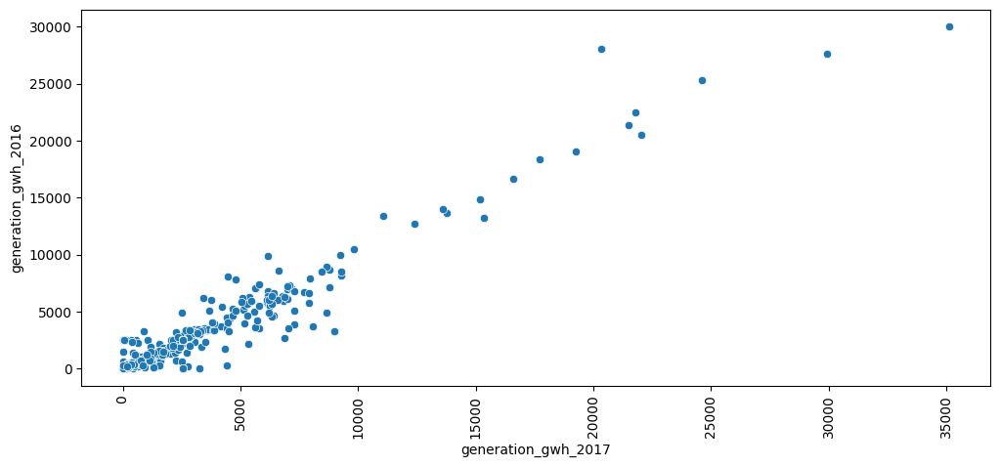

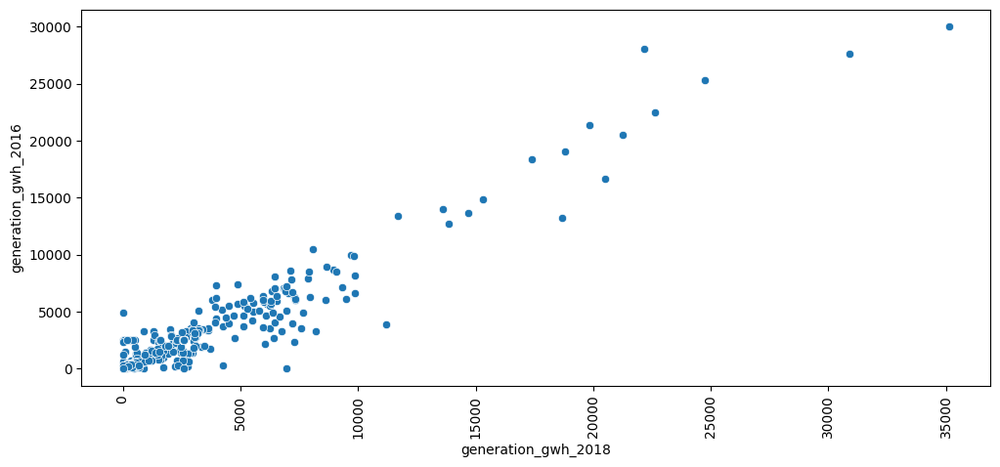

In [42]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2016',data=df)
    plt.xticks(rotation=90)

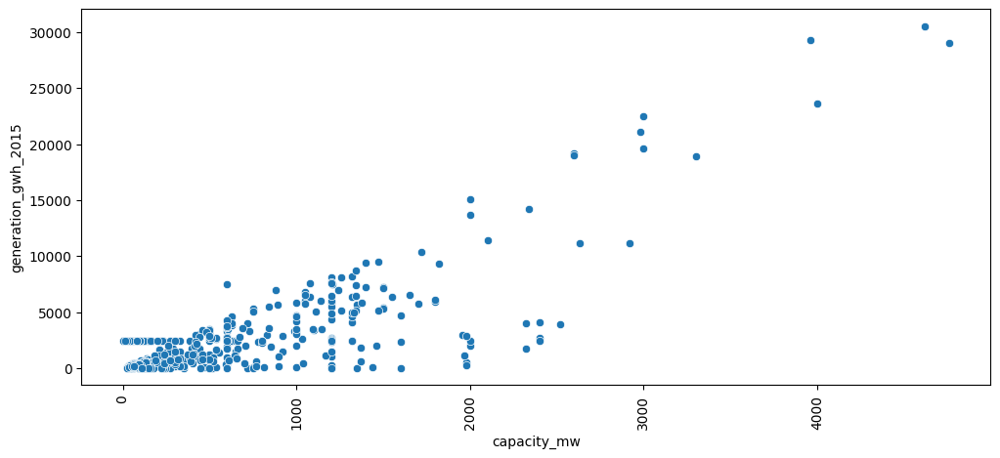

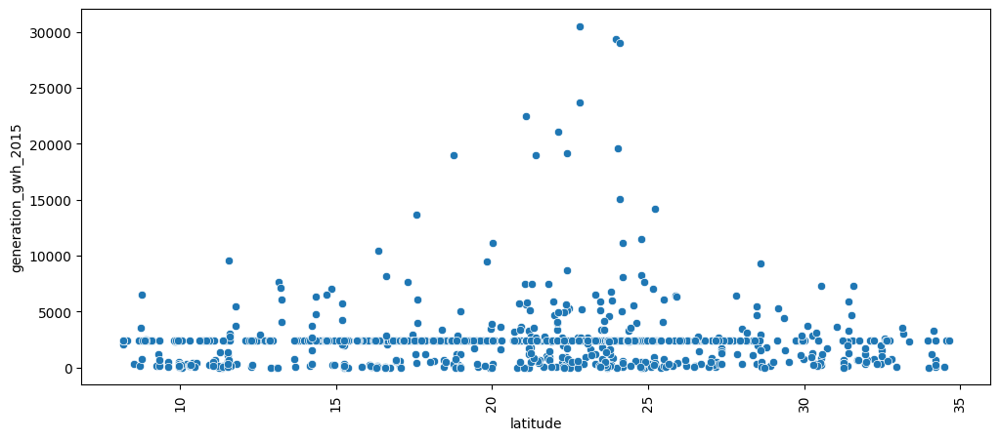

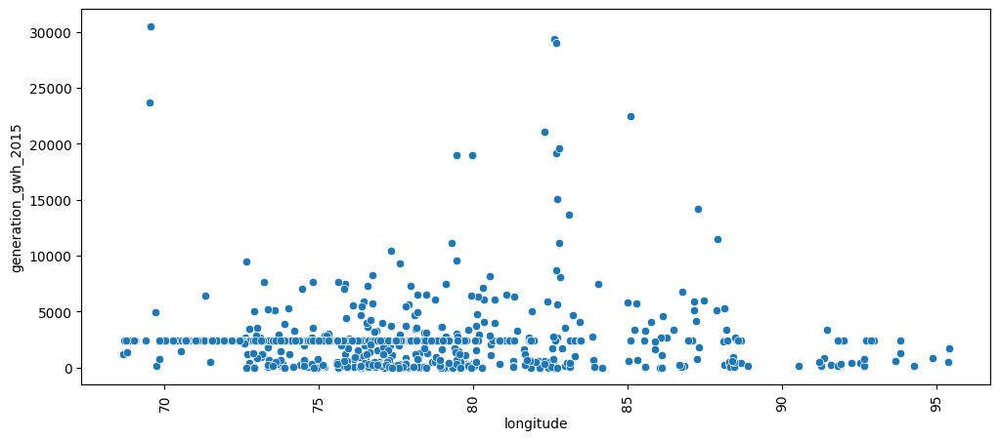

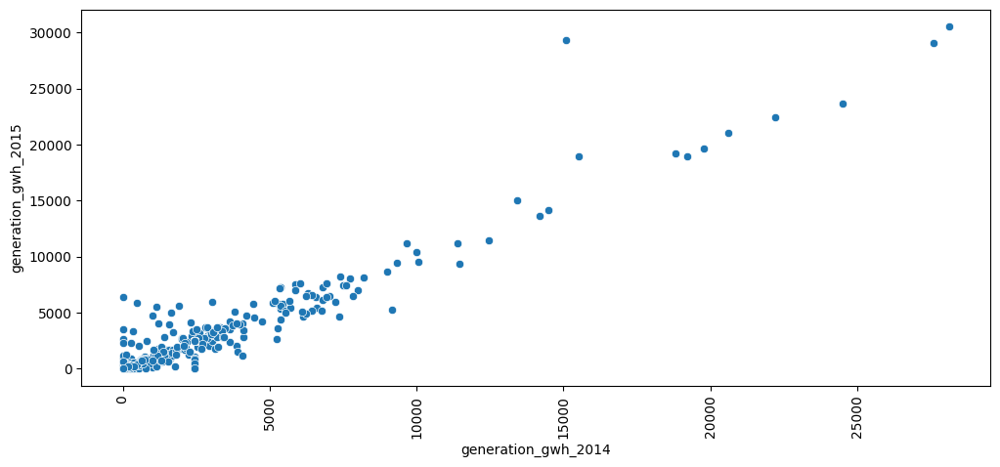

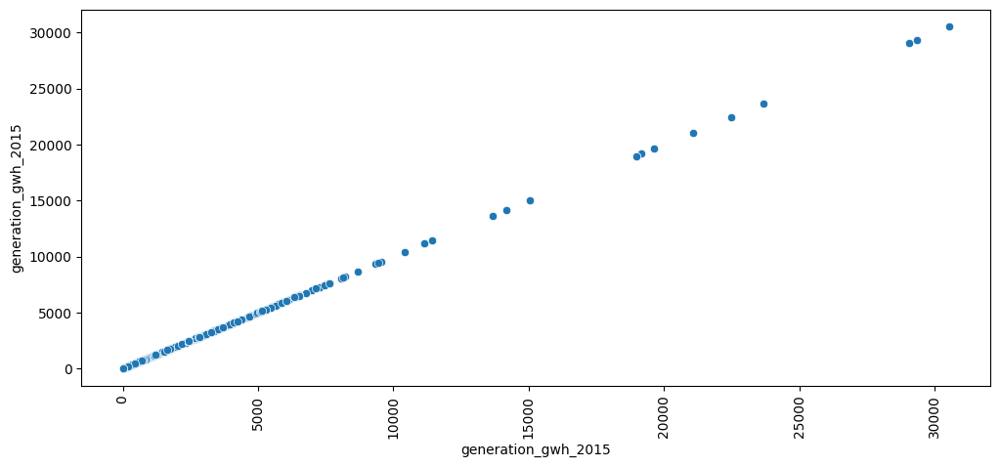

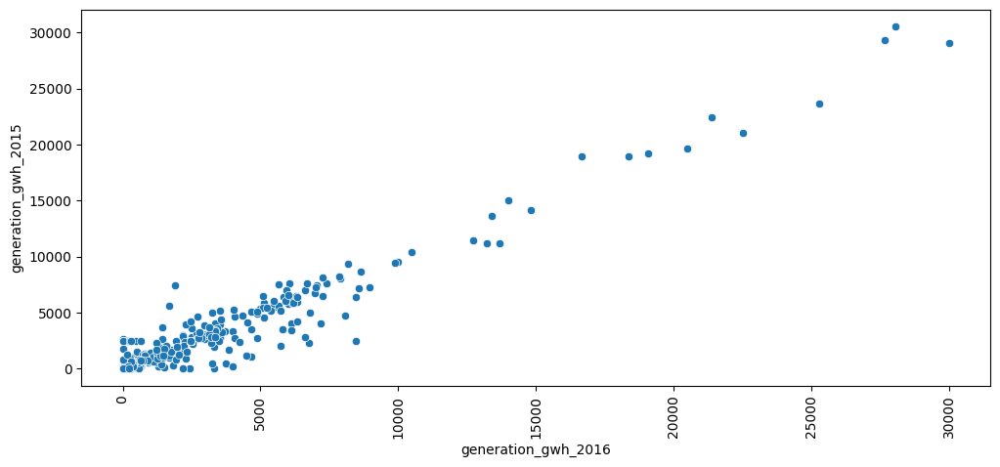

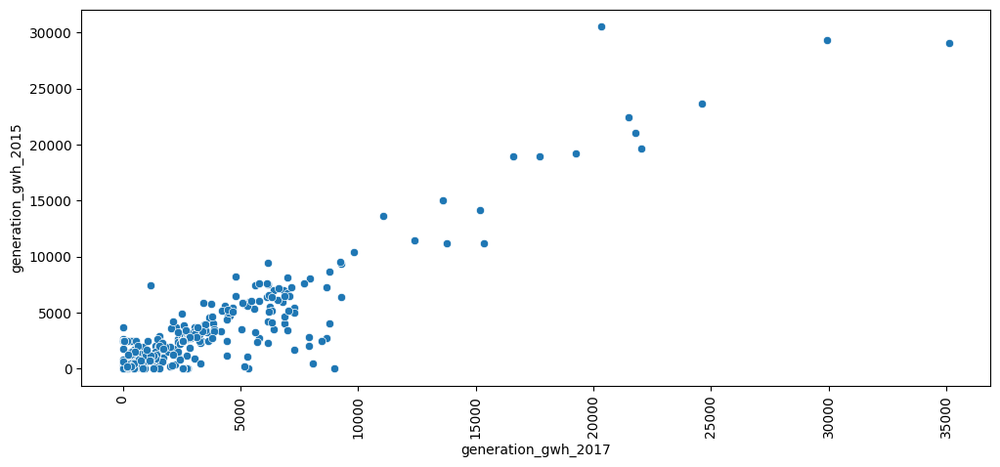

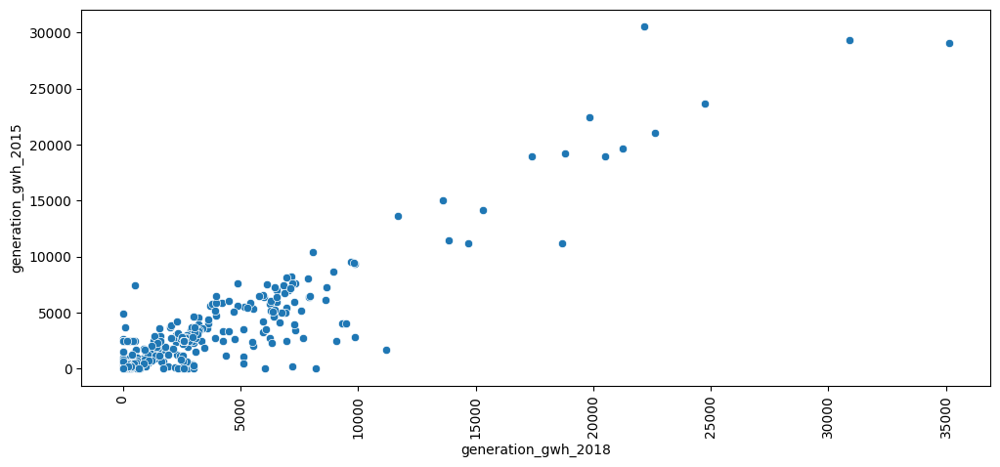

In [43]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2015',data=df)
    plt.xticks(rotation=90)

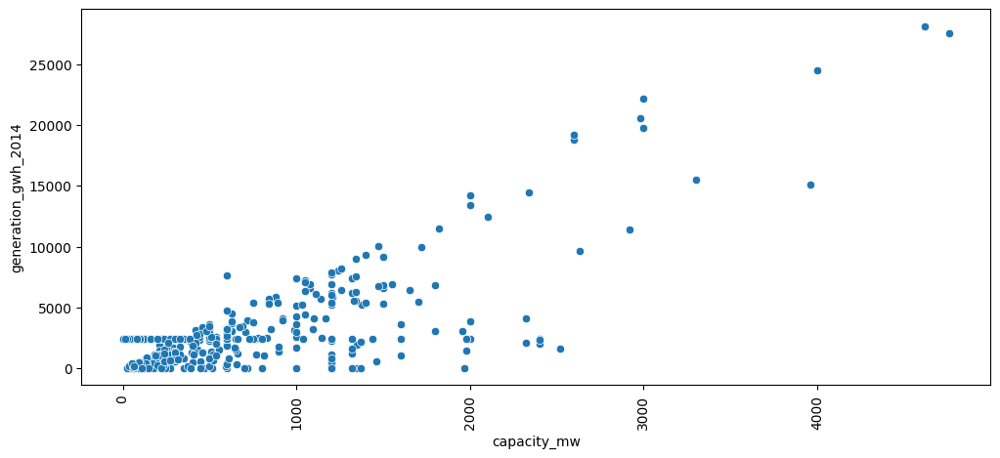

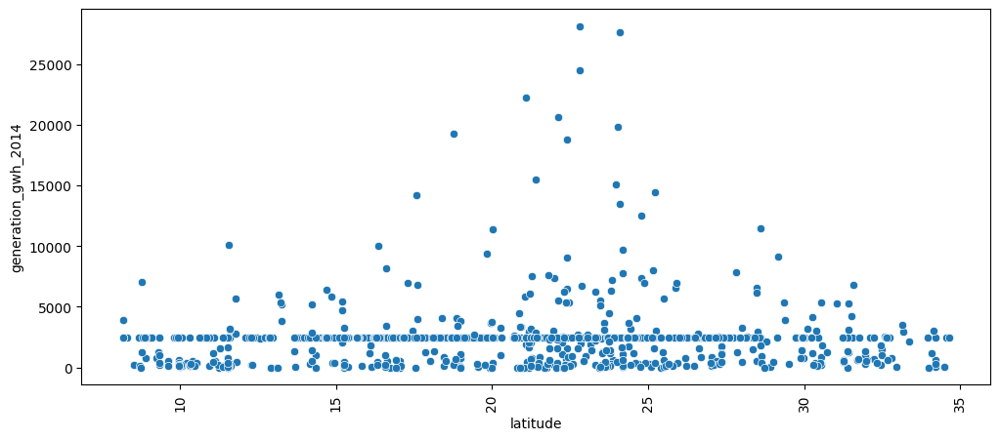

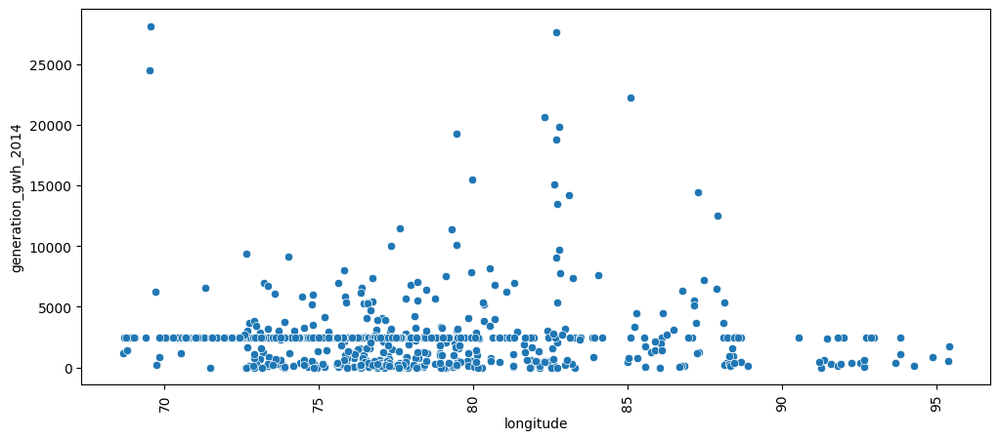

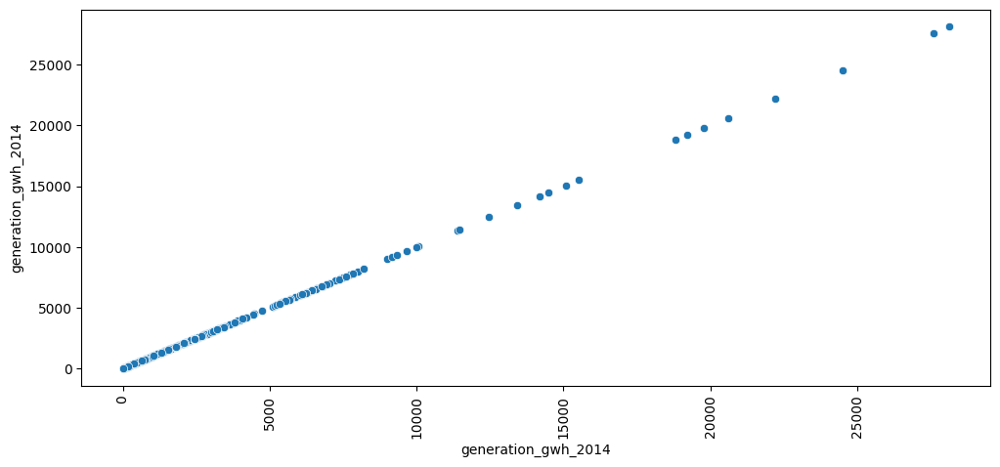

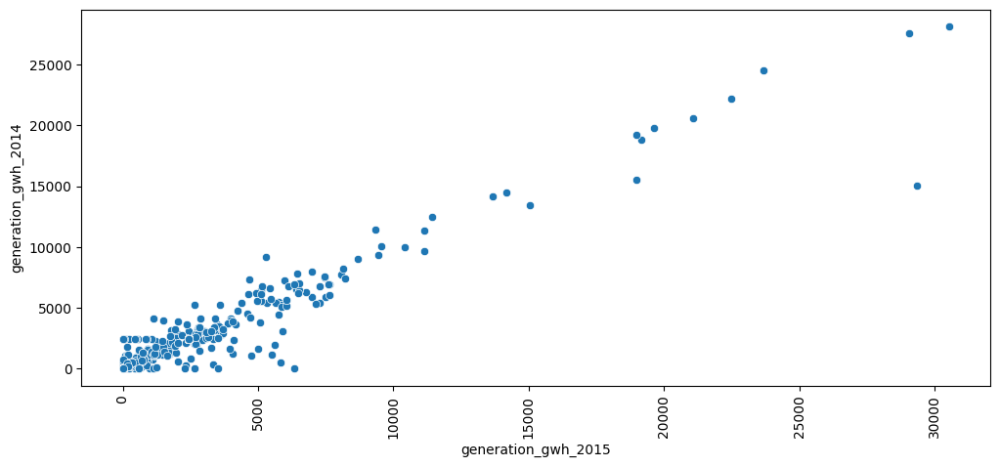

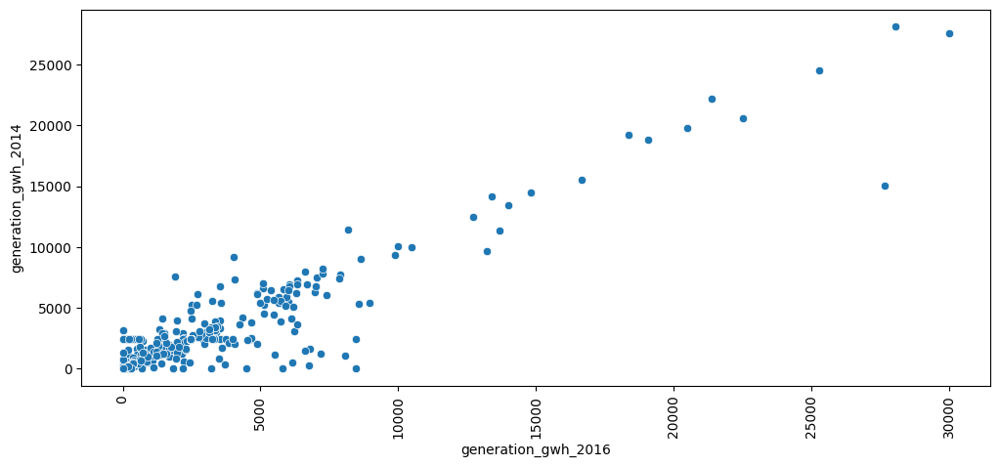

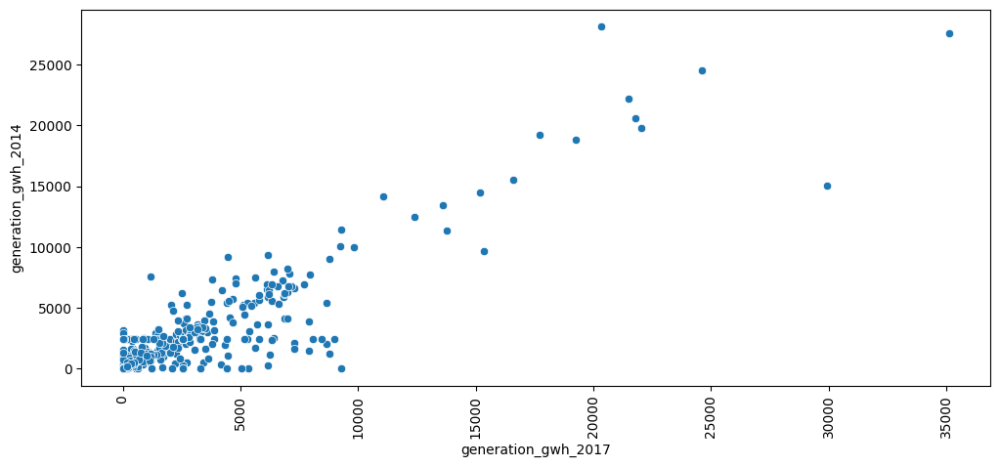

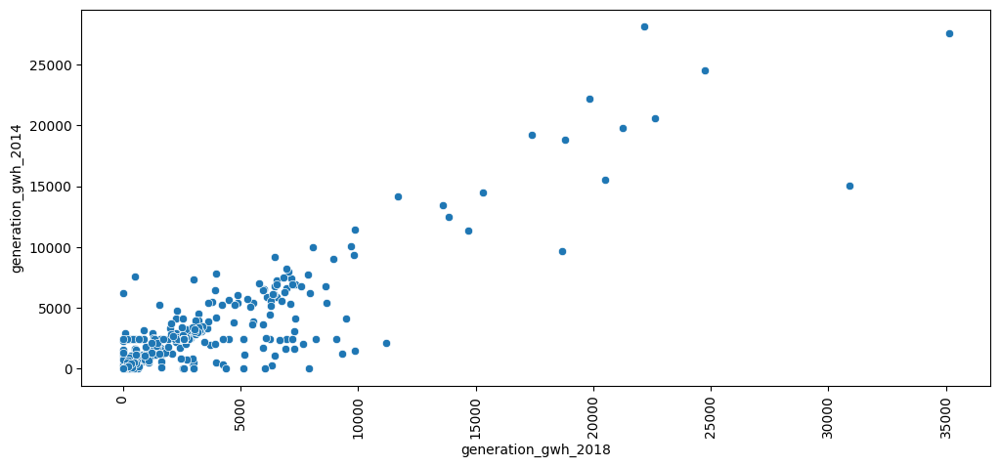

In [44]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='generation_gwh_2014',data=df)
    plt.xticks(rotation=90)

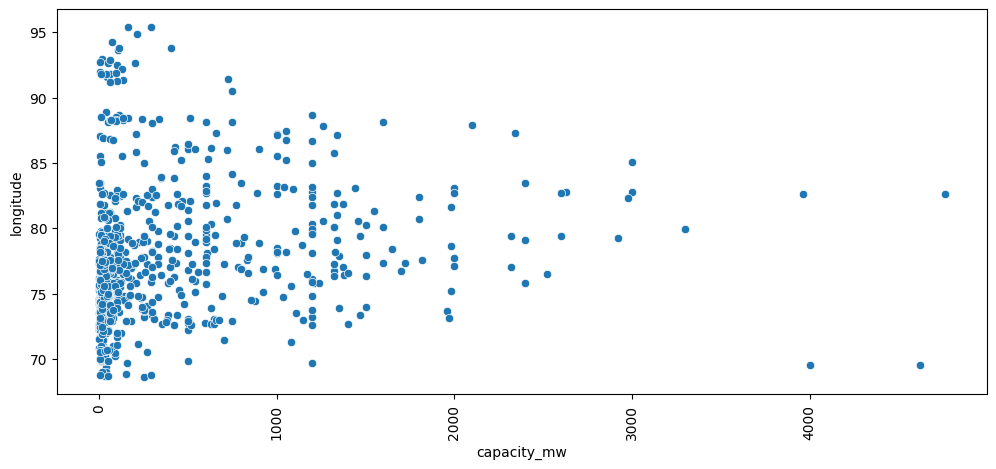

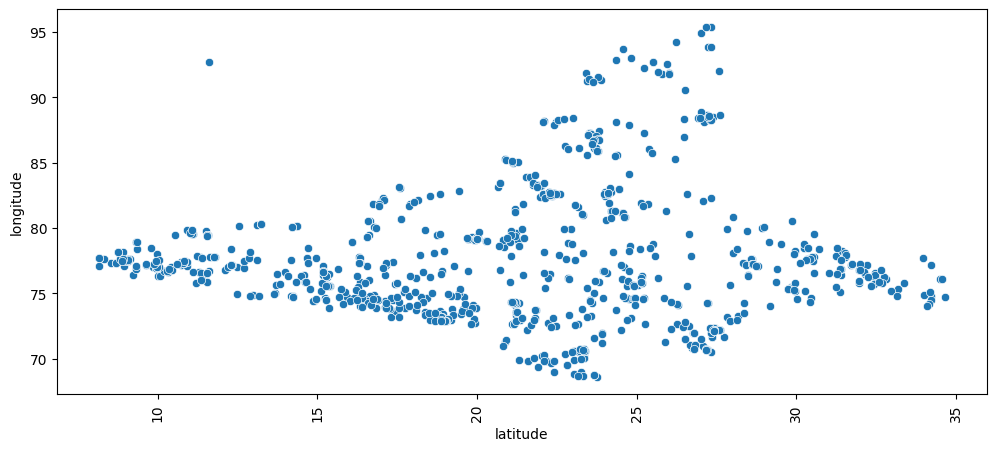

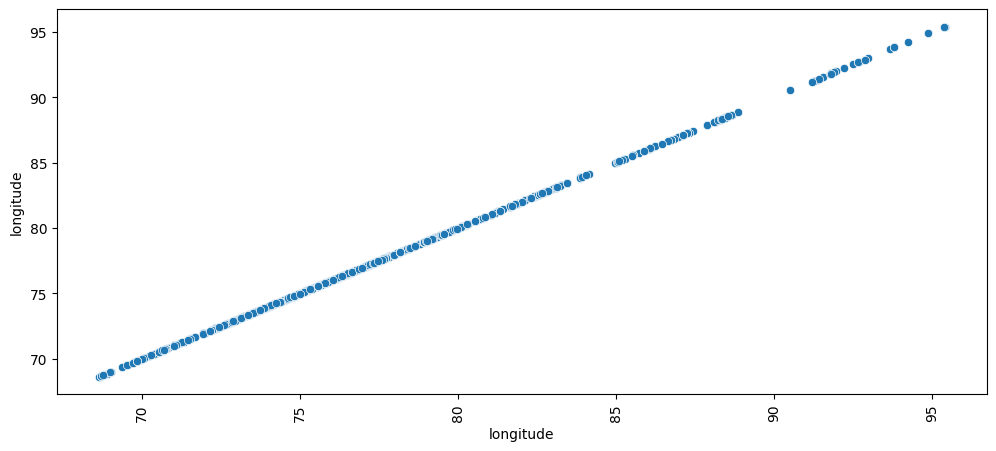

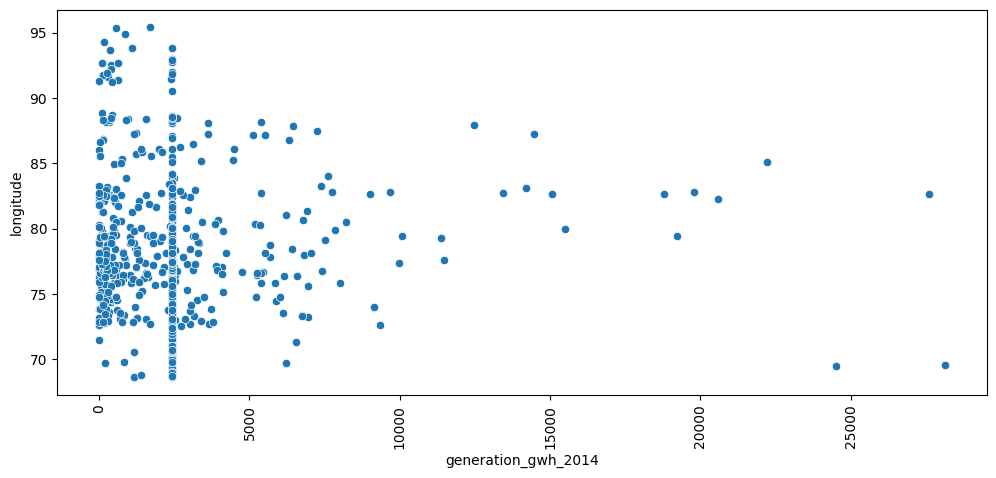

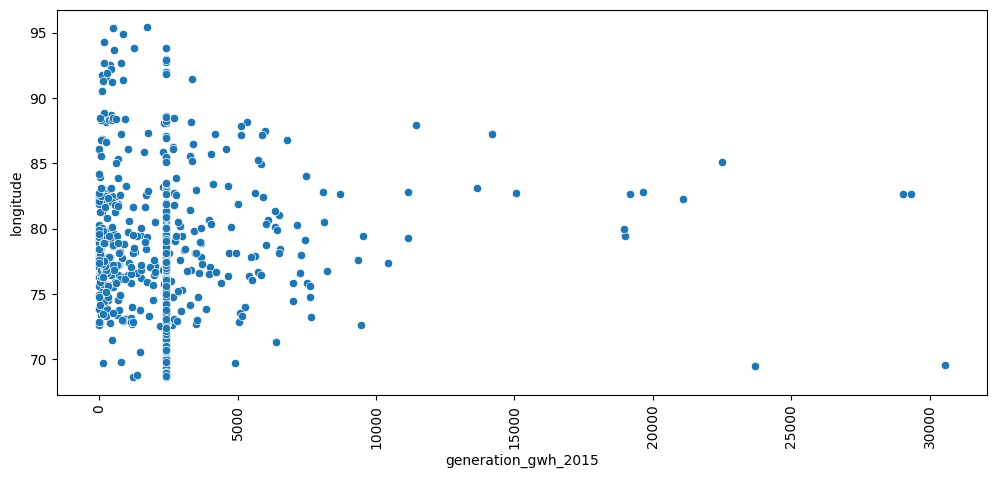

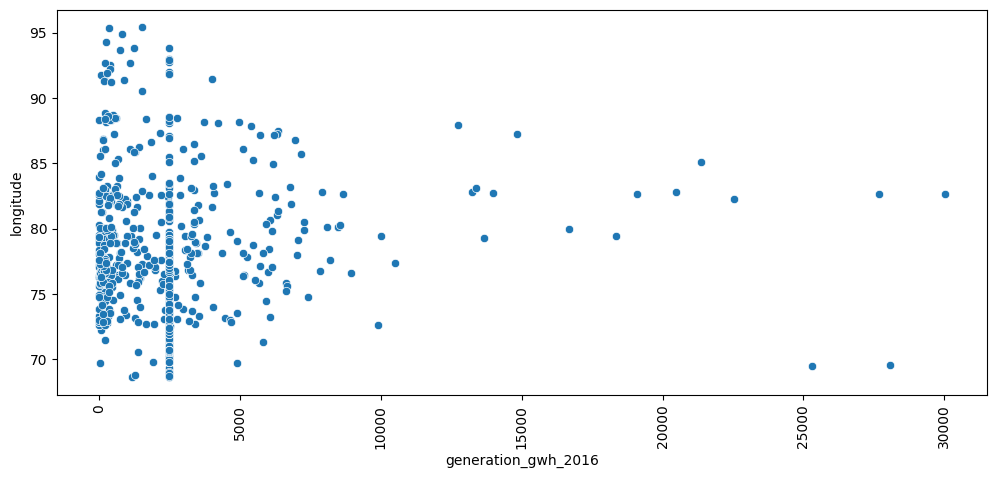

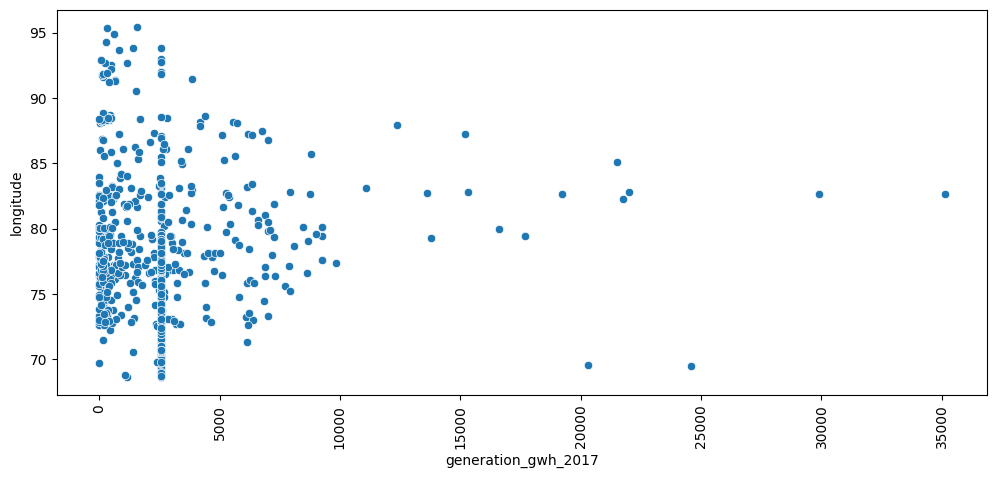

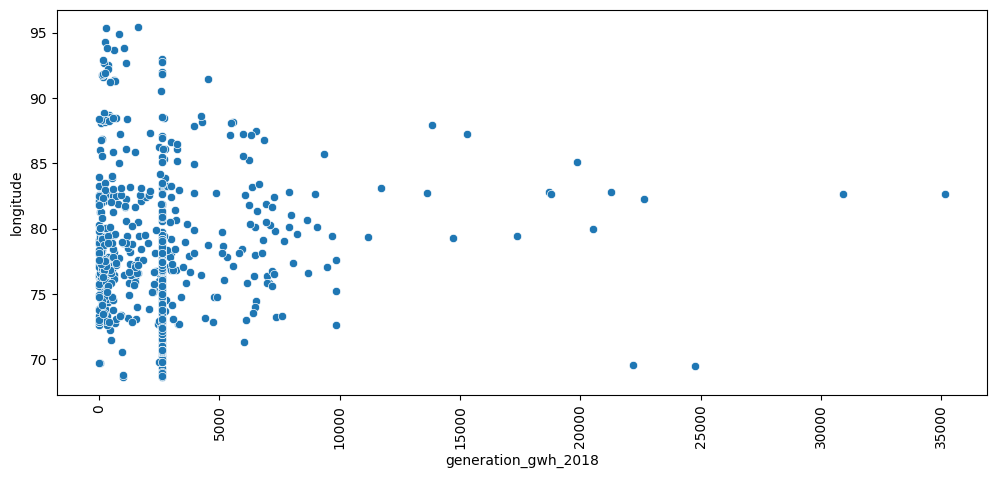

In [45]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='longitude',data=df)
    plt.xticks(rotation=90)

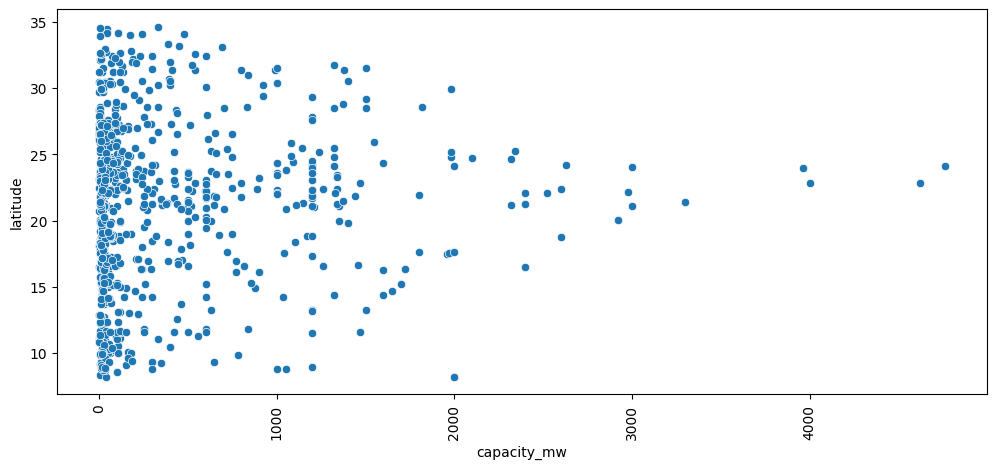

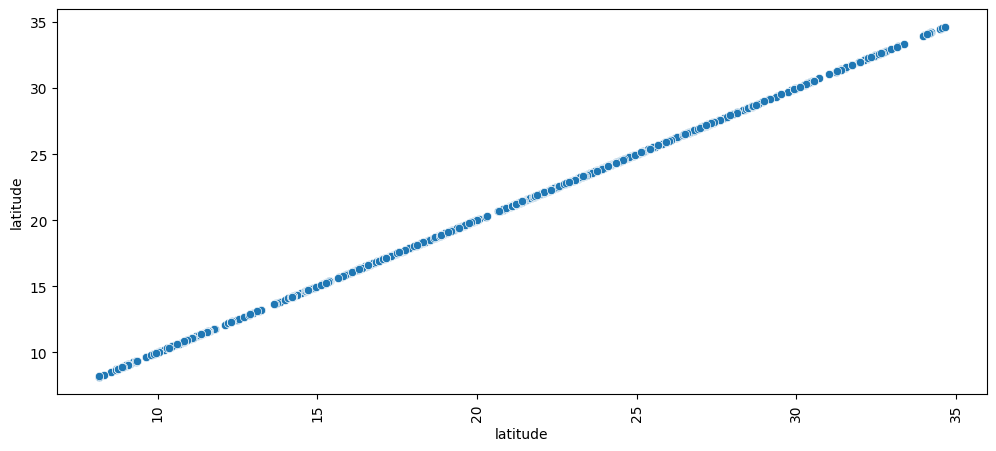

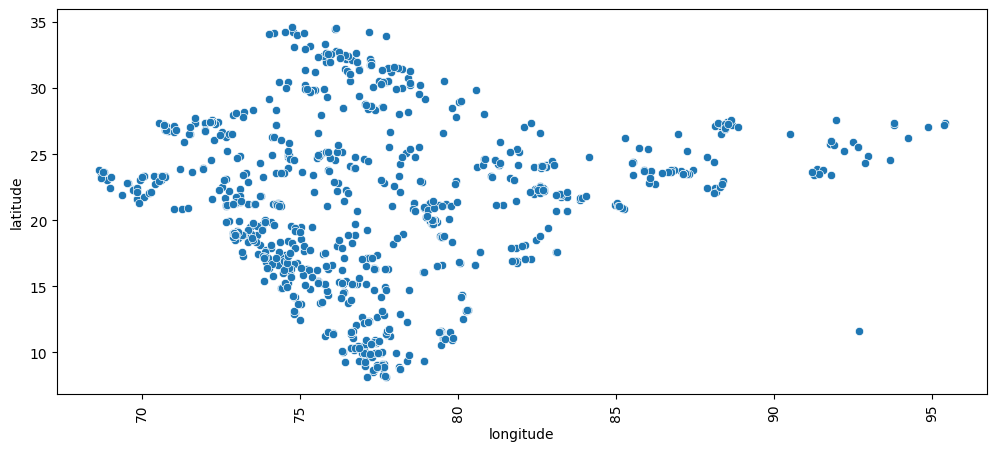

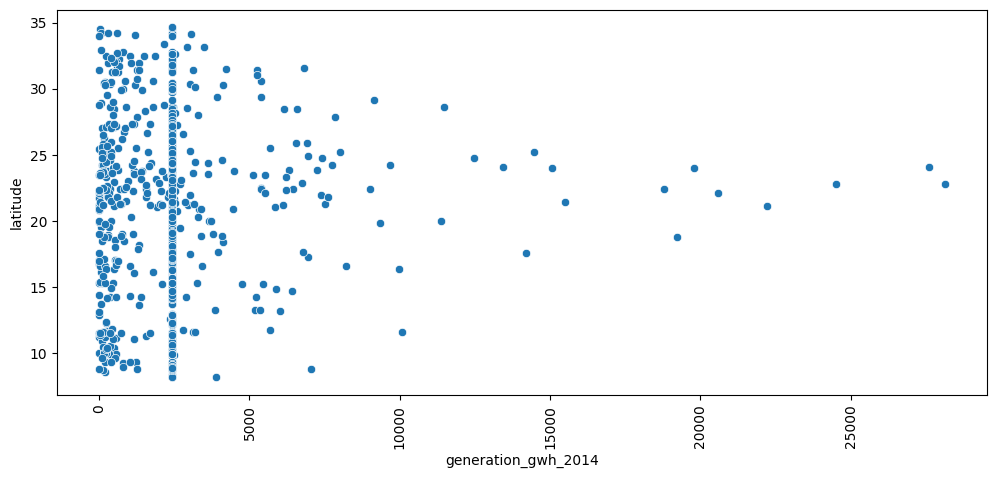

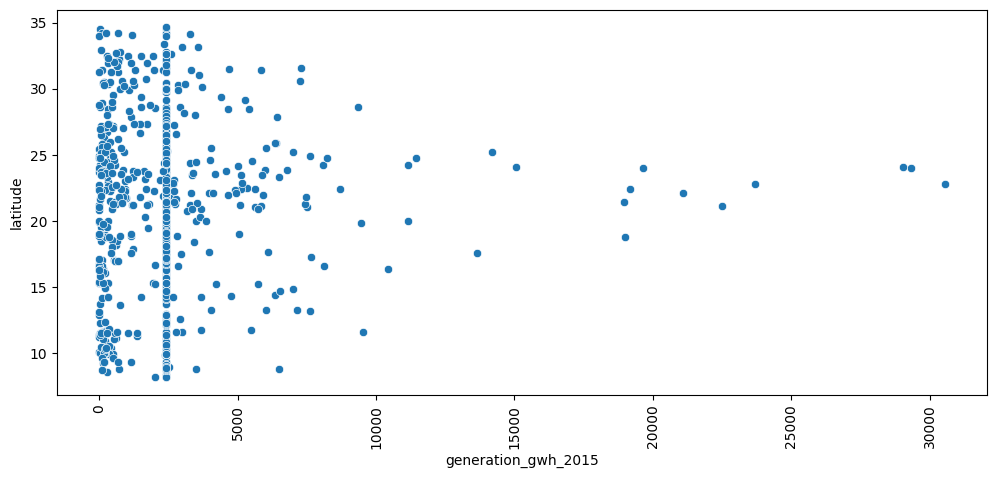

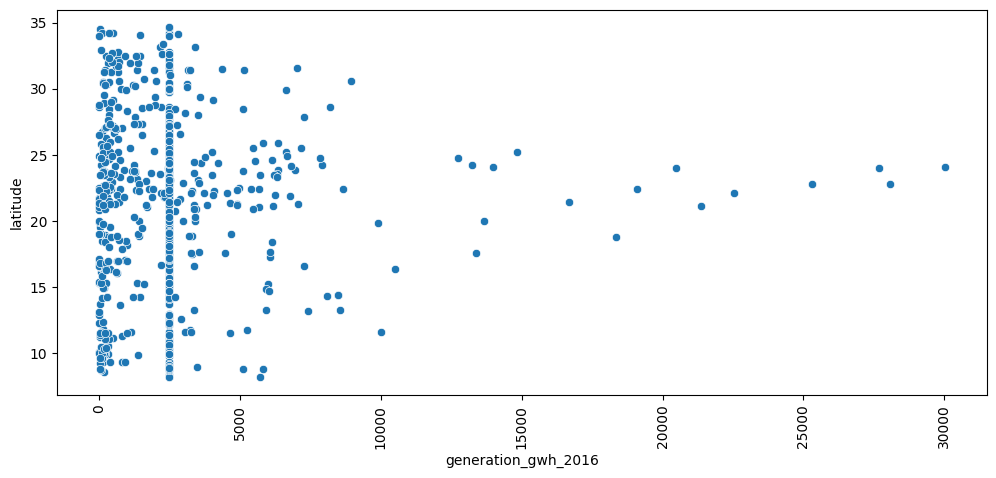

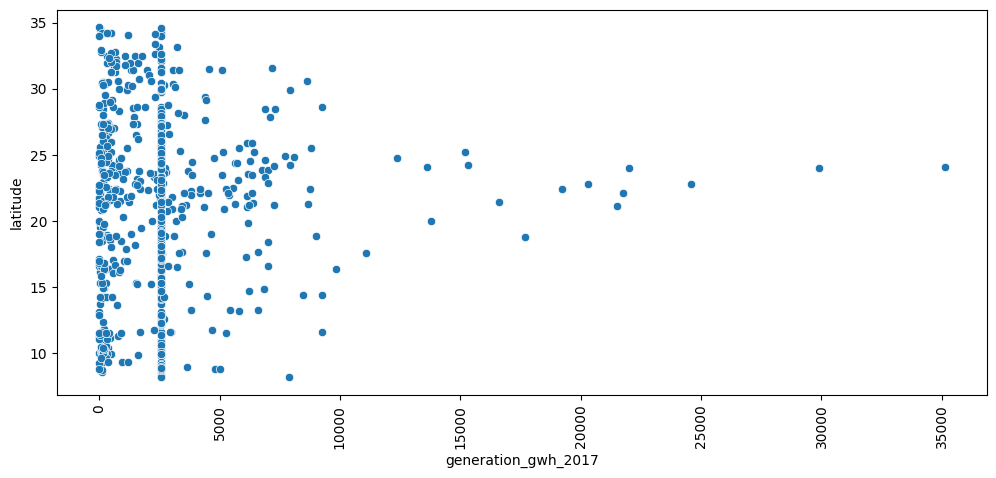

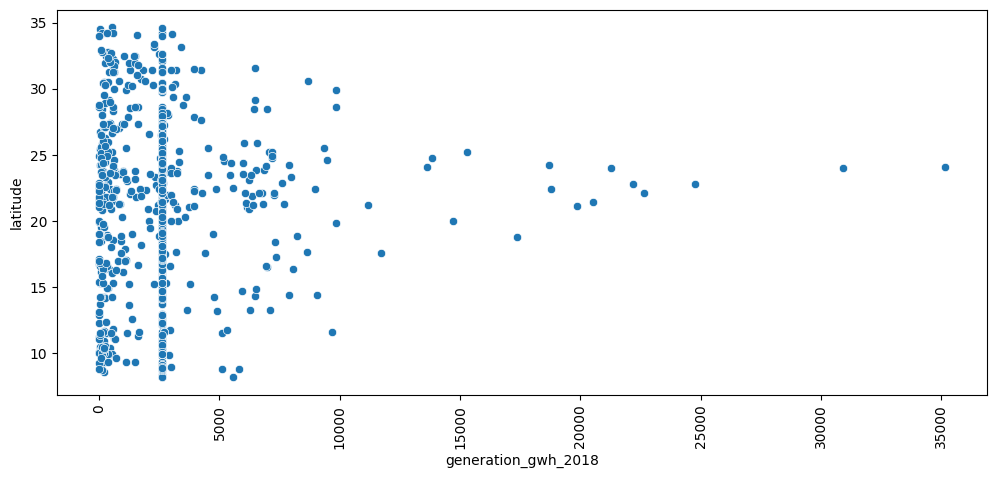

In [46]:
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.scatterplot(x=df[i],y='latitude',data=df)
    plt.xticks(rotation=90)

In [47]:
cont_columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018'],
      dtype='object')

In [48]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

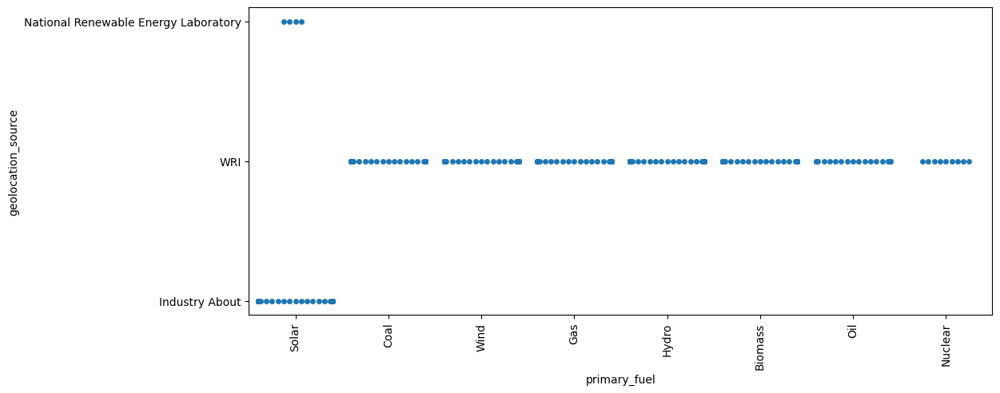

In [49]:
# Catplots

plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='geolocation_source',data=df)
plt.xticks(rotation=90)
plt.show()

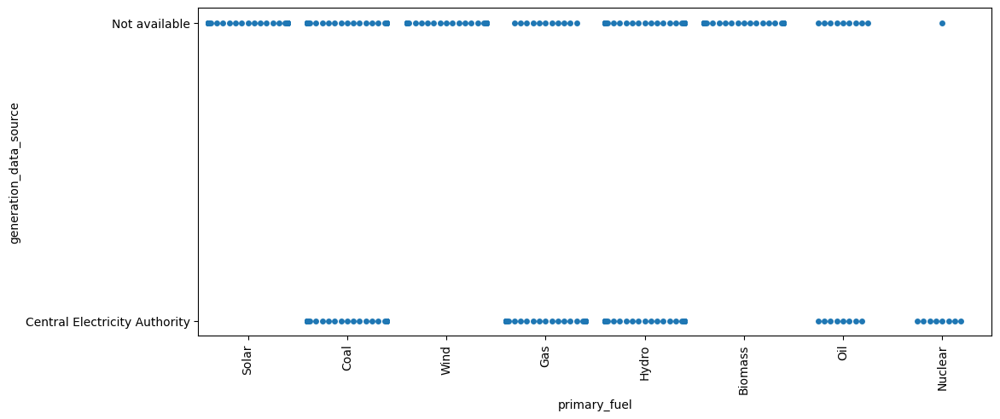

In [50]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='generation_data_source',data=df)
plt.xticks(rotation=90)
plt.show()

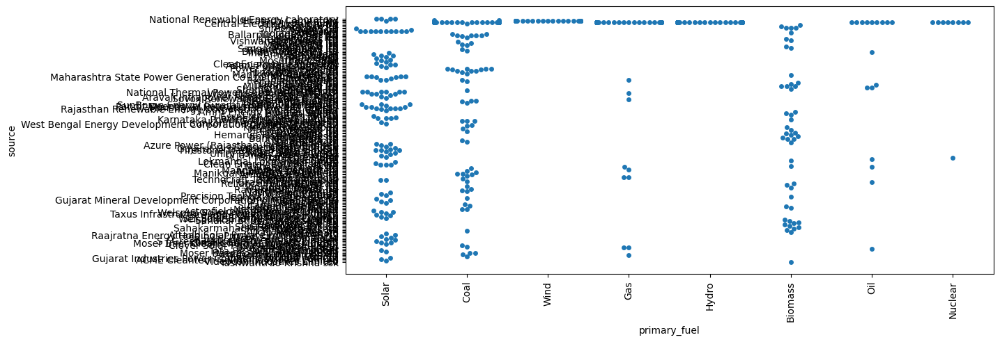

In [51]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='source',data=df)
plt.xticks(rotation=90)
plt.show()

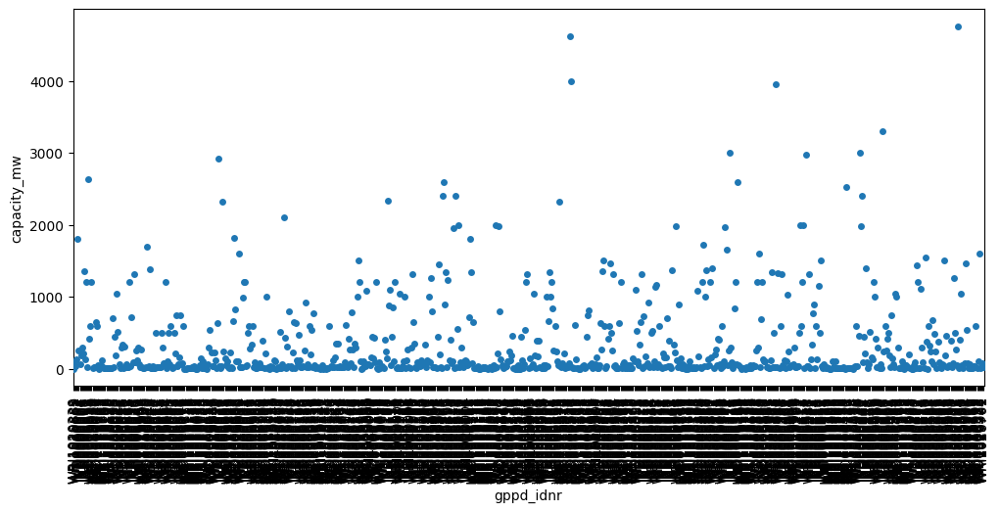

In [52]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='gppd_idnr',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

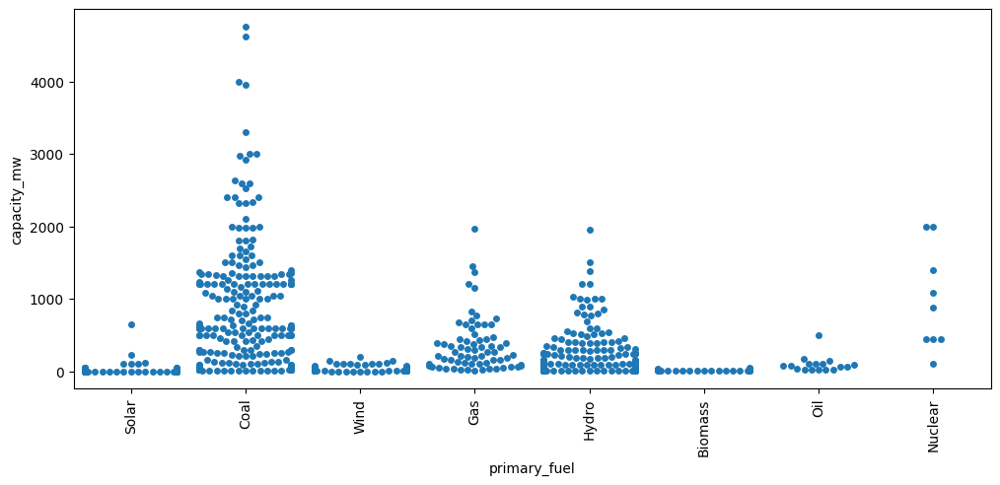

In [53]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='primary_fuel',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

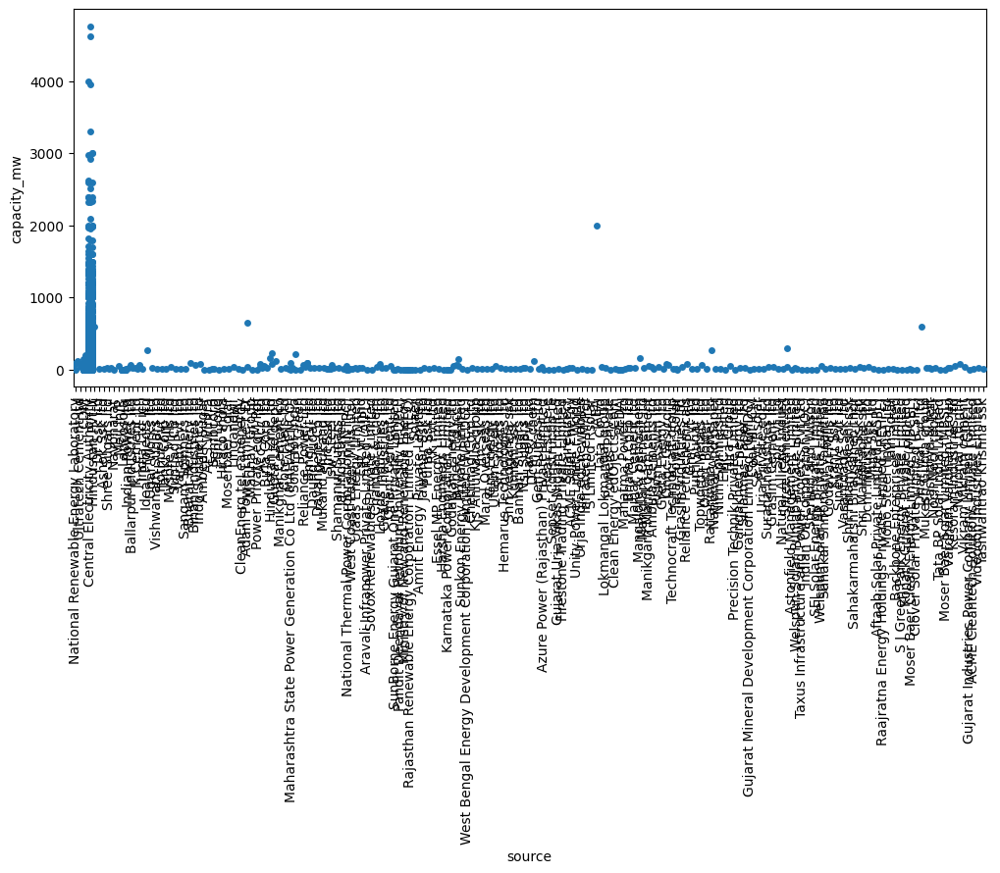

In [54]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='source',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

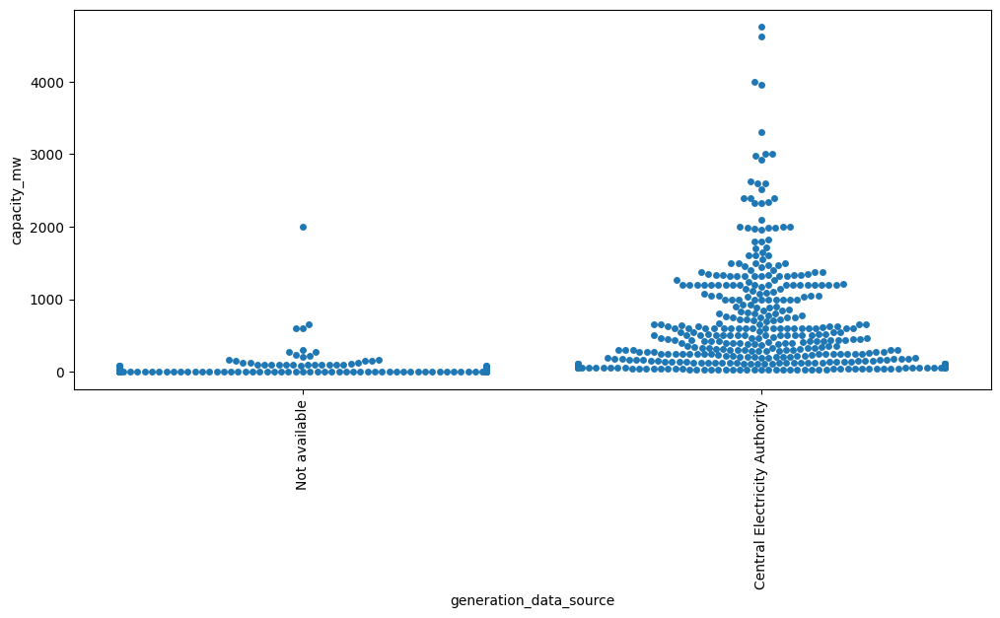

In [55]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='generation_data_source',y='capacity_mw',data=df)
plt.xticks(rotation=90)
plt.show()

In [56]:
# Relation plots

<Figure size 1200x500 with 0 Axes>

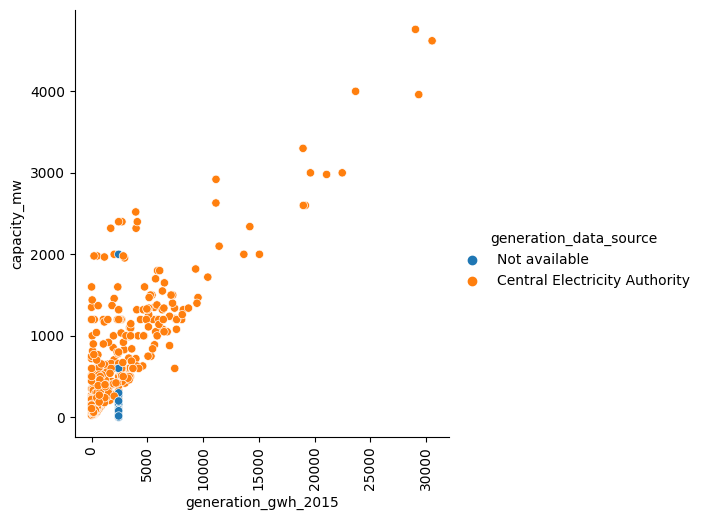

In [57]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2015', y='capacity_mw', data=df, hue='generation_data_source')
plt.xlabel('generation_gwh_2015')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

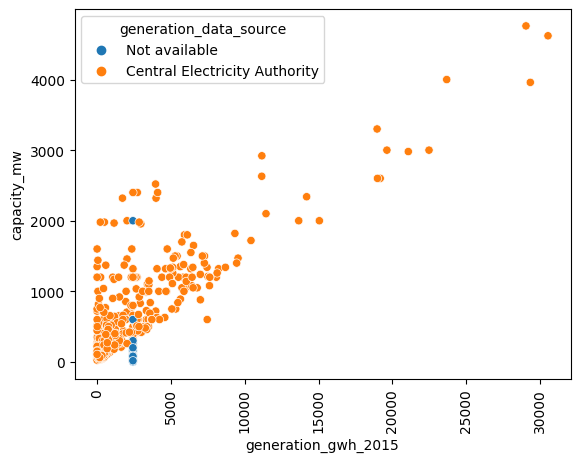

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x= 'generation_gwh_2015', y='capacity_mw', data=df, hue='generation_data_source')
plt.xlabel('generation_gwh_2015')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

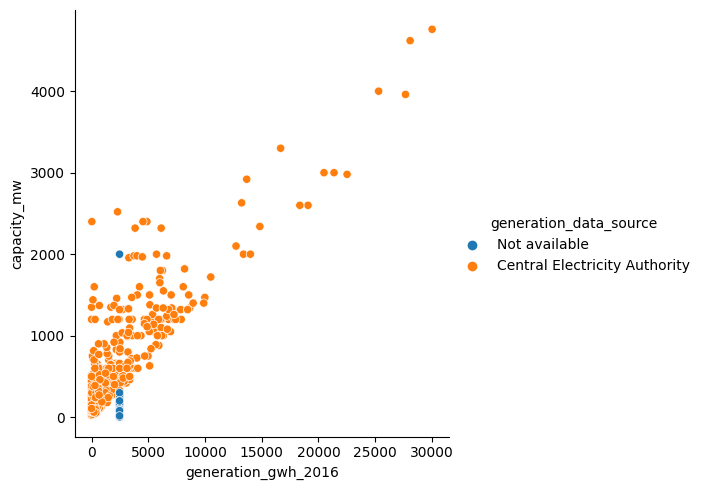

In [59]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2016',y='capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2016')
plt.ylabel('capacity_mw')
plt.show()

<Figure size 1200x500 with 0 Axes>

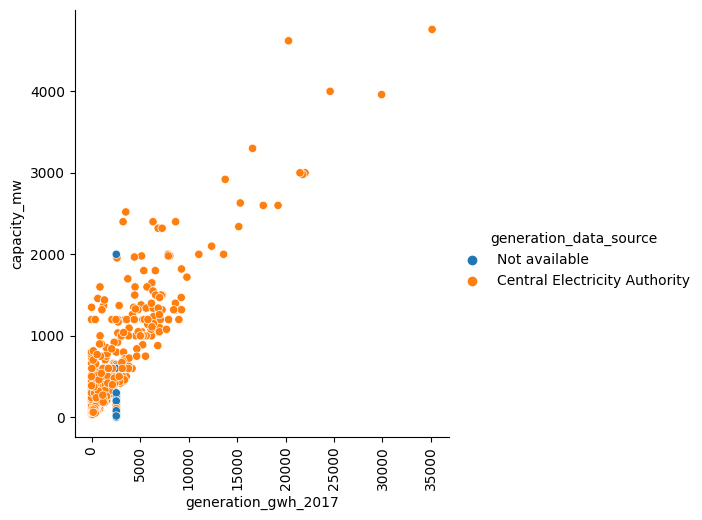

In [60]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2017',y='capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2017')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

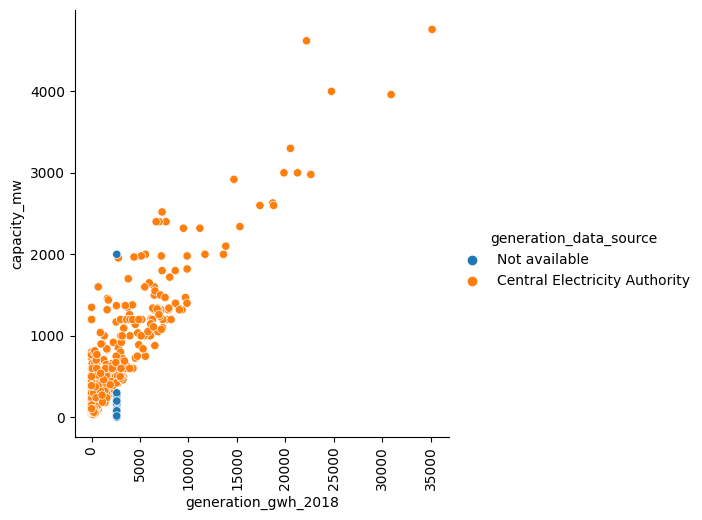

In [61]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2018',y='capacity_mw',data=df,hue='generation_data_source')
plt.xlabel('generation_gwh_2018')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

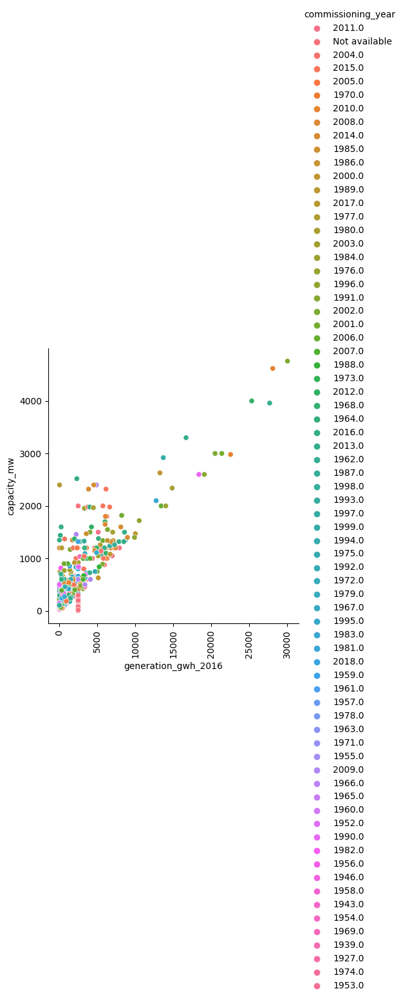

In [62]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2016',y='capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2016')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

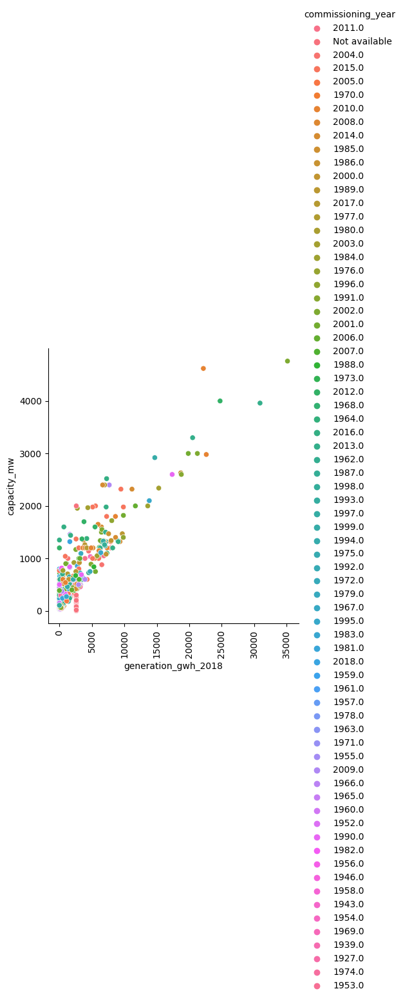

In [63]:
plt.figure(figsize=(12,5))
sns.relplot(x= 'generation_gwh_2018',y='capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2018')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

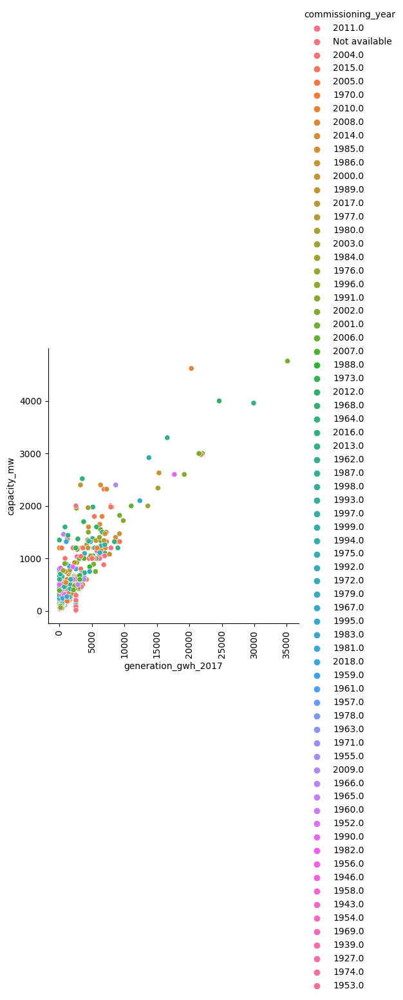

In [64]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2017',y='capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2017')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

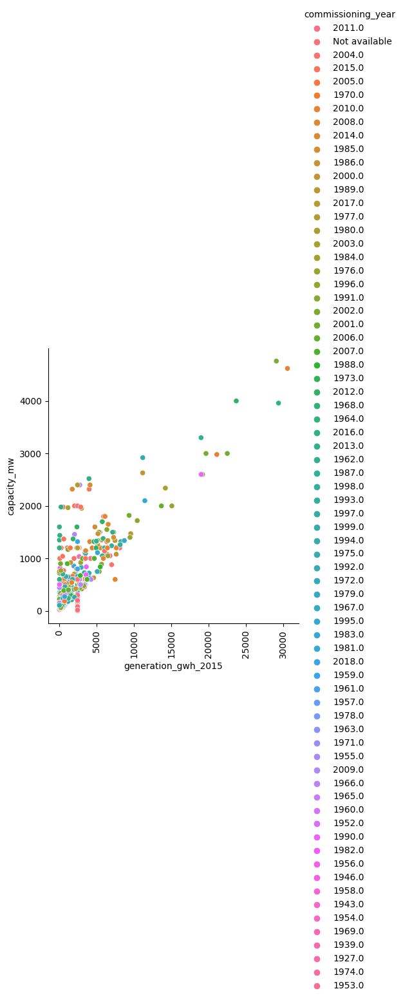

In [65]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2015',y='capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2015')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

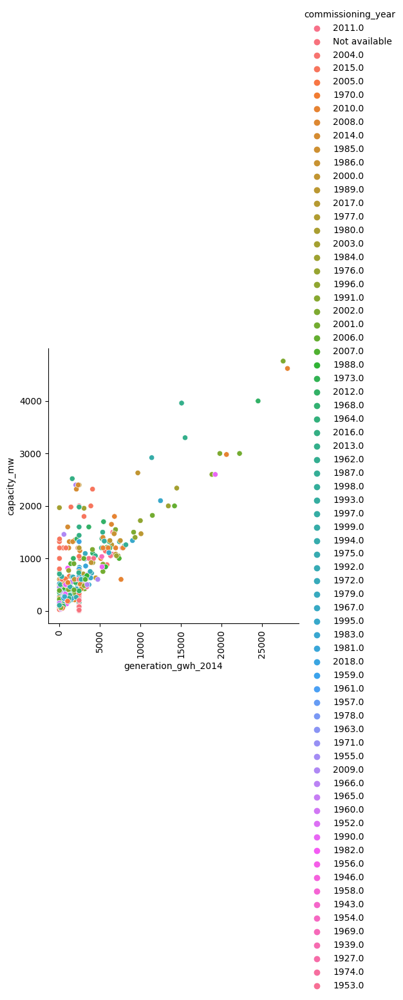

In [66]:
plt.figure(figsize=(12,5))
sns.relplot(x='generation_gwh_2014',y='capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('generation_gwh_2014')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

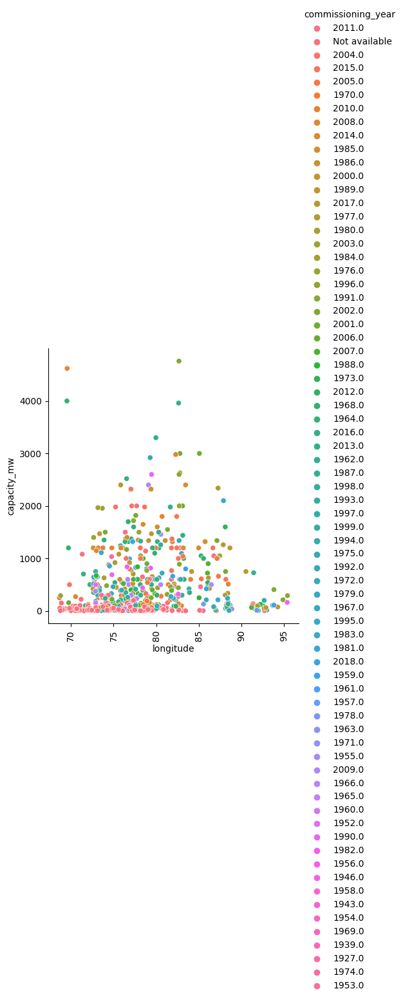

In [67]:
plt.figure(figsize=(12,5))
sns.relplot(x='longitude',y='capacity_mw',data=df,hue='commissioning_year')
plt.xlabel('longitude')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

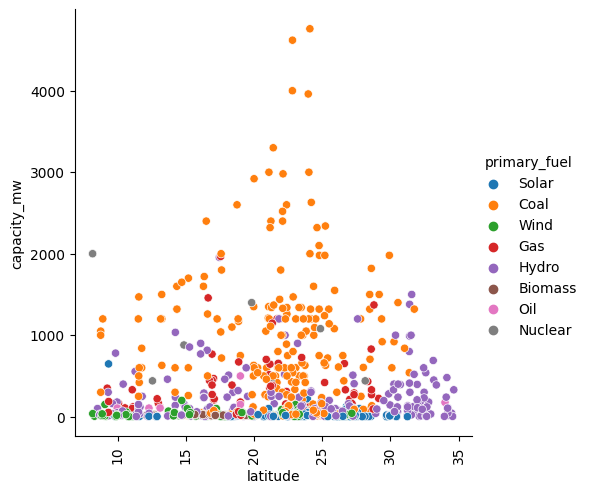

In [68]:
plt.figure(figsize=(12,5))
sns.relplot(x='latitude',y='capacity_mw',data=df,hue='primary_fuel')
plt.xlabel('latitude')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

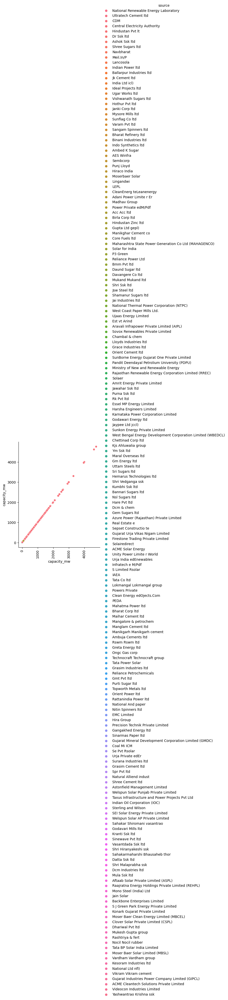

<Figure size 1200x500 with 0 Axes>

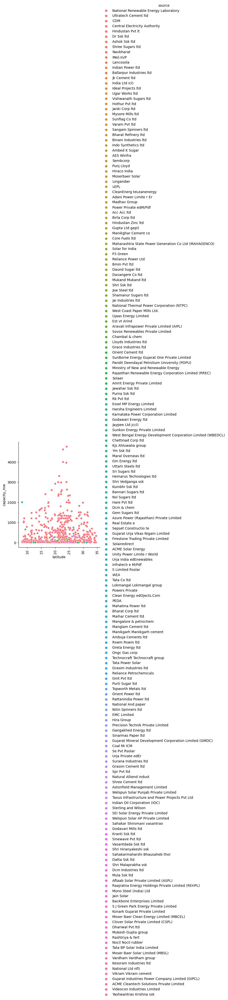

<Figure size 1200x500 with 0 Axes>

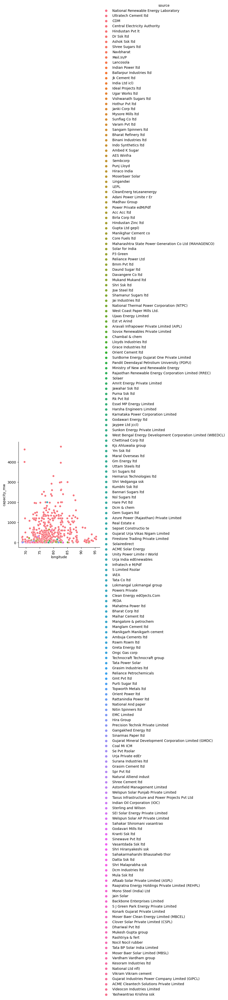

<Figure size 1200x500 with 0 Axes>

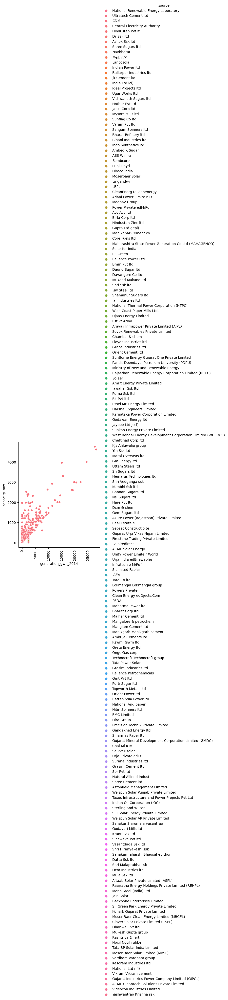

<Figure size 1200x500 with 0 Axes>

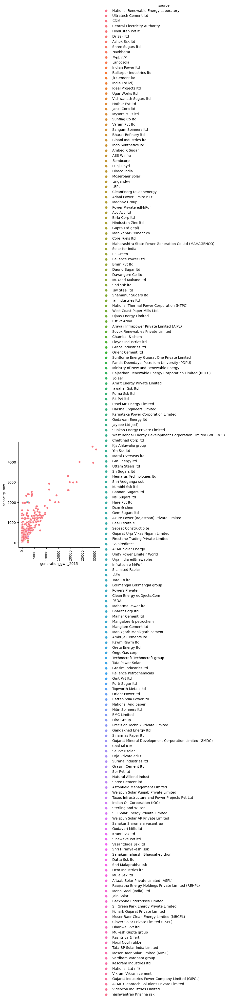

<Figure size 1200x500 with 0 Axes>

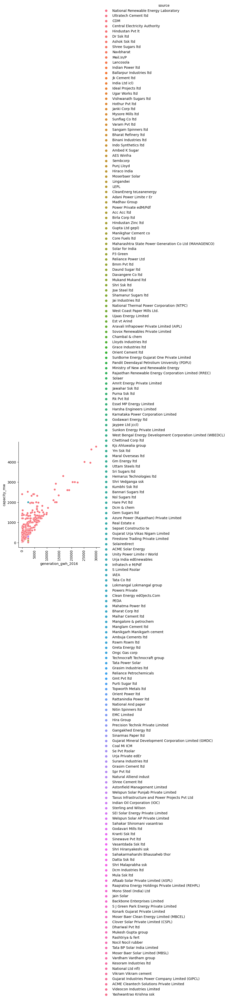

<Figure size 1200x500 with 0 Axes>

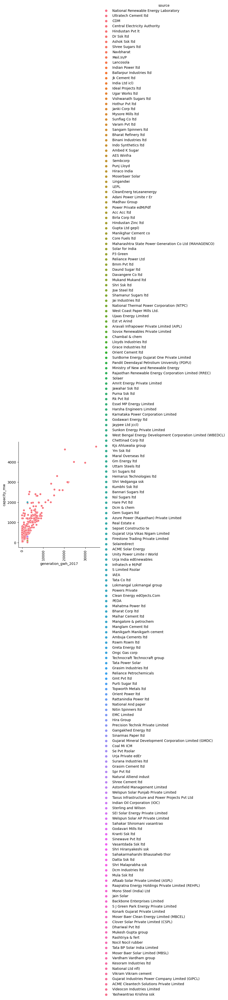

<Figure size 1200x500 with 0 Axes>

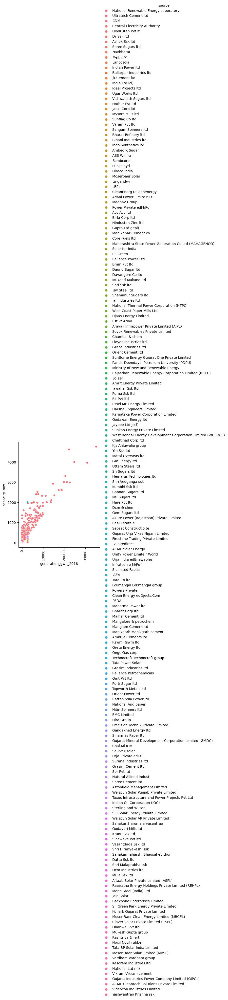

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

cont_columns = df.select_dtypes(include='number').columns.tolist()

for i in cont_columns:
    plt.figure(figsize=(12, 5))
    sns.relplot(x=i, y='capacity_mw', data=df, hue='source')
    plt.xlabel(i)
    plt.ylabel('capacity_mw')
    plt.xticks(rotation=90)
    plt.show()

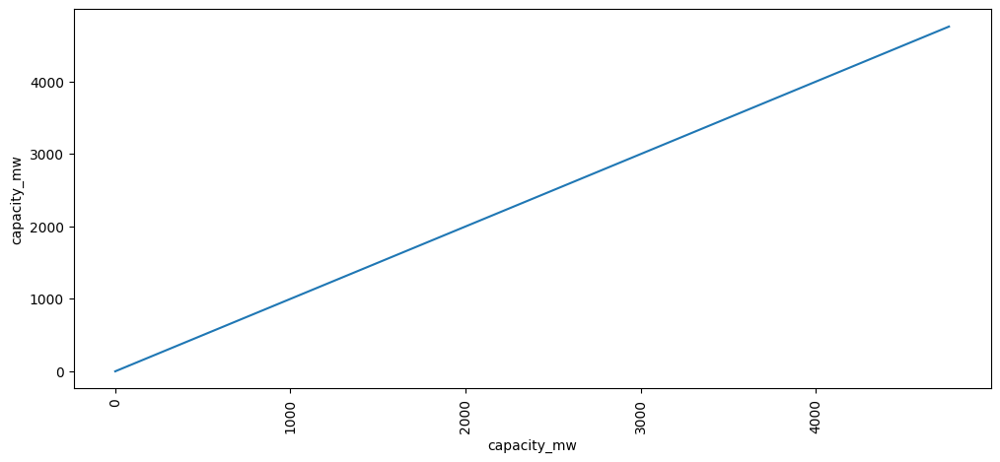

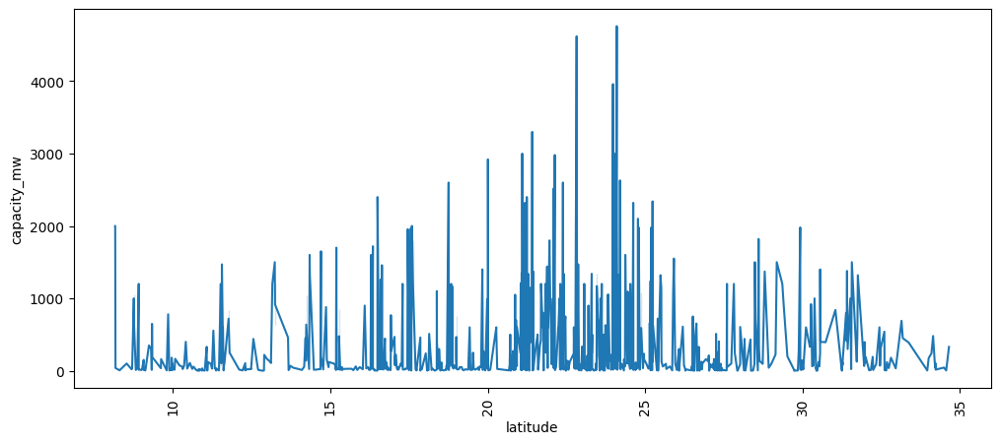

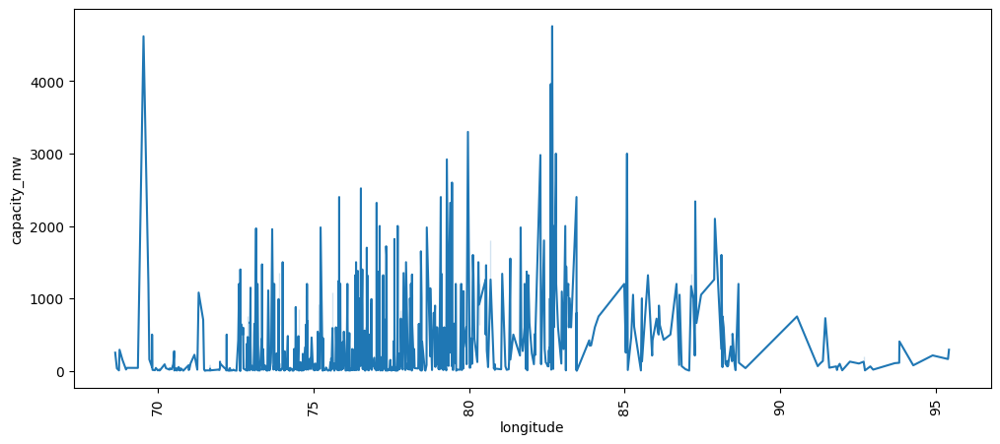

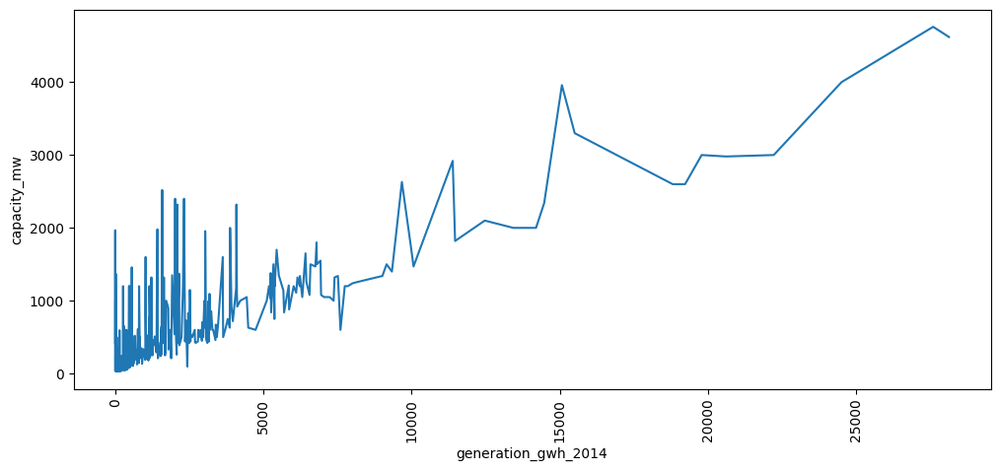

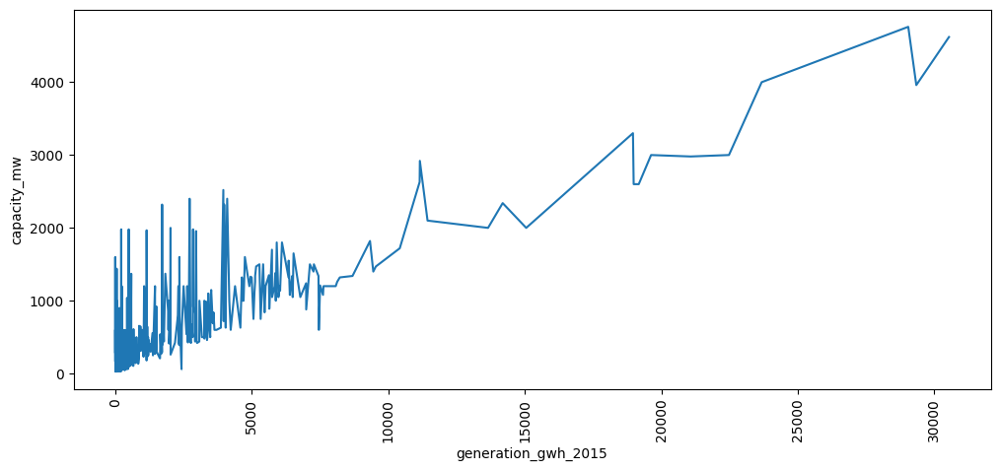

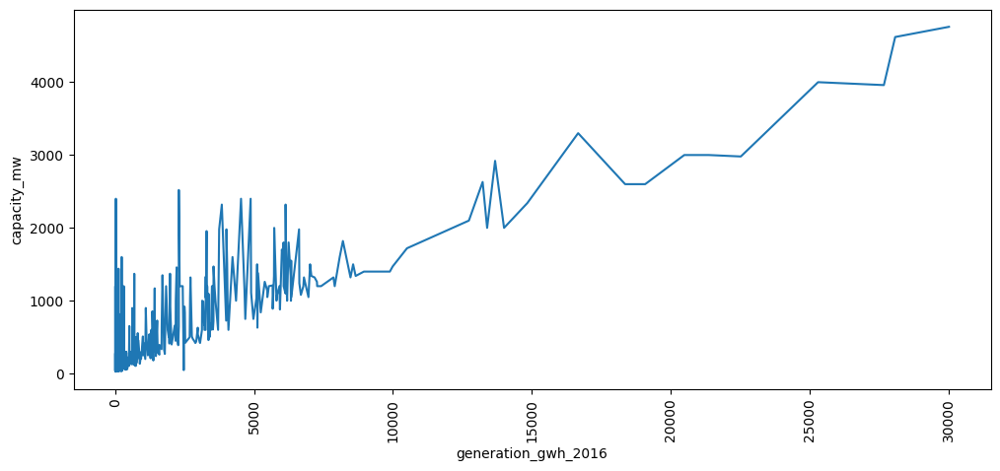

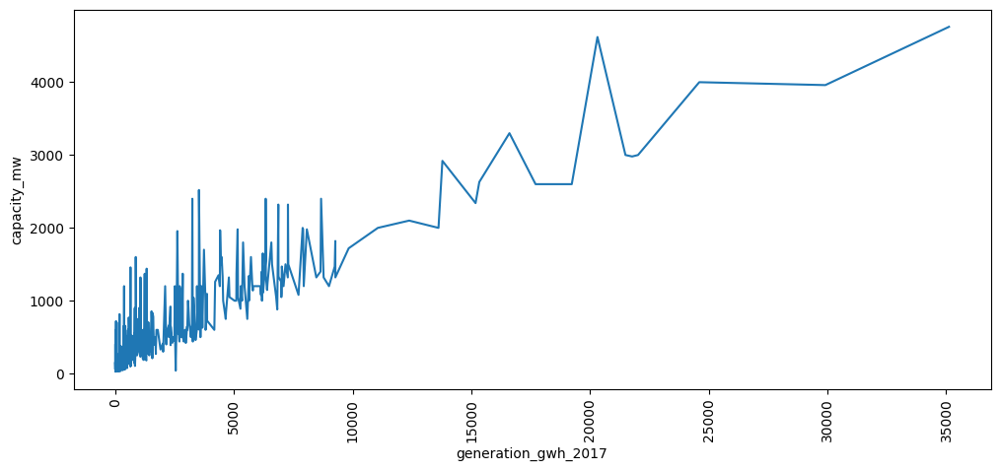

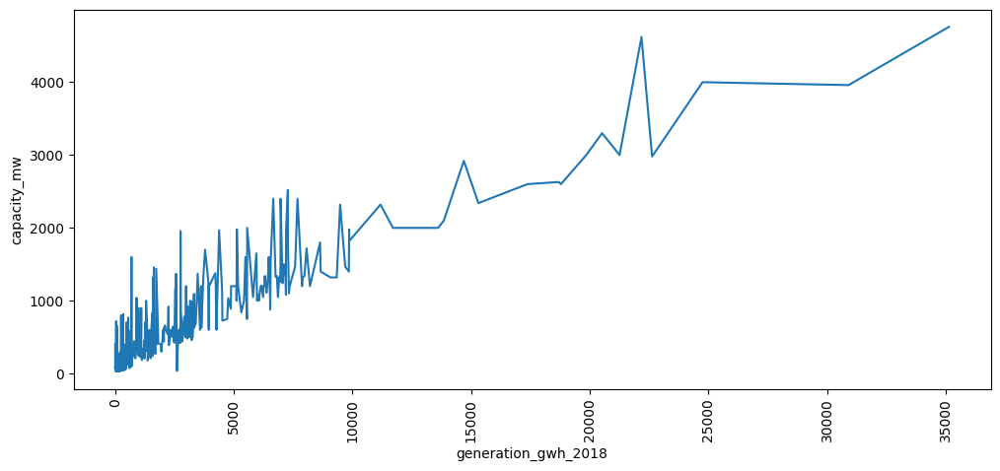

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

cont_columns = df.select_dtypes(include='number').columns.tolist()

for i in cont_columns:
    plt.figure(figsize=(12, 5))
    sns.lineplot(x=i, y='capacity_mw', data=df)
    plt.xlabel(i)
    plt.ylabel('capacity_mw')
    plt.xticks(rotation=90)
    plt.show()

In [71]:
# Univariate analysis using frequency, density and box plots

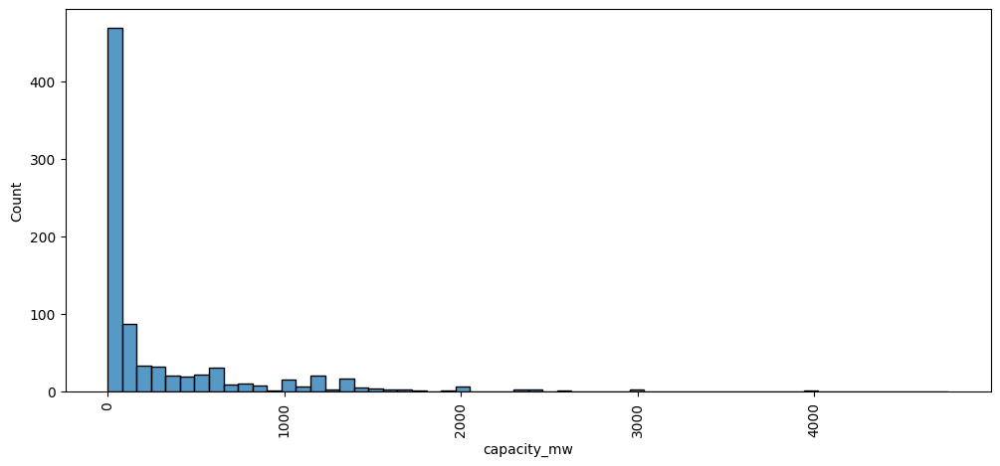

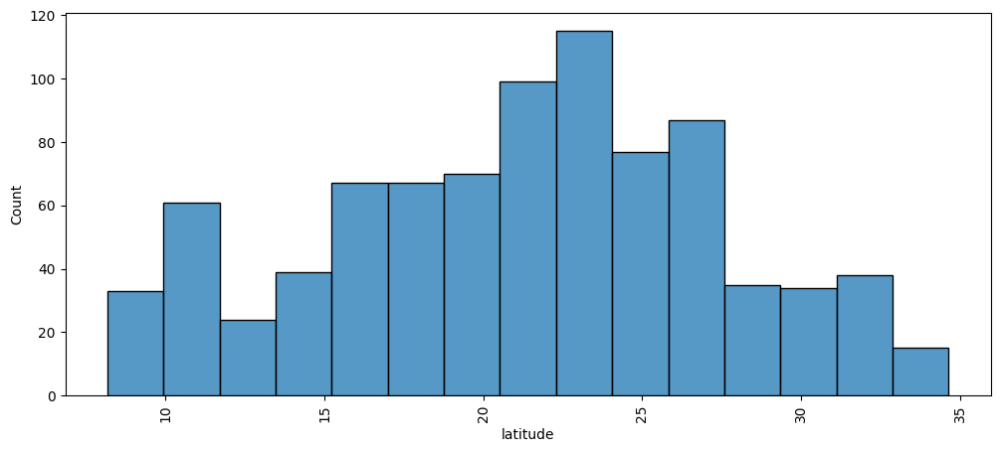

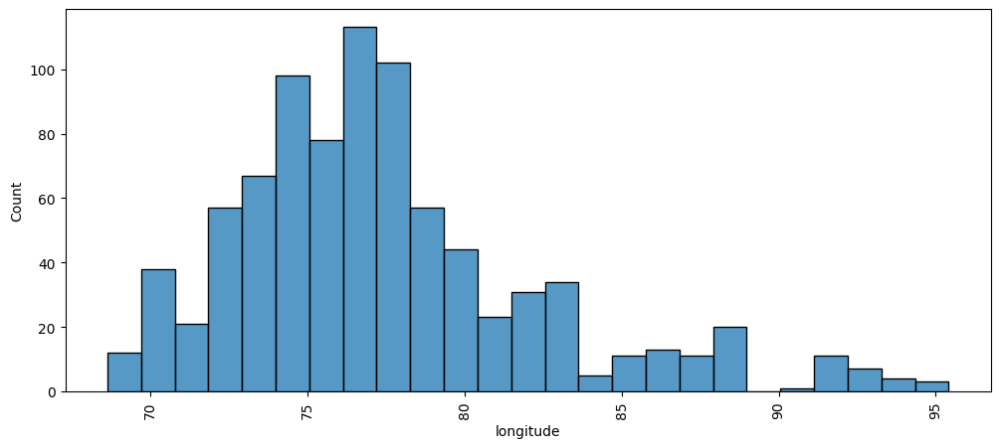

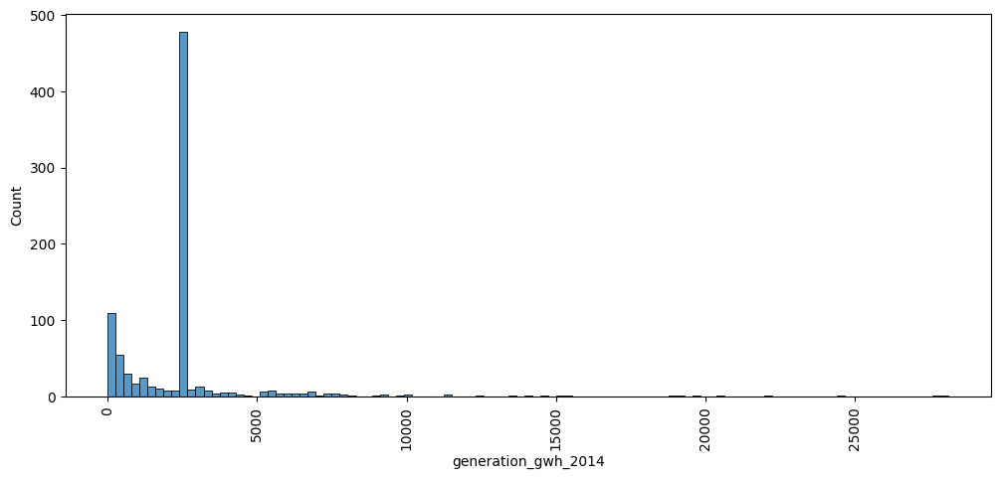

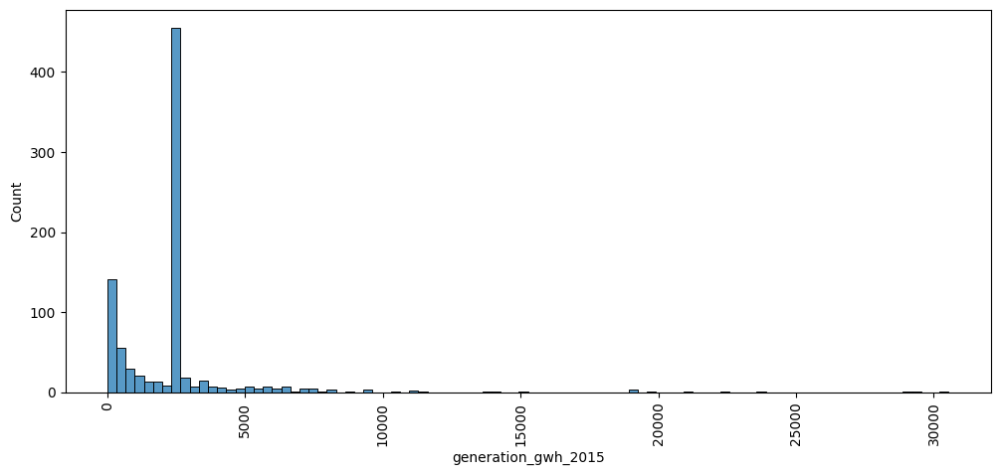

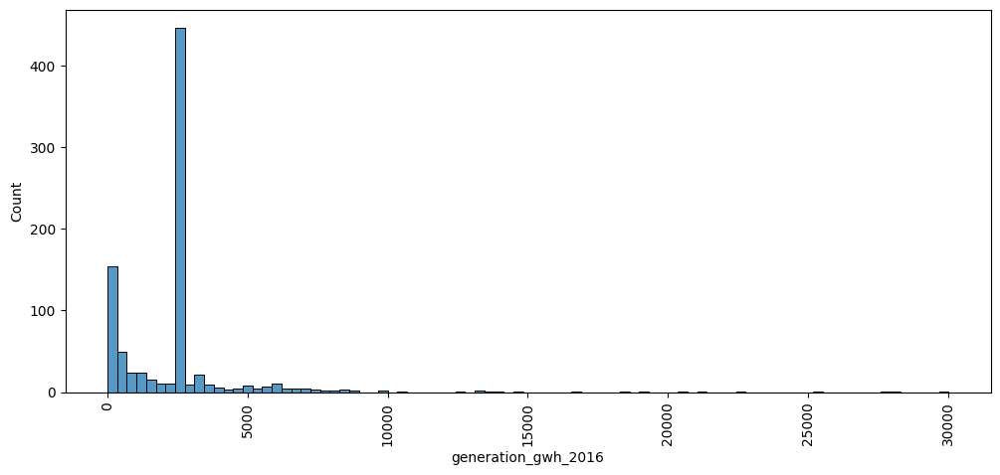

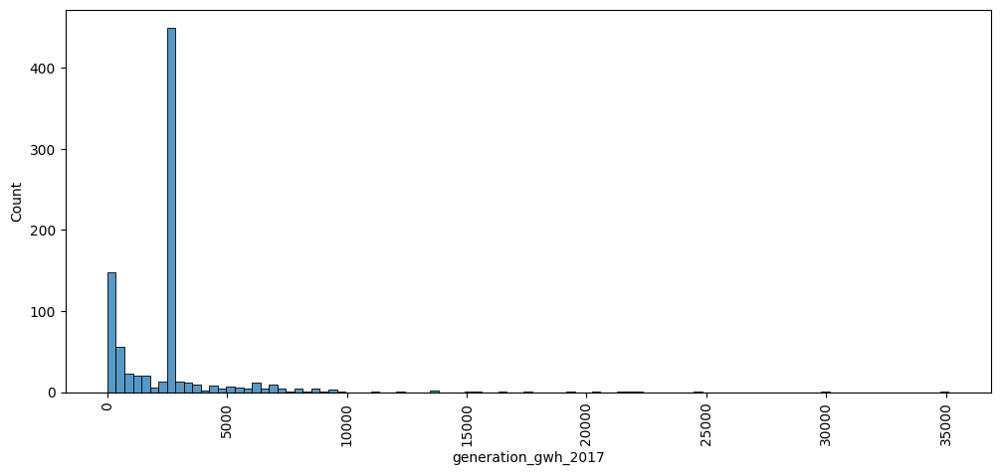

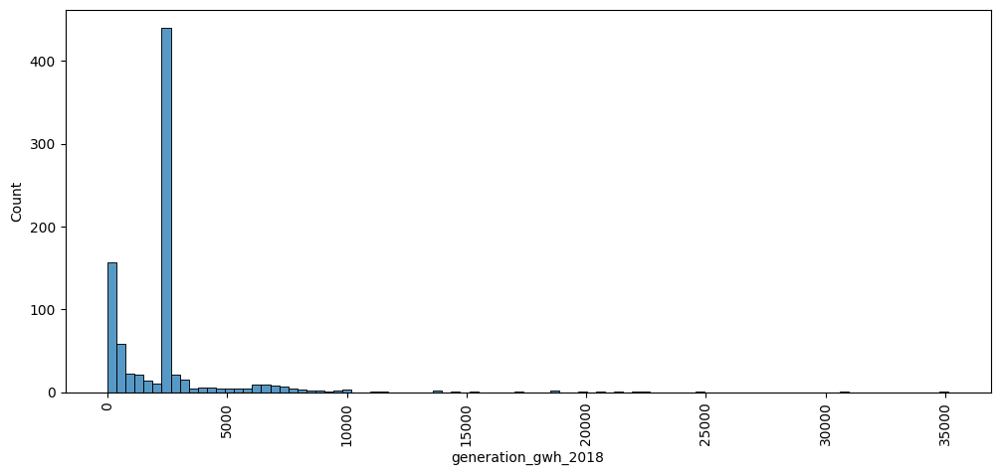

In [72]:
# Hist plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.histplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

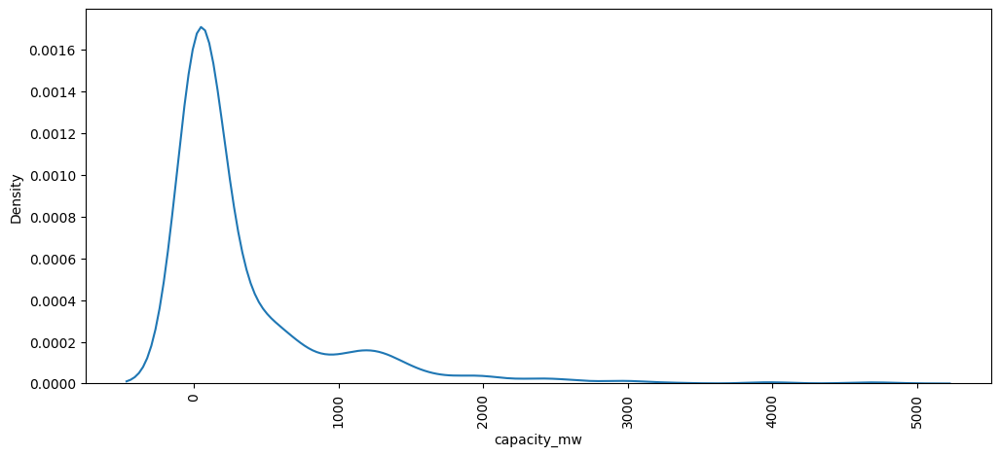

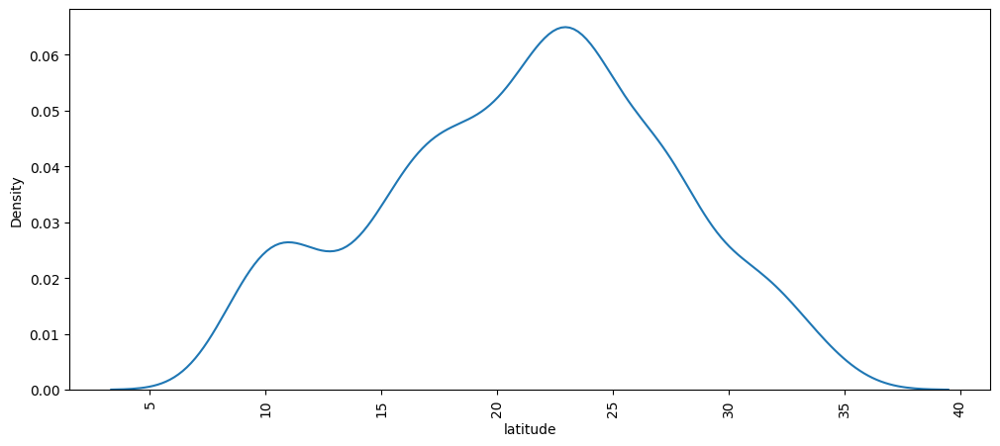

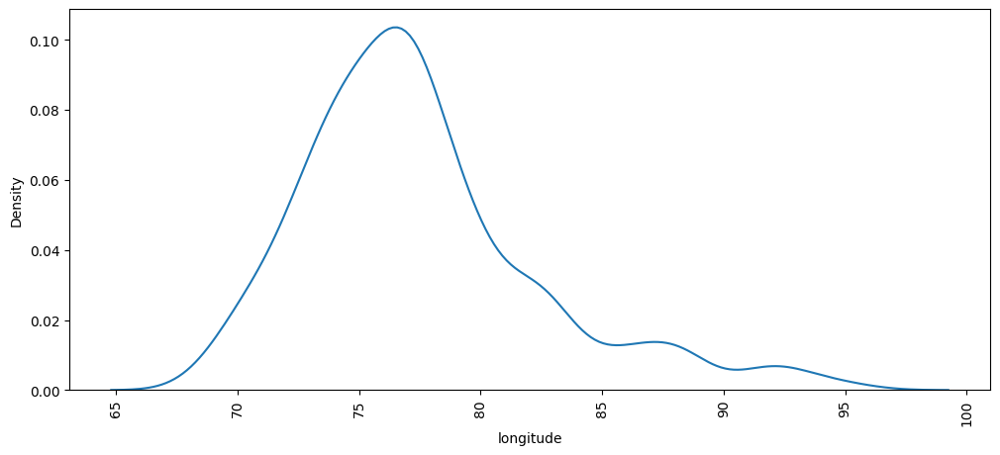

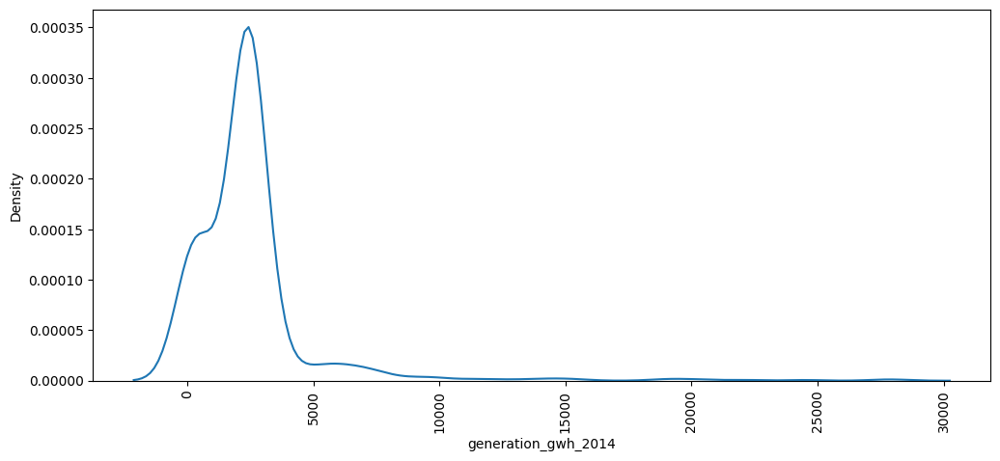

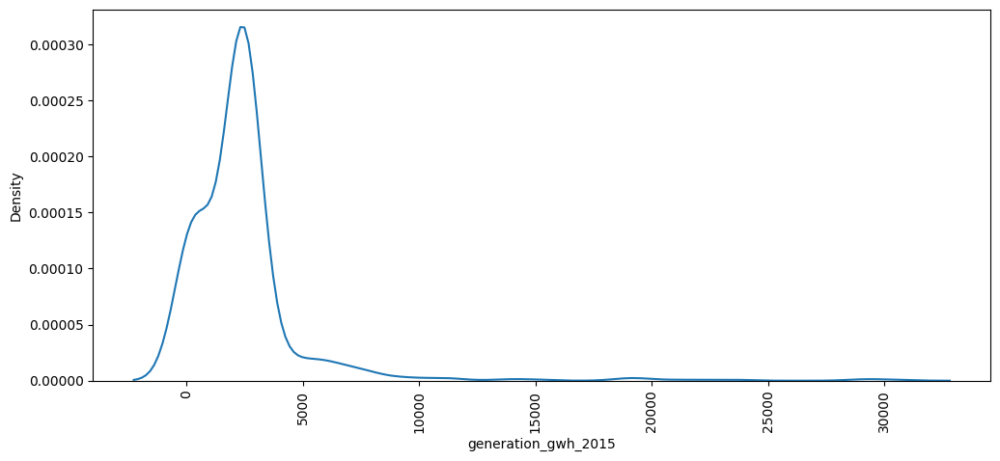

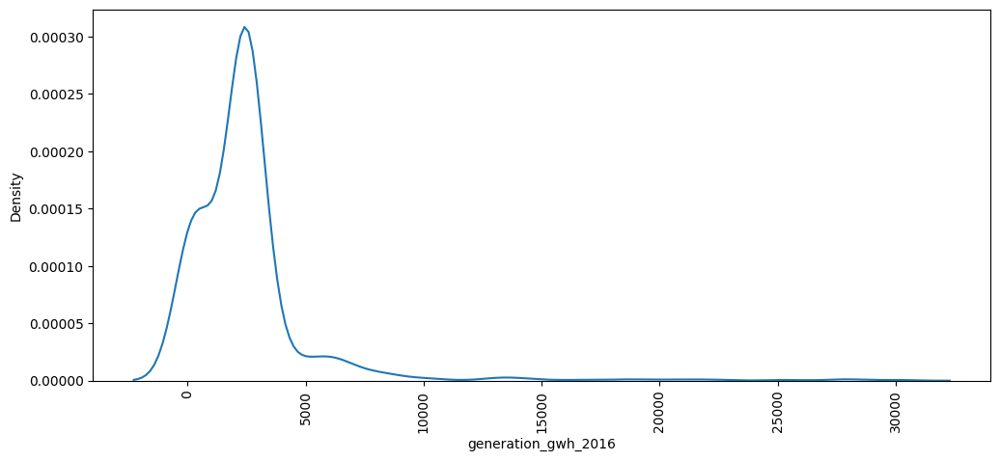

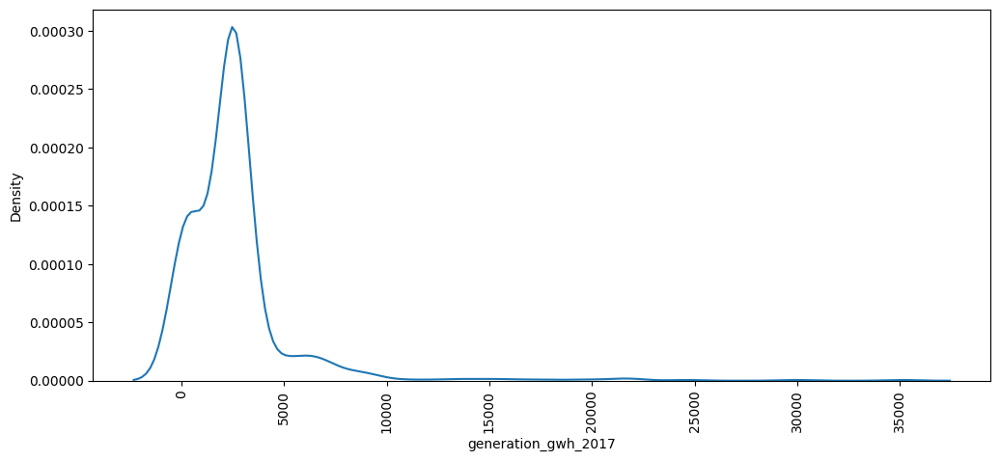

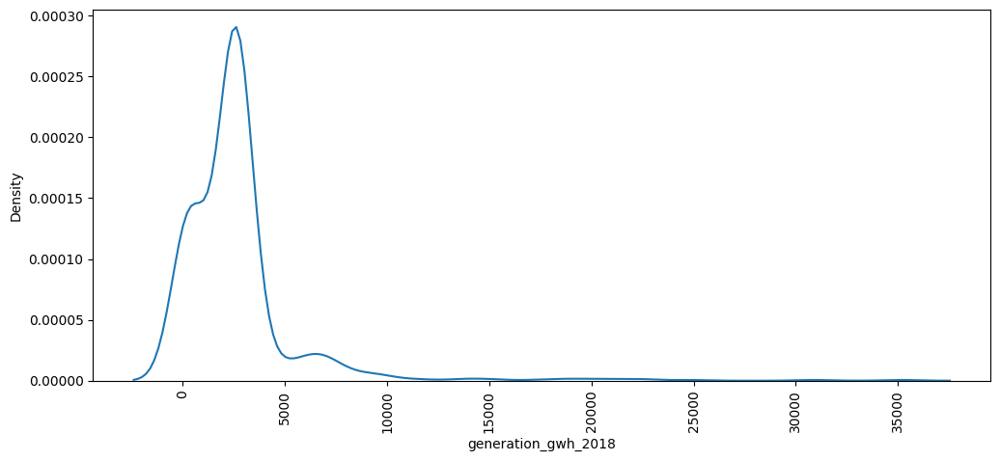

In [73]:
# Kernel density estimation plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.kdeplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

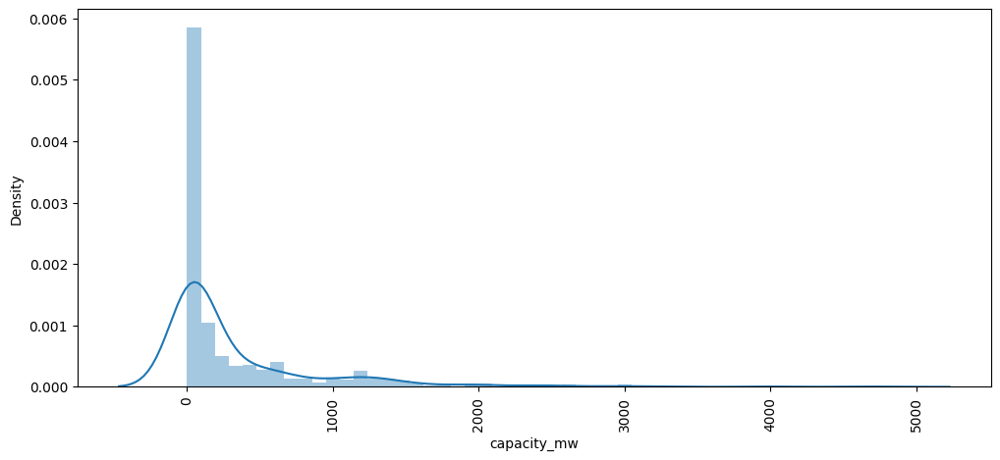

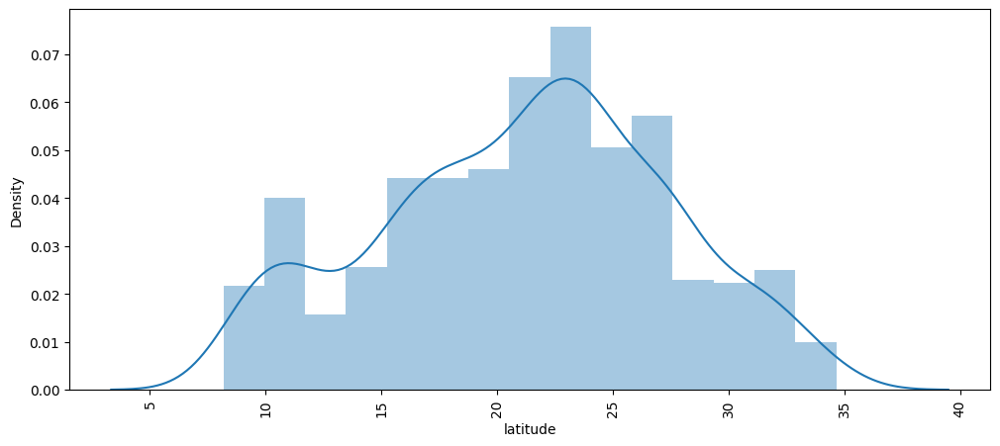

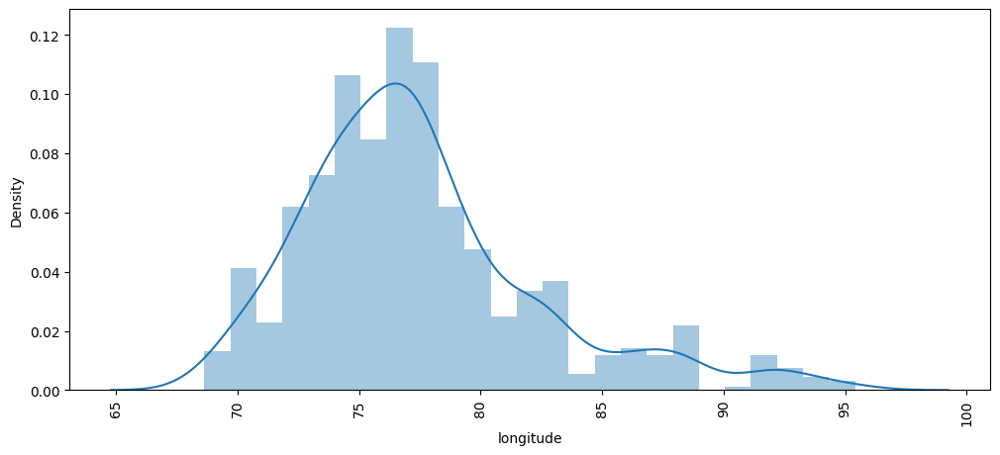

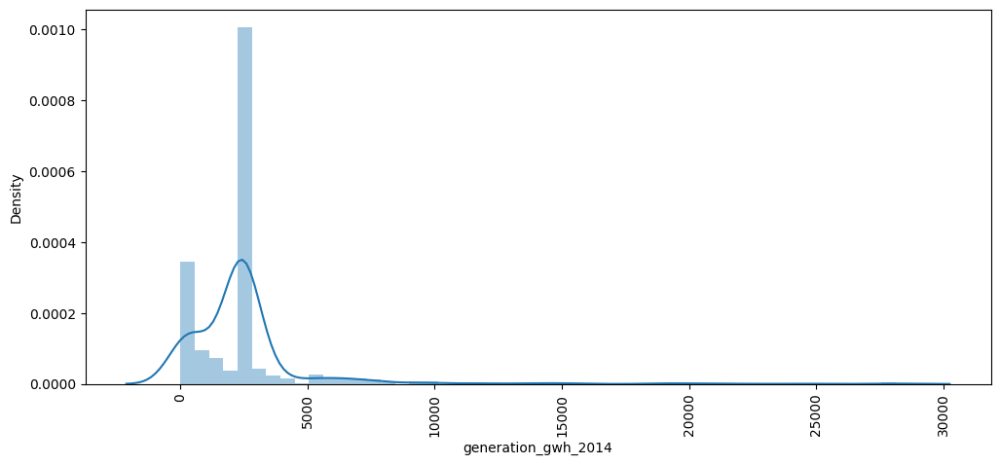

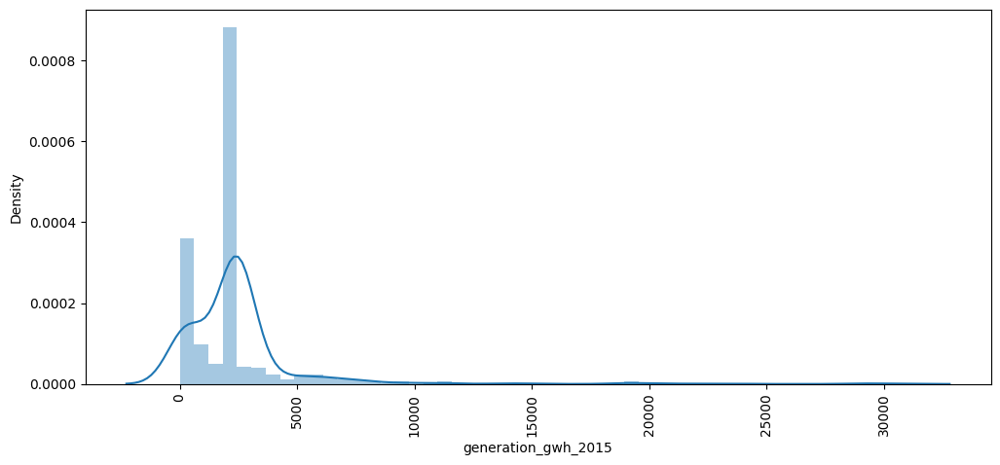

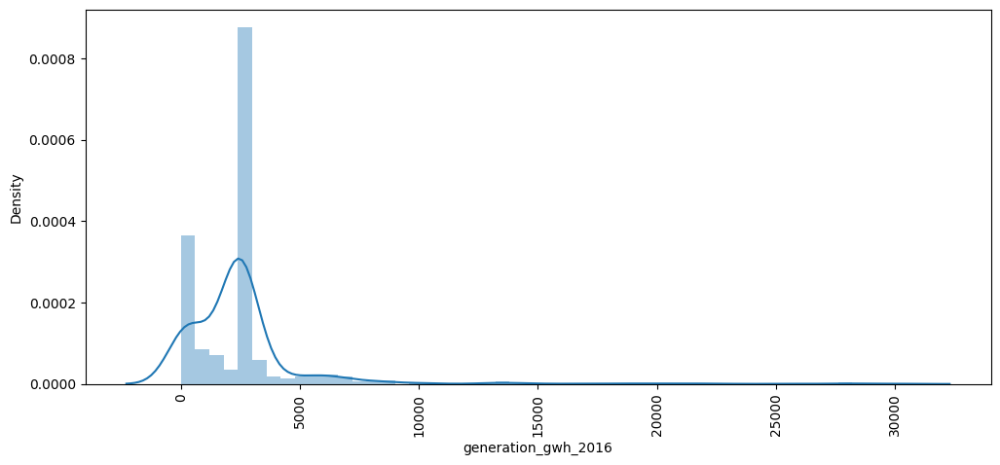

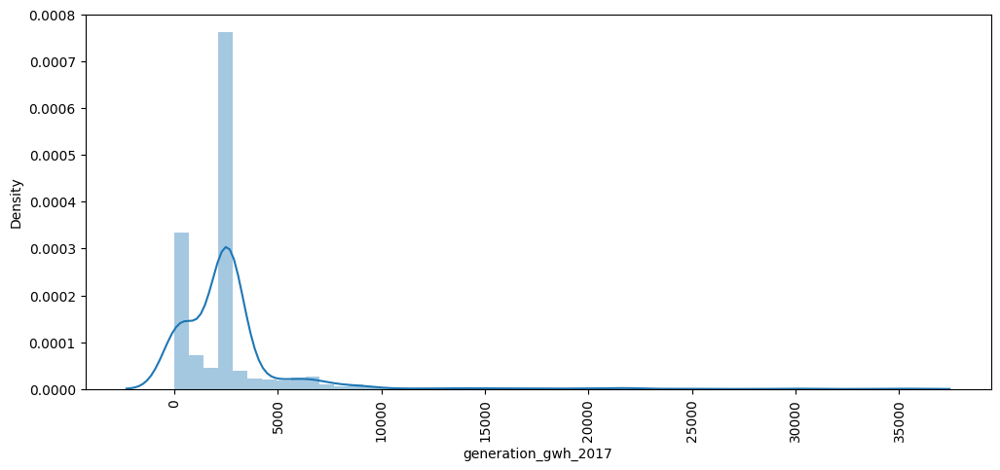

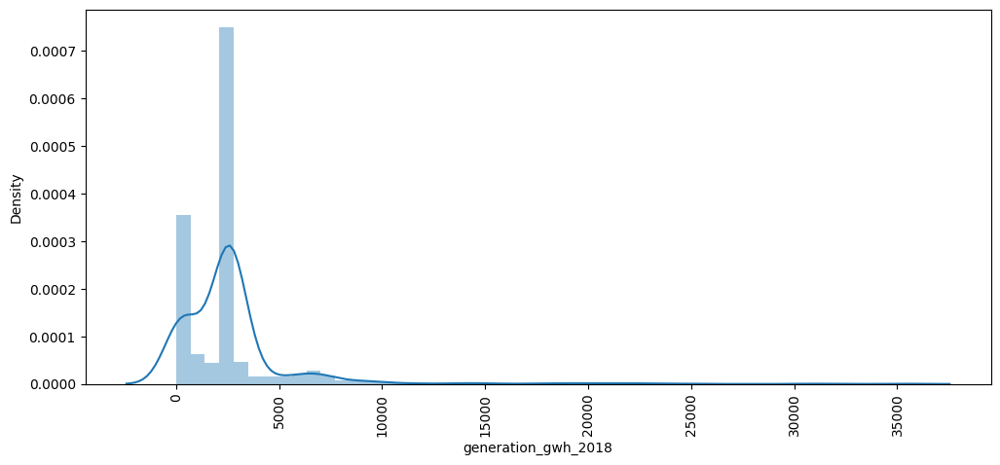

In [74]:
# Distribution plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.distplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

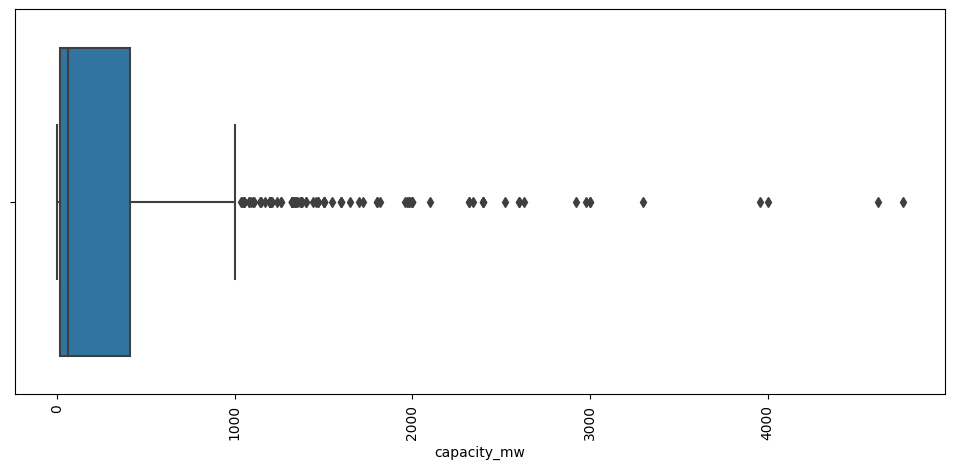

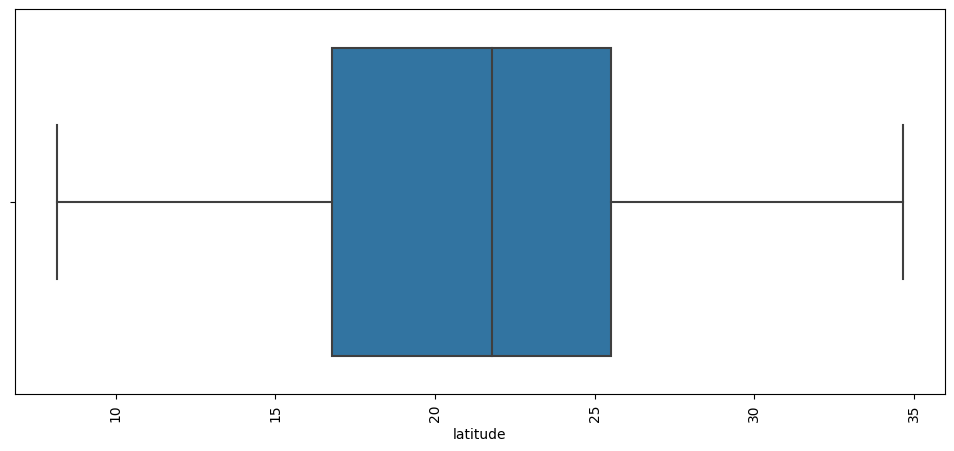

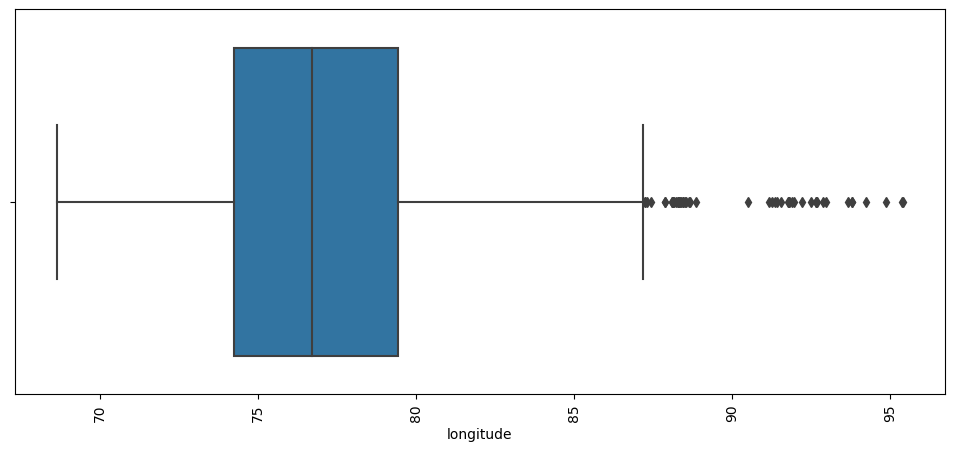

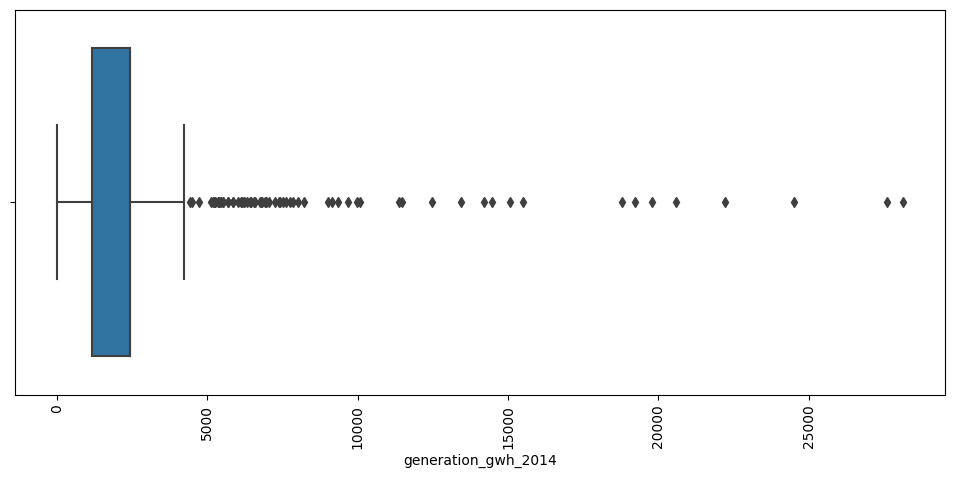

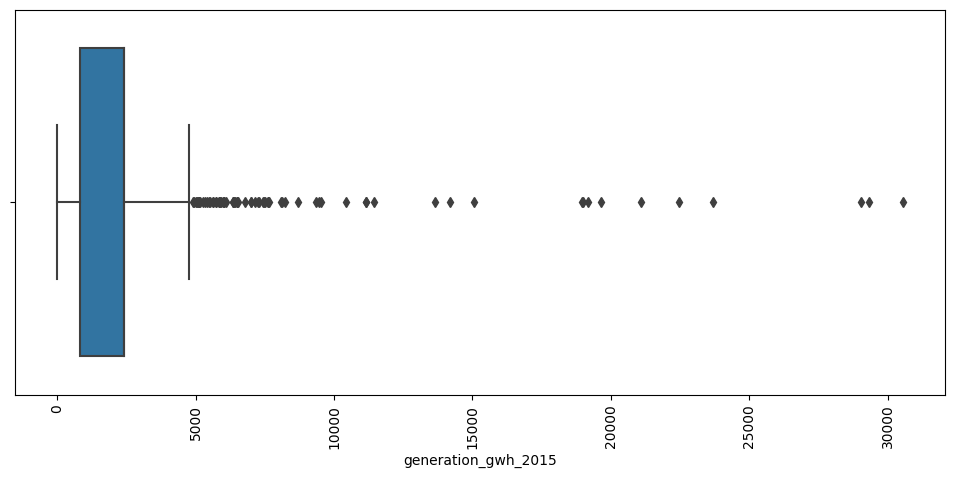

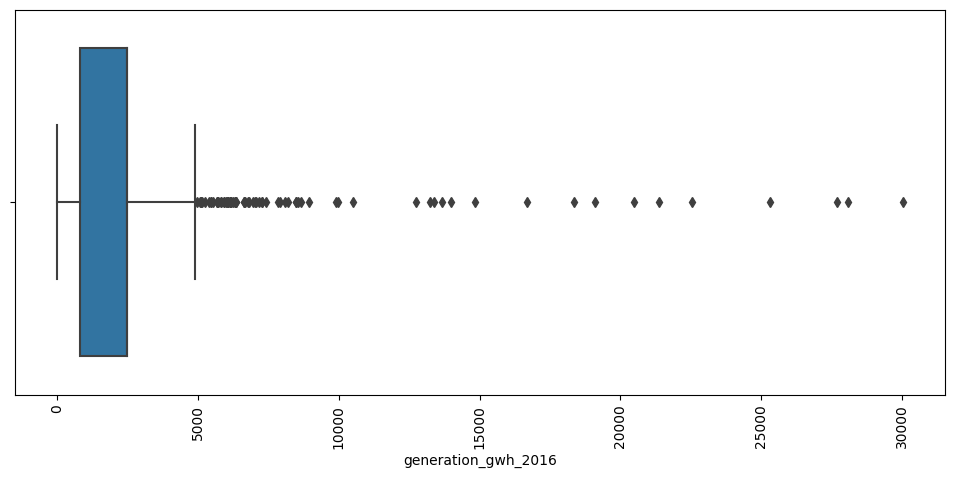

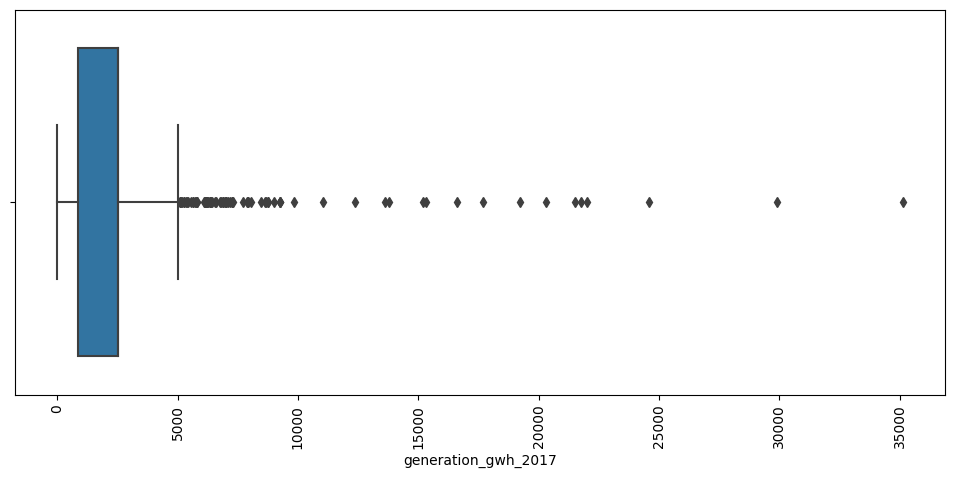

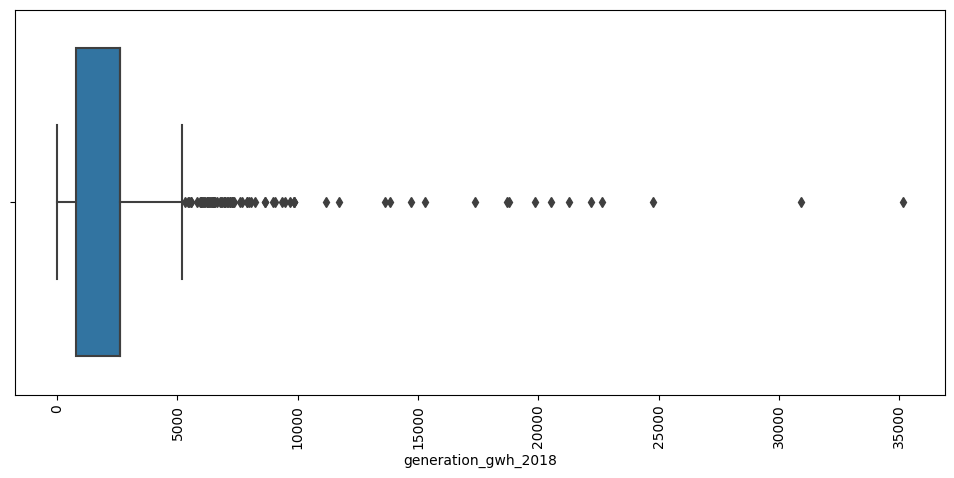

In [75]:
# Box plot

for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax = sns.boxplot(x=df[i])
    plt.xlabel(i)
    plt.xticks(rotation=90)

<Figure size 1200x500 with 0 Axes>

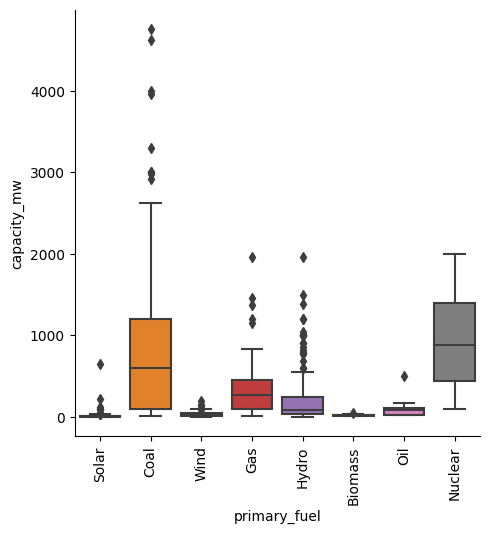

In [76]:
# Catplot of box kind:

f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='primary_fuel',y='capacity_mw',kind='box',data=df)
plt.xlabel('primary_fuel')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

In [77]:
cat_columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel',
       'commissioning_year', 'owner', 'source', 'url', 'geolocation_source',
       'year_of_capacity_data', 'generation_data_source'],
      dtype='object')

<Figure size 1200x500 with 0 Axes>

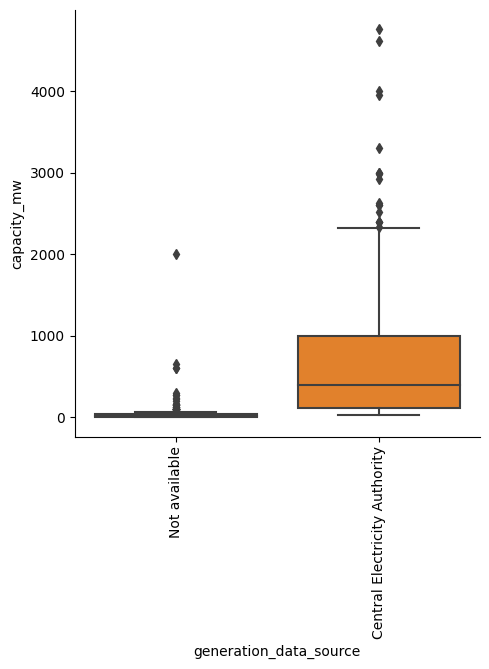

In [78]:
f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='generation_data_source',y='capacity_mw',kind='box',data=df)
plt.xlabel('generation_data_source')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

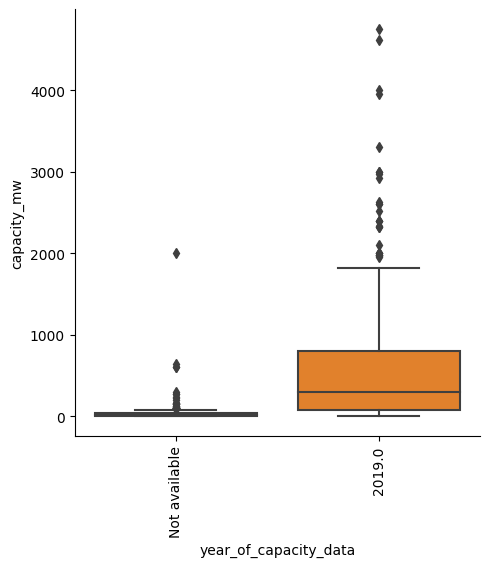

In [79]:
f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='year_of_capacity_data',y='capacity_mw',kind='box',data=df)
plt.xlabel('year_of_capacity_data')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

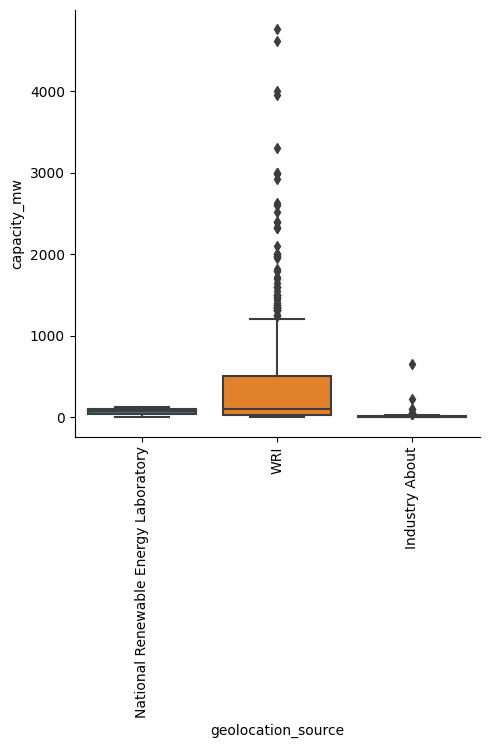

In [80]:
f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='geolocation_source',y='capacity_mw',kind='box',data=df)
plt.xlabel('geolocation_source')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

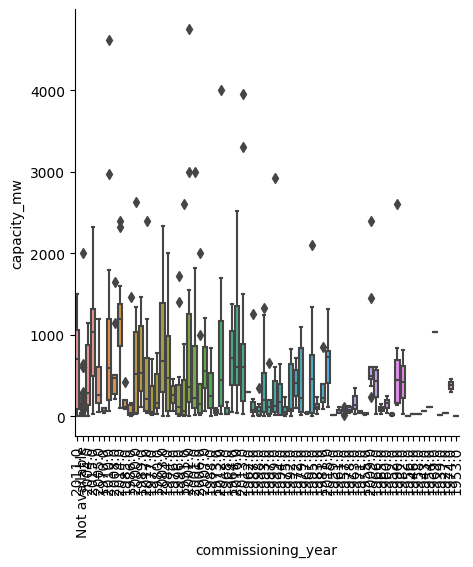

In [81]:
# Catplot of box kind:

f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='commissioning_year',y='capacity_mw',kind='box',data=df)
plt.xlabel('commissioning_year')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

<Figure size 1200x500 with 0 Axes>

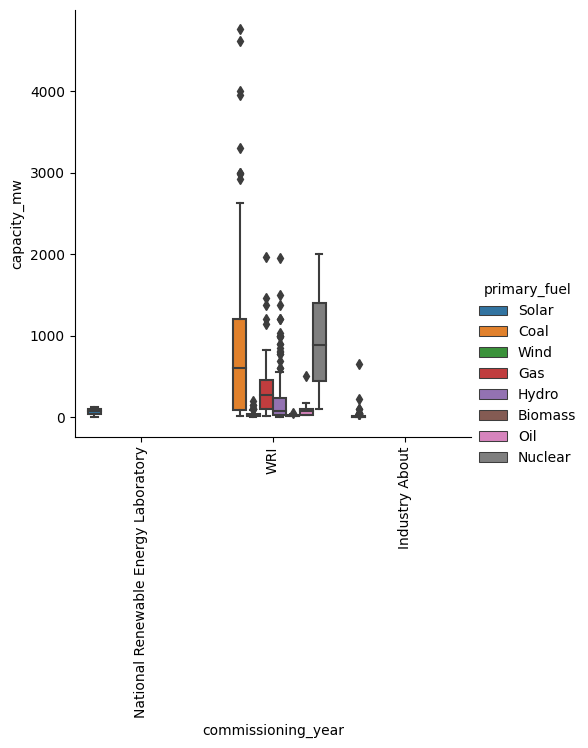

In [82]:
# Catplot of box kind:

f= plt.figure(figsize=(12,5))
ax = sns.catplot(x='geolocation_source',y='capacity_mw',kind='box',data=df,hue='primary_fuel')
plt.xlabel('commissioning_year')
plt.ylabel('capacity_mw')
plt.xticks(rotation=90)
plt.show()

In [83]:
# Checking linear relation between features and lables:

<Figure size 1200x500 with 0 Axes>

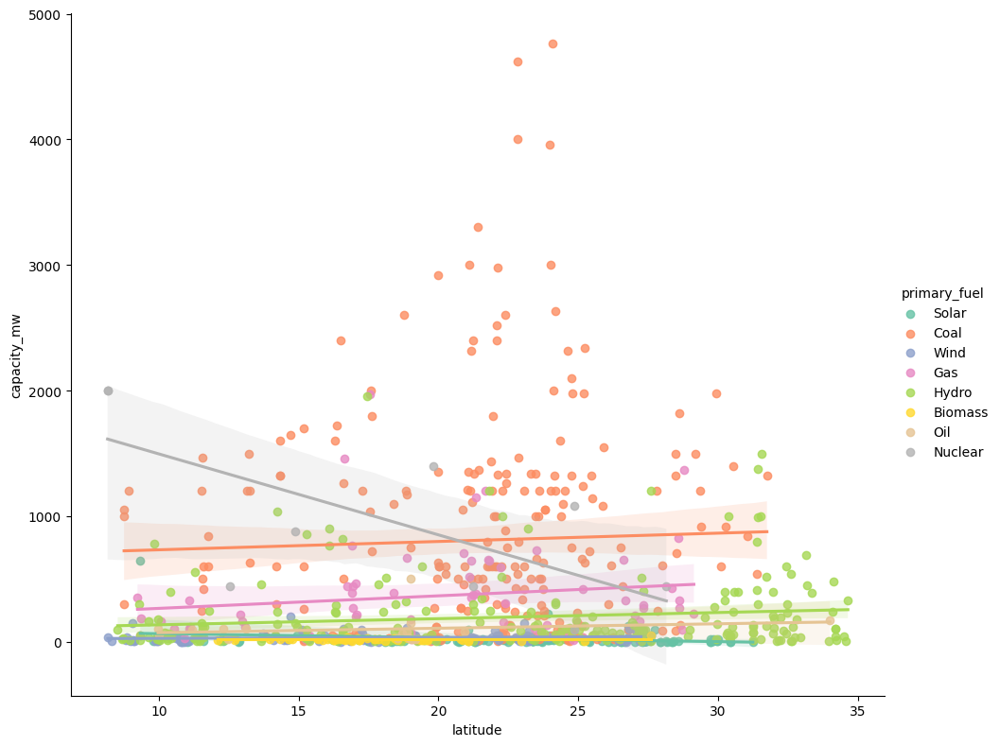

In [84]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "latitude", y = "capacity_mw", data=df,hue='primary_fuel', palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 1200x500 with 0 Axes>

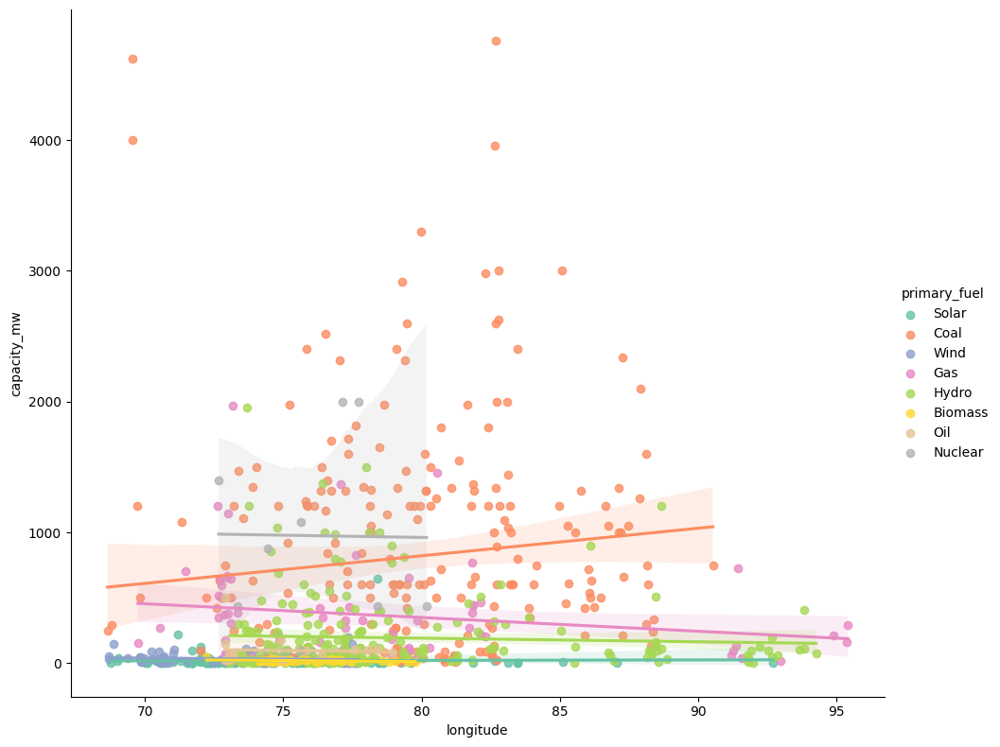

In [85]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "longitude", y = "capacity_mw", data=df,hue='primary_fuel', palette='Set2', height=8, aspect=1.2)
plt.show()


<Figure size 1200x500 with 0 Axes>

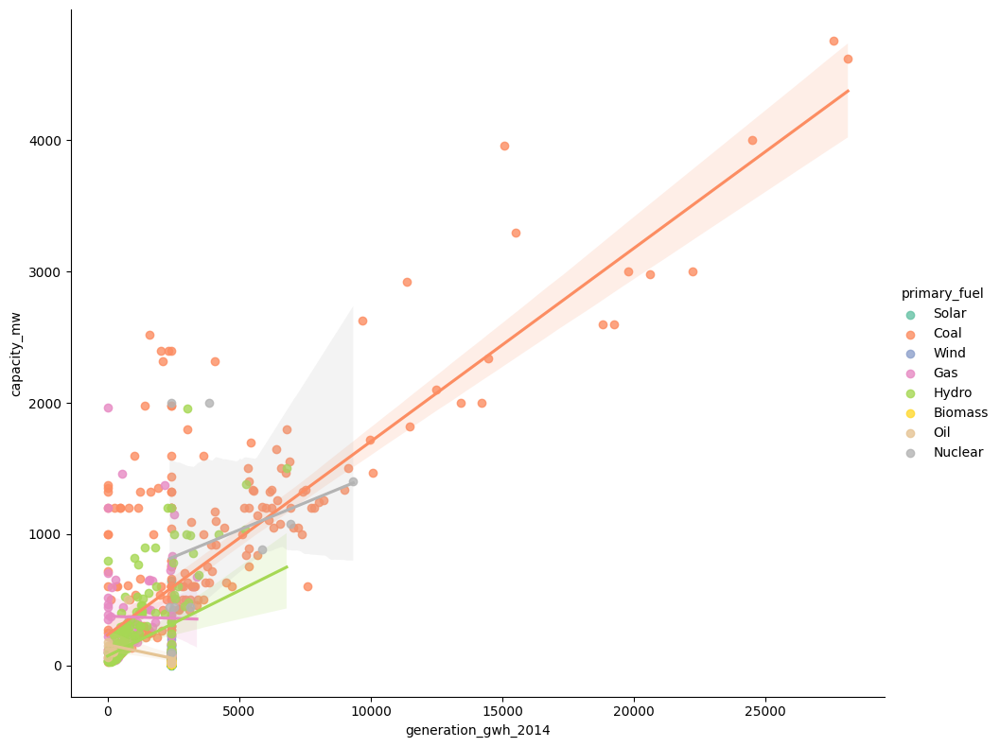

In [86]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2014", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 1200x500 with 0 Axes>

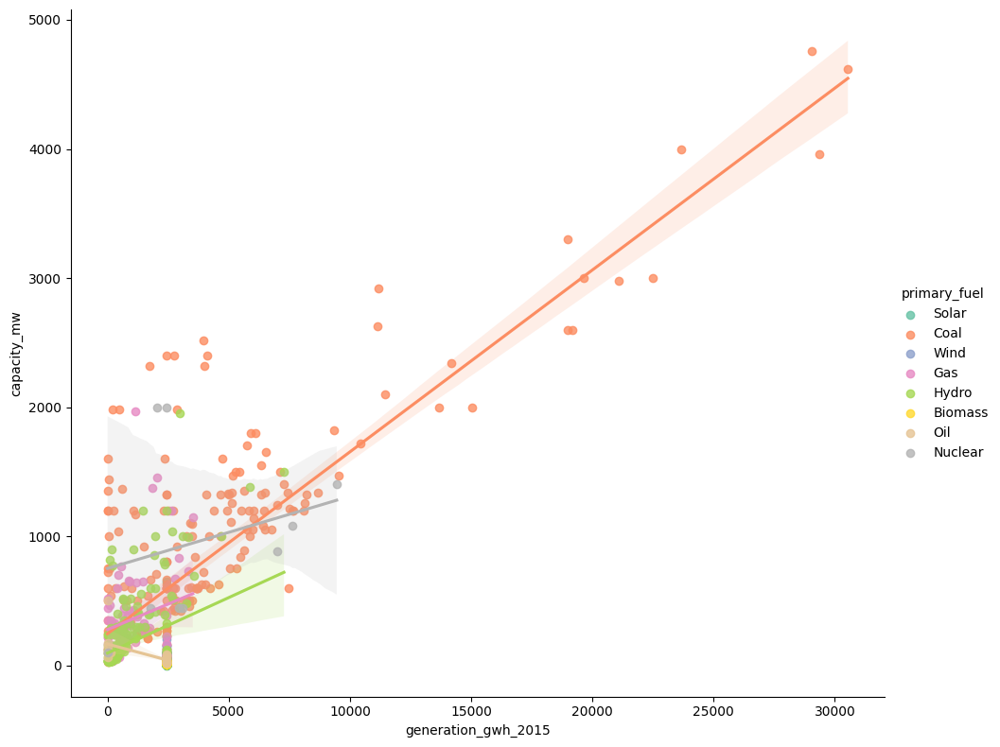

In [87]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2015", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 1200x500 with 0 Axes>

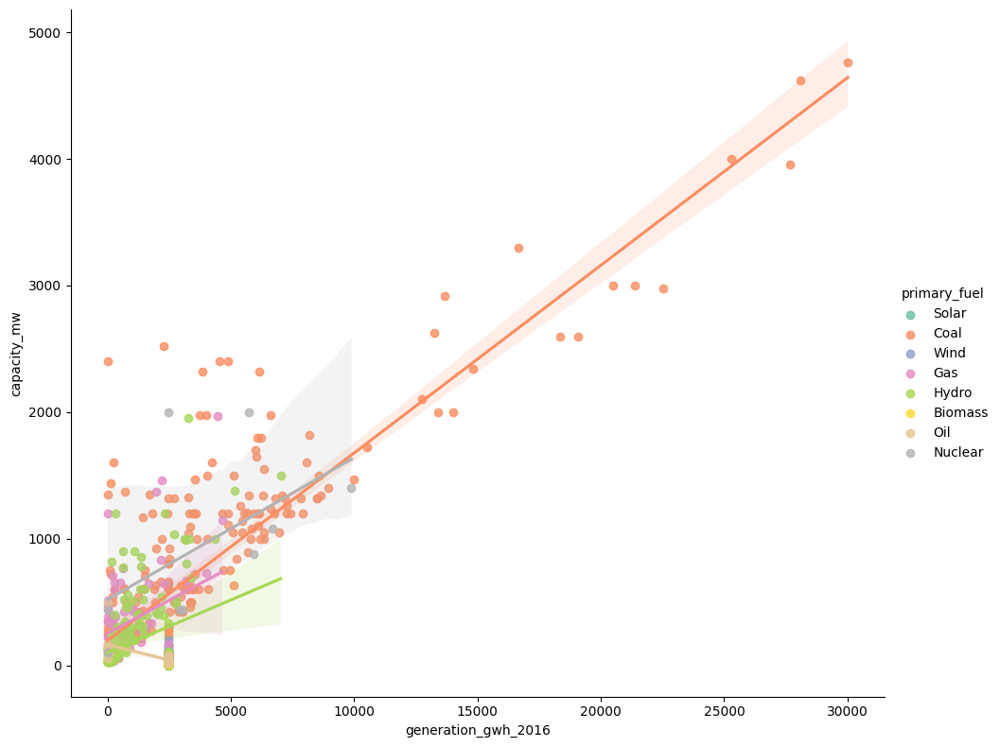

In [88]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2016", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 1200x500 with 0 Axes>

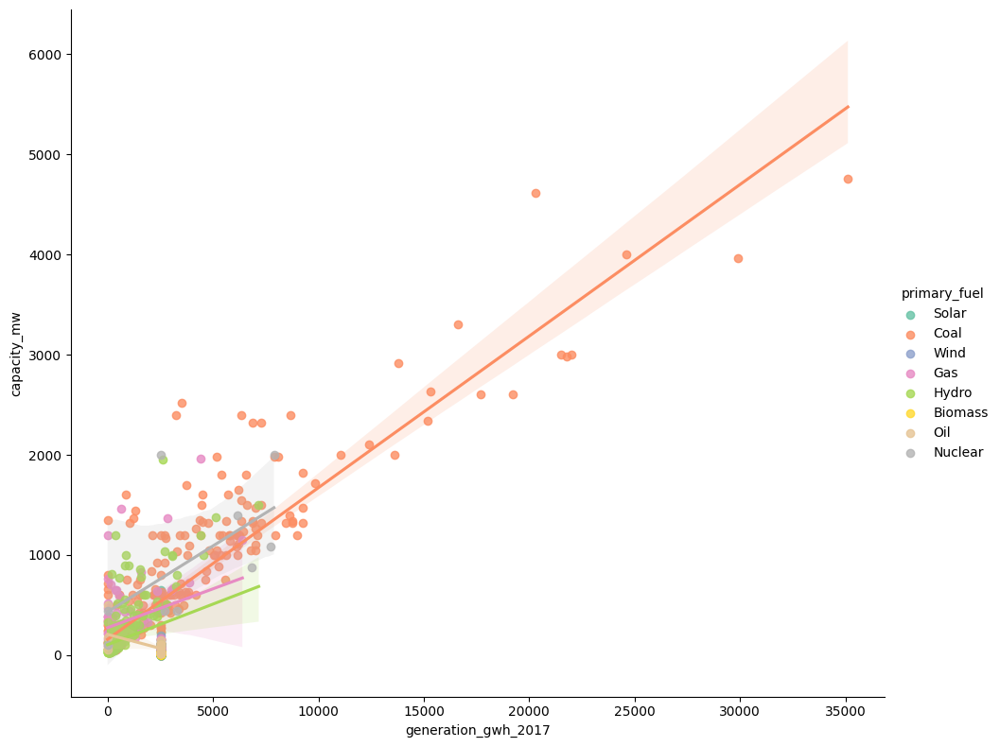

In [89]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2017", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

<Figure size 1200x500 with 0 Axes>

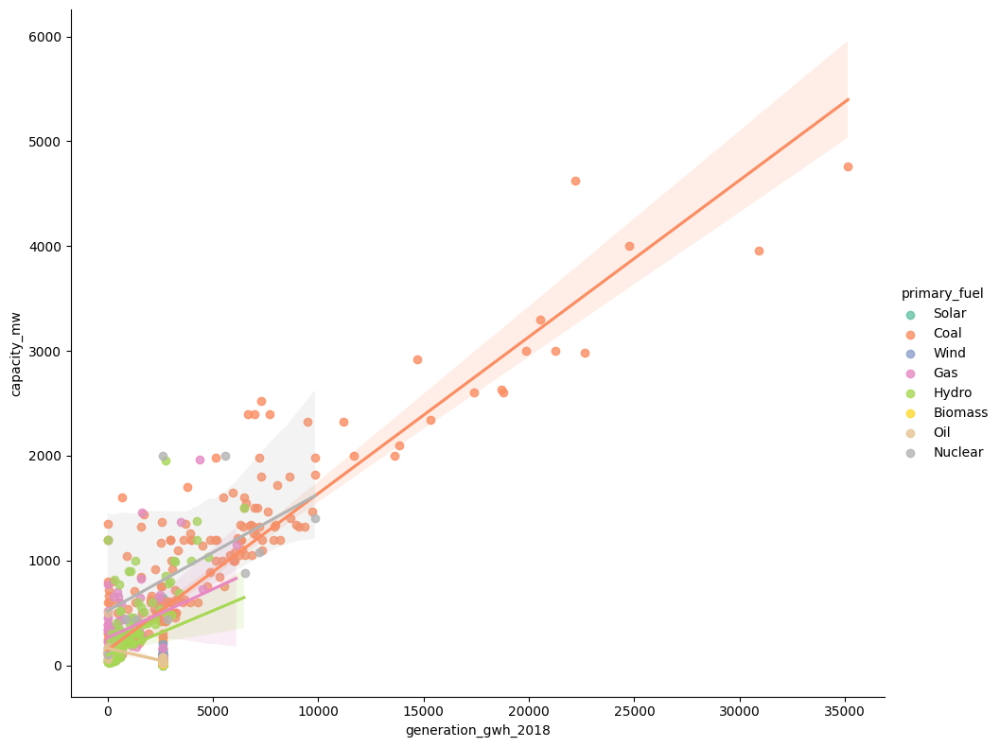

In [90]:
f= plt.figure(figsize=(12,5))
ax =sns.lmplot(x = "generation_gwh_2018", y = "capacity_mw",hue='primary_fuel', data=df, palette='Set2', height=8, aspect=1.2)
plt.show()

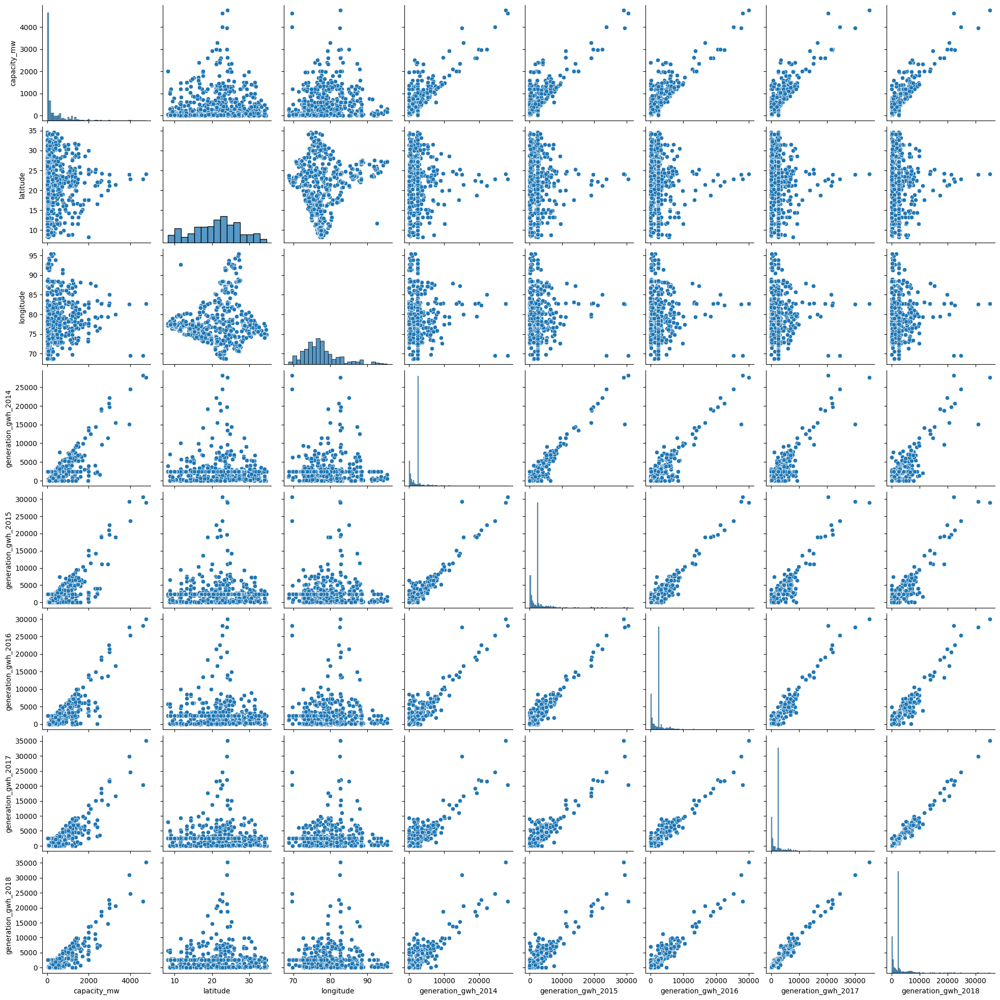

In [91]:
sns.pairplot(df)

In [92]:
# Checking skewness and correlation

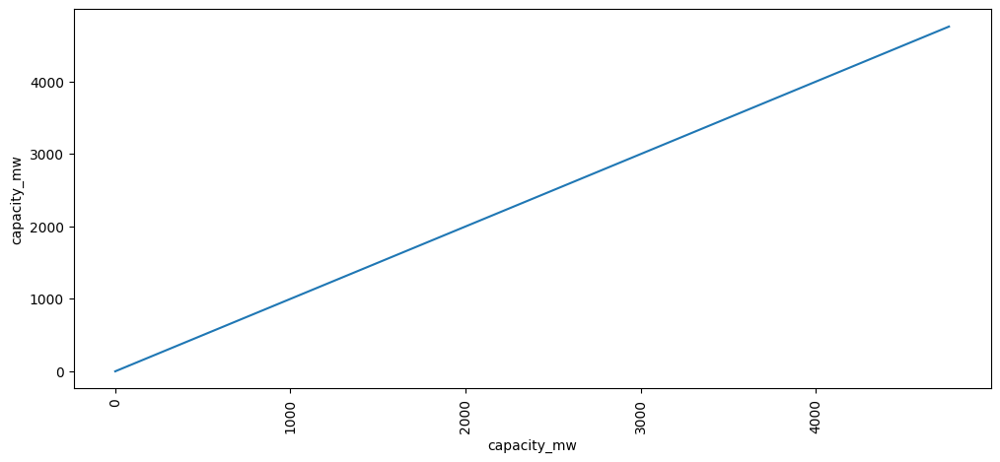

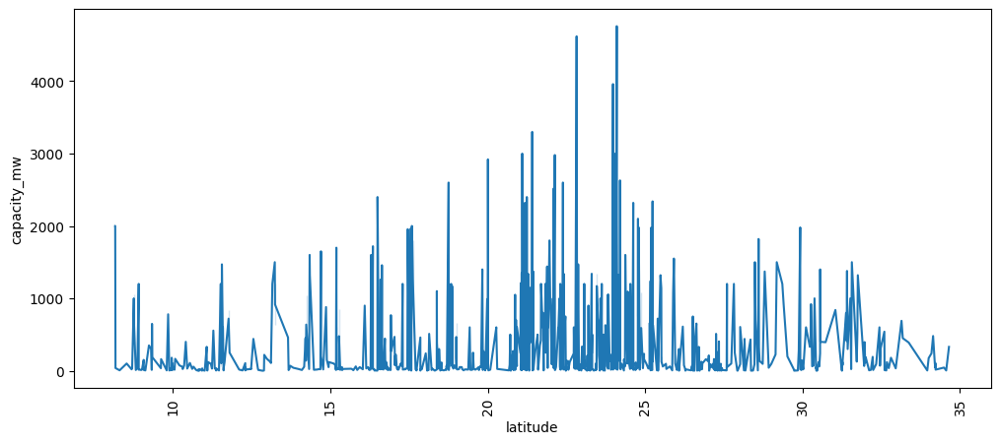

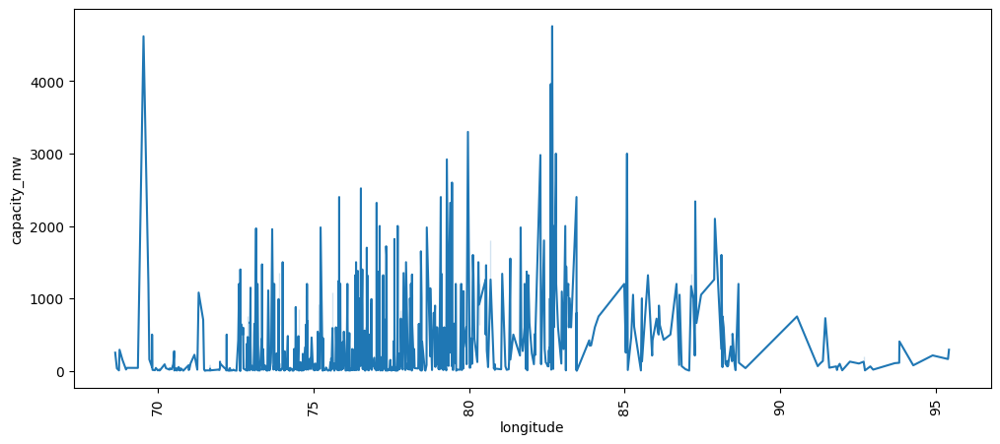

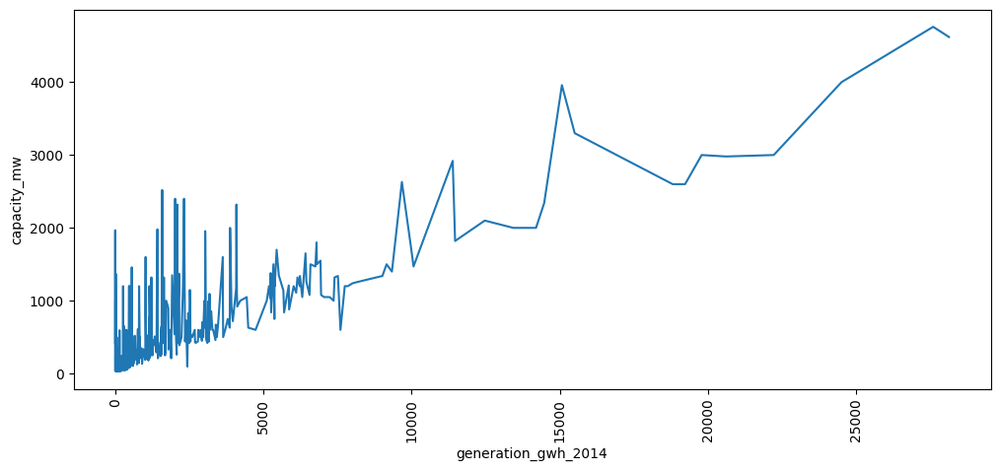

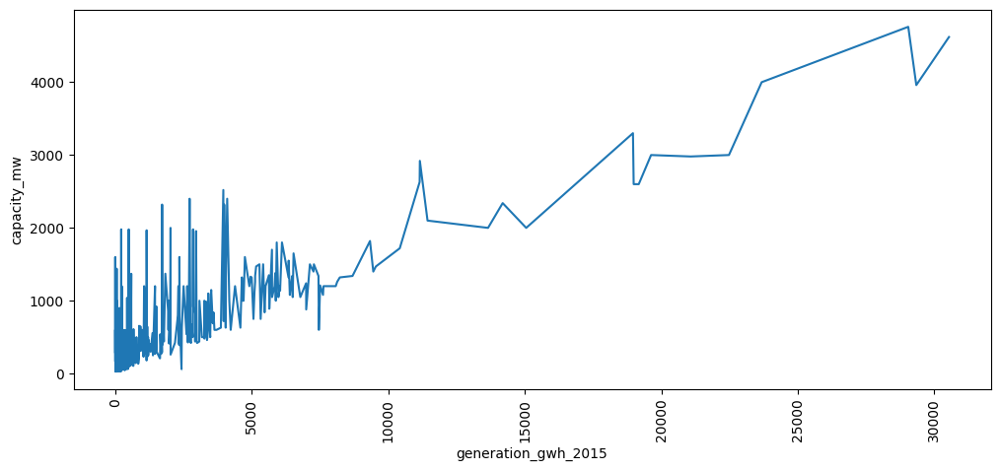

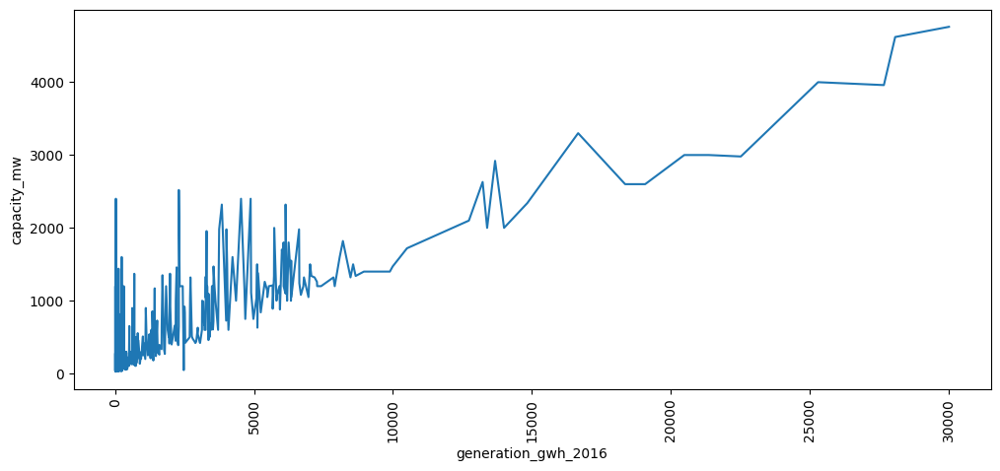

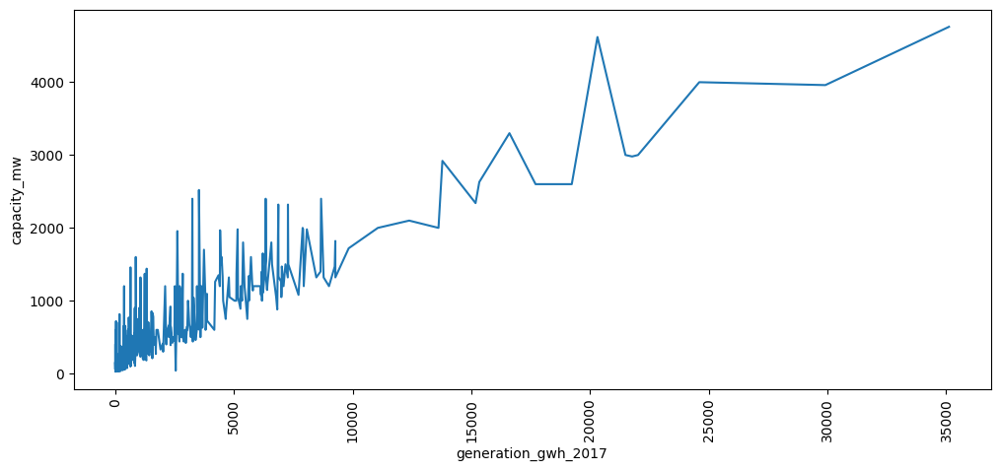

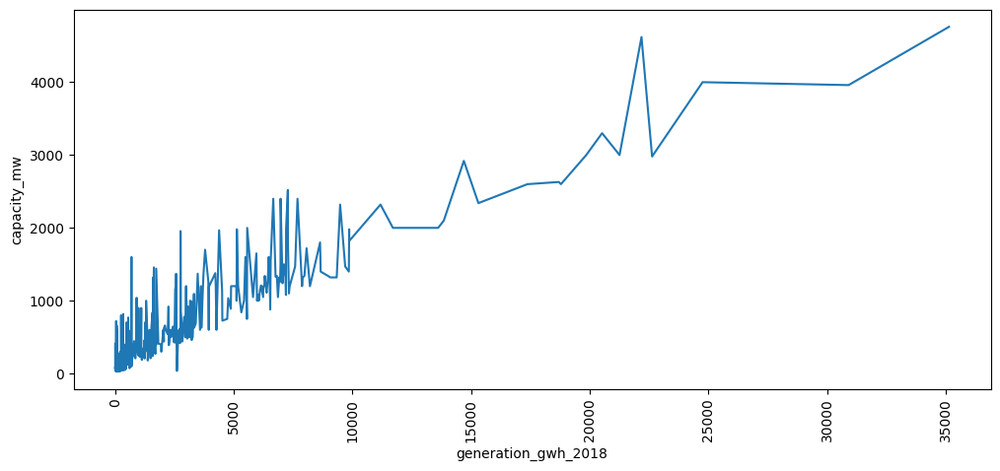

capacity_mw            3.037191
latitude              -0.145866
longitude              1.112646
generation_gwh_2014    4.930254
generation_gwh_2015    5.253370
generation_gwh_2016    4.965294
generation_gwh_2017    5.014455
generation_gwh_2018    4.843057
dtype: float64


In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter numeric columns
cont_columns = df.select_dtypes(include='number').columns.tolist()

for i in cont_columns:
    plt.figure(figsize=(12, 5))
    sns.lineplot(x=i, y='capacity_mw', data=df)
    plt.xlabel(i)
    plt.ylabel('capacity_mw')
    plt.xticks(rotation=90)
    plt.show()

# Calculate skewness for numeric columns
skewness = df[cont_columns].skew()
print(skewness)

In [94]:
df.shape[0]

861

In [95]:
# Using Z Statistics to check and remove any more outliers:

from scipy.stats import zscore

z_score = zscore(df[cont_columns])

abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis=1) # values lying in 3 times std will be removed

df = df[filtering_entry]

df.describe()

,capacity_mw,latitude,longitude,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018
count,825.000000,825.000000,825.000000,825.000000,825.000000,825.000000,825.000000,825.000000
mean,274.289383,21.104112,77.128485,2156.315053,2126.404056,2165.037256,2240.550655,2269.355906
std,427.744391,6.318065,4.514668,1520.239464,1558.540182,1616.584682,1654.614446,1703.087581
min,0.000000,8.168900,68.644700,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.950000,16.626000,74.192400,1146.966350,788.656100,765.503250,829.611100,699.485000
50%,55.000000,21.583700,76.601100,2431.823590,2428.226946,2467.936859,2547.759305,2600.804099
75%,347.500000,25.486500,79.120000,2431.823590,2428.226946,2467.936859,2547.759305,2600.804099
max,2000.000000,34.649000,92.227900,10063.180000,10422.690000,10503.882000,9833.690000,9859.500000


In [96]:
861-825 # outliers deleted

36

In [97]:
36/861*100

4.181184668989547

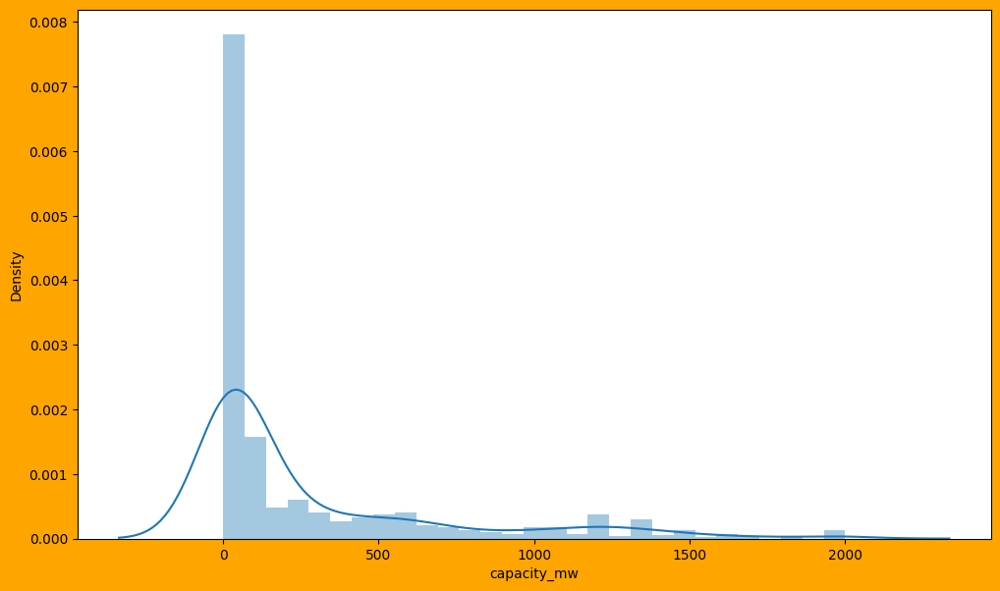

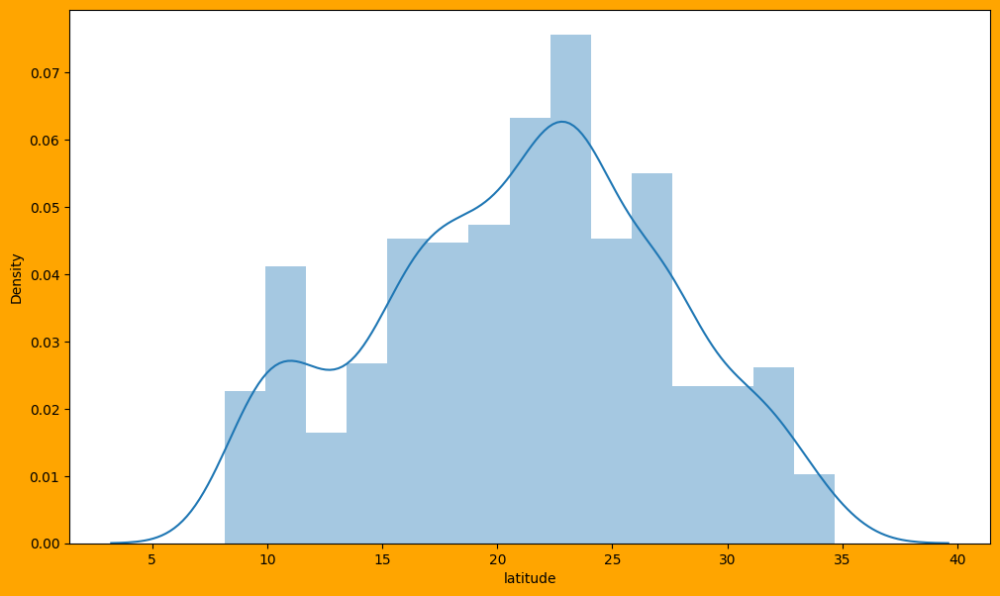

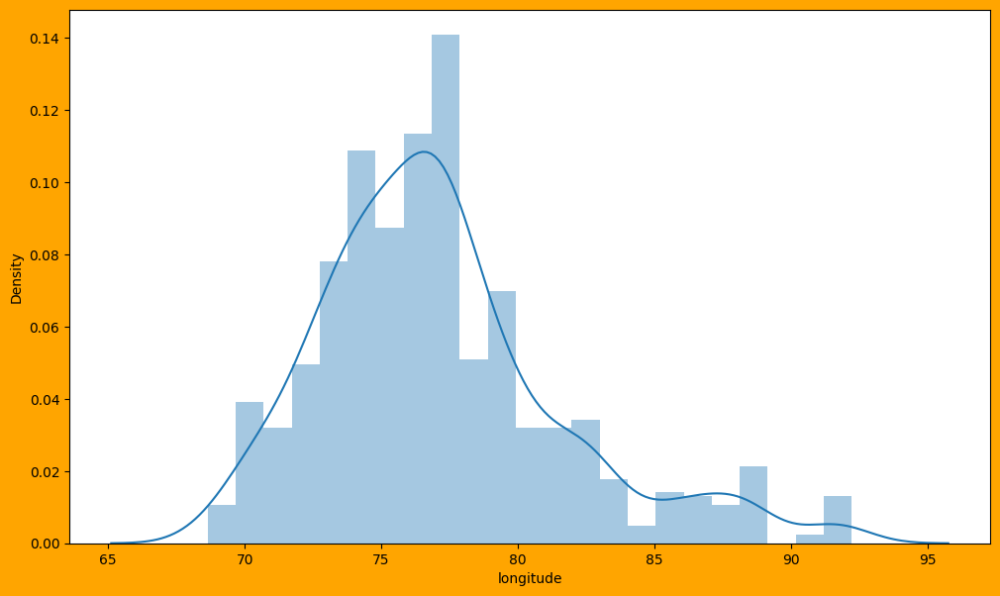

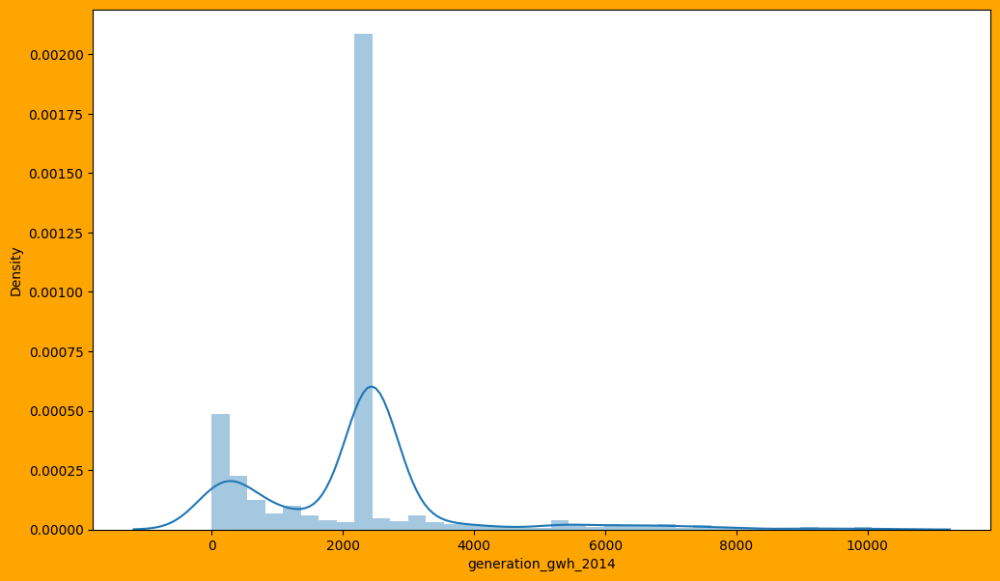

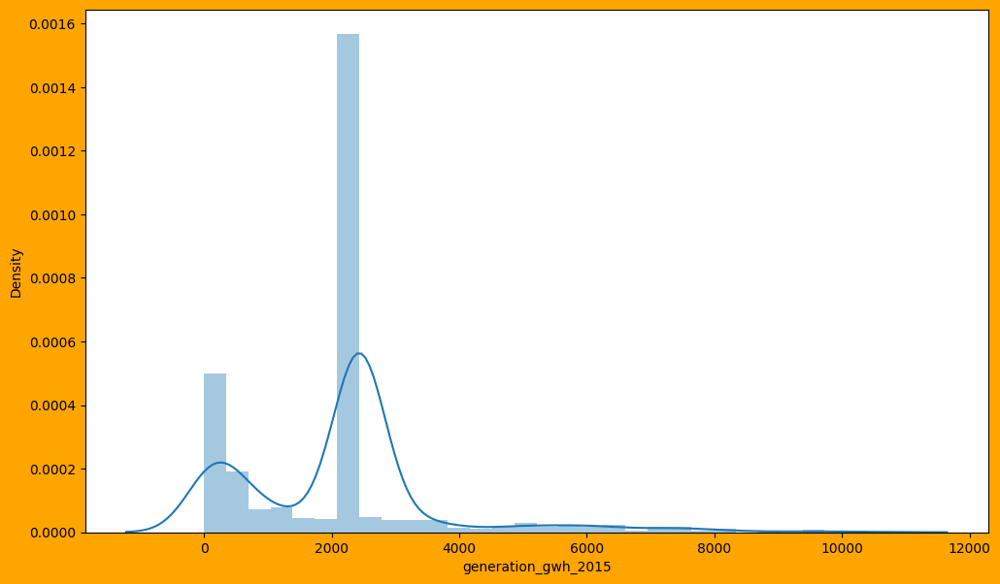

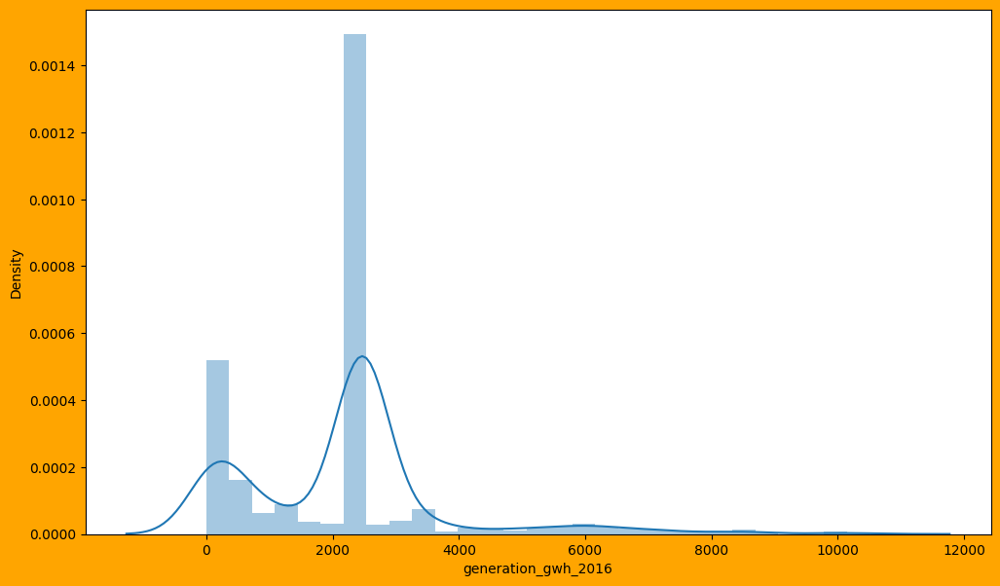

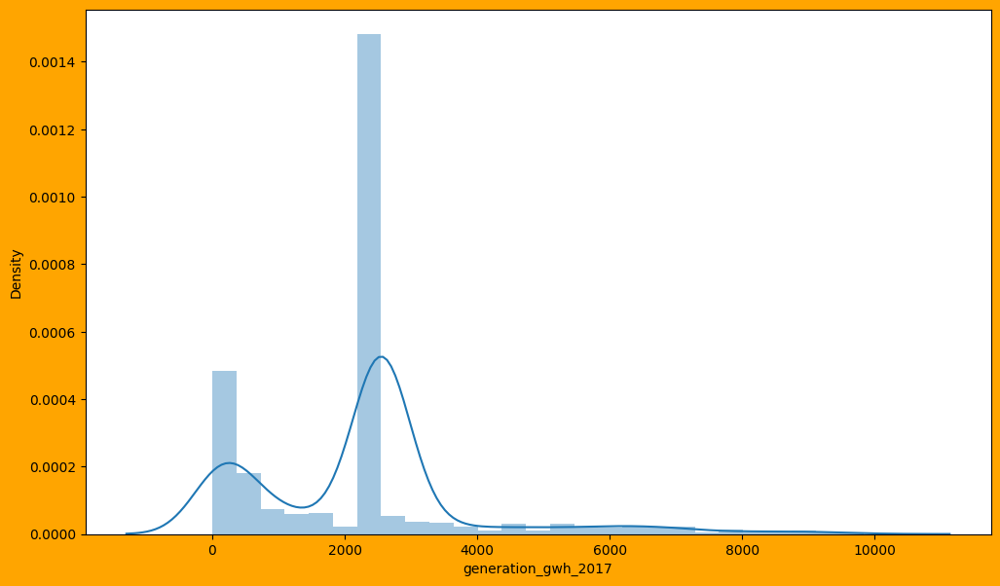

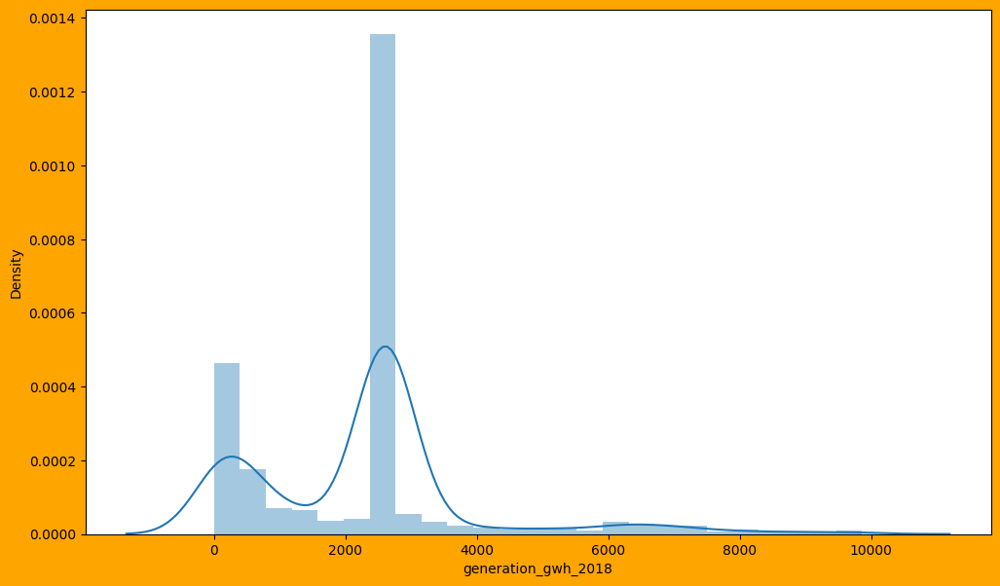

In [98]:
# Checking the distribution of continuous variables:

for i in cont_columns:
    plt.figure(figsize=(12,7),facecolor='orange')
    sns.distplot(df[i])
    plt.show()

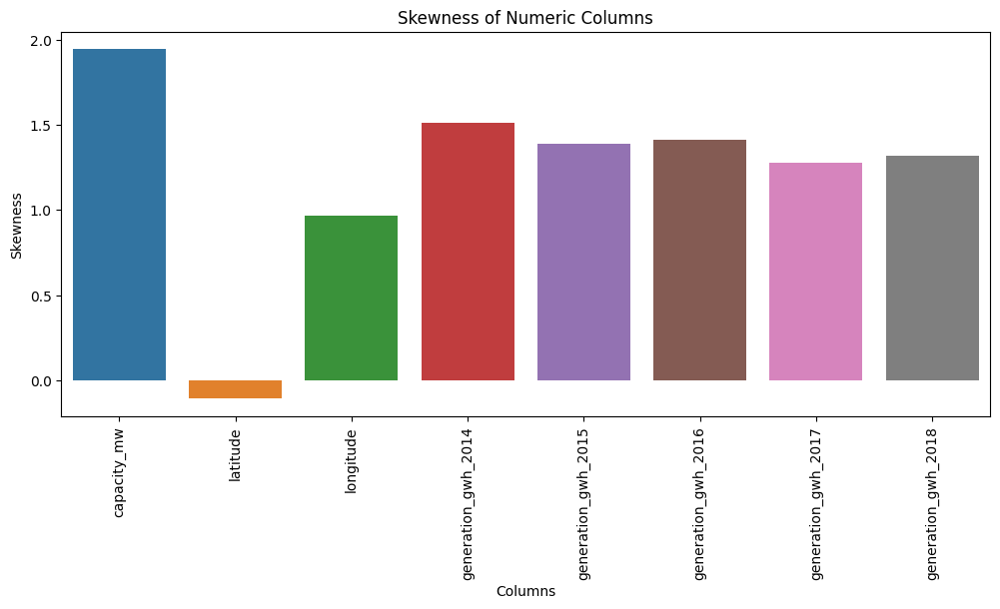

In [99]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Clean the data and convert non-numeric values to NaN
numeric_df = df.select_dtypes(include='number').apply(pd.to_numeric, errors='coerce')

# Calculate skewness for numeric columns
skewness = numeric_df.skew()

# Plot the skewness values
plt.figure(figsize=(12, 5))
sns.barplot(x=skewness.index, y=skewness.values)
plt.xlabel('Columns')
plt.ylabel('Skewness')
plt.xticks(rotation=90)
plt.title('Skewness of Numeric Columns')
plt.show()


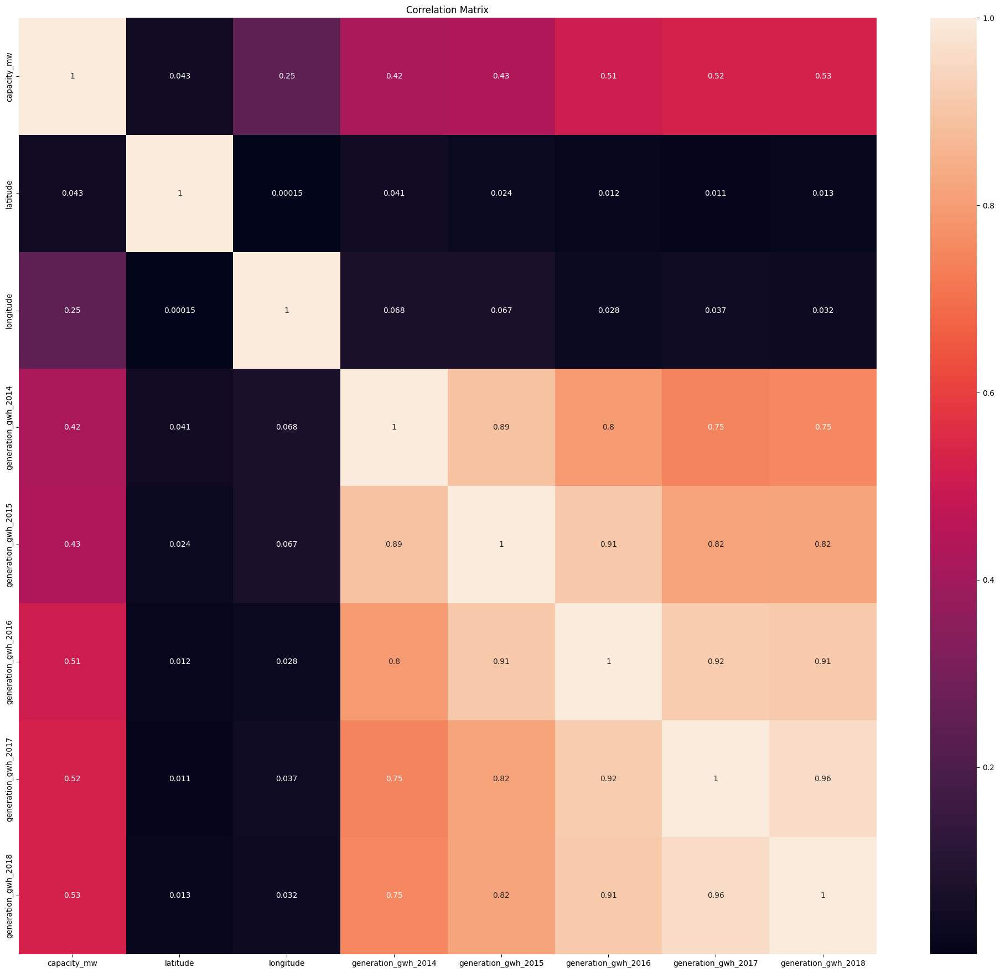

In [100]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Clean the 'capacity_mw' column and convert non-numeric values to NaN
df['capacity_mw'] = pd.to_numeric(df['capacity_mw'], errors='coerce')

# Clean the 'generation_gwh_2015' column and convert non-numeric values to NaN
df['generation_gwh_2015'] = pd.to_numeric(df['generation_gwh_2015'], errors='coerce')

# Create a new DataFrame containing only numeric columns for correlation calculation
df_numeric = df.select_dtypes(include='number')

# Calculate the correlation matrix
df_corr = df_numeric.corr().abs()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(25, 22))
sns.heatmap(df_corr, annot=True, annot_kws={'size': 10})
plt.title('Correlation Matrix')
plt.show()

In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df[cont_columns],i) for i in range(df[cont_columns].shape[1])]
vif['features'] = df[cont_columns].columns
vif


,vif,features
0,1.989602,capacity_mw
1,11.799357,latitude
2,13.404212,longitude
3,15.511652,generation_gwh_2014
4,30.363413,generation_gwh_2015
5,35.858405,generation_gwh_2016
6,40.225898,generation_gwh_2017
7,38.136745,generation_gwh_2018


In [102]:
df_new = pd.get_dummies(df)

In [103]:
df_new.shape

(825, 2497)

In [104]:
df_new.columns

Index(['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018', 'country_IND', 'country_long_India',
       ...
       'url_https://www.solairedirect.com', 'url_https://www.vardhman.com/',
       'url_https://www.zaubacorp.com/company/MAHATMA-SUGAR-POWER-LIMITED/U15421MH1997PLC111855',
       'geolocation_source_Industry About',
       'geolocation_source_National Renewable Energy Laboratory',
       'geolocation_source_WRI', 'year_of_capacity_data_2019.0',
       'year_of_capacity_data_Not available',
       'generation_data_source_Central Electricity Authority',
       'generation_data_source_Not available'],
      dtype='object', length=2497)

In [105]:
for i in df_new.columns:
    print(i ,':',df_new[i].skew())

capacity_mw : 1.9450037154077853
latitude : -0.10804699022024333
longitude : 0.9673960048008245
generation_gwh_2014 : 1.5155143397505952
generation_gwh_2015 : 1.3894864586600417
generation_gwh_2016 : 1.4109761257769982
generation_gwh_2017 : 1.2808135488418215
generation_gwh_2018 : 1.3195519030420835
country_IND : 0
country_long_India : 0
name_ACME Solar Tower : 28.722813232690164
name_ADITYA CEMENT WORKS : 28.722813232690164
name_AES Saurashtra Windfarms : 28.722813232690164
name_AGARTALA GT : 28.722813232690164
name_AKALTARA TPP : 28.722813232690164
name_AKRIMOTA LIG : 28.722813232690164
name_ALIYAR : 28.722813232690164
name_ALLAIN DUHANGAN : 28.722813232690164
name_ALMATTI DAM : 28.722813232690164
name_AMAR KANTAK : 28.722813232690164
name_AMARAVATI TPP : 28.722813232690164
name_ANANDPUR SAHIB ST-I&II : 28.722813232690164
name_ANAPARA "C" : 28.722813232690164
name_ANDHRA : 28.722813232690164
name_ANTA GT : 28.722813232690164
name_ANUPPUR : 28.722813232690164
name_ANUPUR TPP : 28.7228

In [106]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

data_trans = pt.fit_transform(df_new)

In [107]:
# Splitting data into features and label:

y = df_new['capacity_mw']
X = df_new.drop('capacity_mw',axis=1)

In [108]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

X_trans = pt.fit_transform(X)

In [109]:
from sklearn.decomposition import PCA
# Using PCA i.e. Principal Component Analysis that is a diamensionallity reduction technique:

pca = PCA()
pca.fit_transform(X_trans)


array([[ 4.21053274e+00,  5.93191912e+00,  1.34123599e+01, ...,
         1.51377772e-16, -3.90392212e-15,  1.14307289e-14],
       [ 3.12541621e+00, -2.44297873e+00,  2.85729788e+00, ...,
        -8.48246708e-01, -3.61765589e-01,  1.14307289e-14],
       [ 4.07650829e+00, -3.48276117e+00, -2.50405477e+00, ...,
        -6.12754638e-15,  1.06640280e-15,  1.14307289e-14],
       ...,
       [ 2.75638057e+00, -3.01475266e+00, -1.45294089e+00, ...,
        -1.76268864e-16,  2.98045861e-15,  1.14307289e-14],
       [ 3.19706611e+00, -2.34240037e+00,  2.75481170e+00, ...,
        -1.87639246e-01,  1.16139444e-01,  1.14307289e-14],
       [ 3.62951377e+00, -4.11703831e+00, -2.38582487e+00, ...,
        -8.81344319e-16,  4.21723257e-15,  1.14307289e-14]])

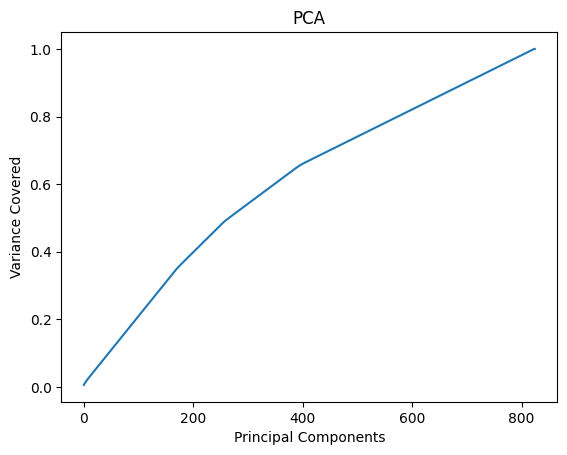

In [110]:
# Using Scree Plot to identify best components:

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()


In [111]:
pca = PCA(n_components=800)
new_pcomp = pca.fit_transform(X_trans)
princi_comp = pd.DataFrame(new_pcomp)
princi_comp

,0,1,2,3,4,5,6,7,8,9,...,790,791,792,793,794,795,796,797,798,799
0,4.210533,5.931919,13.412360,31.686018,4.205724,0.713506,-1.536854,-1.110226,0.781194,0.171765,...,-3.355521e-14,6.072441e-16,-8.961596e-16,1.053251e-16,-1.177886e-15,-3.461435e-16,-7.767849e-16,-4.757763e-17,-1.265262e-16,-1.510304e-14
1,3.125416,-2.442979,2.857298,-1.499244,-0.026418,2.696031,-5.399714,-1.087987,-2.258486,-0.224198,...,-7.171781e-01,3.592171e-01,-5.452174e+00,9.027010e-01,-2.574564e+00,-3.153278e+00,-4.279942e+00,-1.228265e+00,1.711515e+00,-3.312556e+00
2,4.076508,-3.482761,-2.504055,2.016532,-4.474340,-1.760286,1.110514,0.411390,-1.416840,0.204823,...,2.397942e-16,1.029741e-14,-1.378420e-14,-3.906559e-15,6.786348e-15,9.668624e-15,6.583644e-15,-5.993759e-16,1.196866e-14,-2.497229e-14
3,-3.989484,0.562112,-0.526852,-0.044152,0.173105,-0.004765,-0.369484,0.719244,0.932578,0.414703,...,-5.587583e-01,-1.064862e+00,-1.003691e+00,2.427988e-01,-1.768383e+00,-6.369468e-01,-3.638674e-02,-3.588158e-01,6.746277e-01,-2.728296e-01
4,-1.798080,-1.046977,4.955180,-1.858232,-0.293497,-0.910264,2.543076,0.538195,0.697979,-0.043641,...,-5.565457e+00,-7.188588e-02,-3.688346e-01,1.223666e-01,-8.084503e-01,1.081095e+00,1.332236e+00,7.436413e-01,1.335583e-01,-2.756168e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,-3.699111,0.258138,-0.071756,-0.208219,0.040402,0.193378,-0.741303,-0.410297,-0.142309,-0.353978,...,-7.577071e-01,-5.026086e-01,7.066034e-04,-5.598097e-01,-2.334501e+00,-1.388781e-01,-7.203322e-01,-2.540508e-02,2.731647e-02,3.941612e-01
821,5.214896,4.612724,-0.761988,-1.313829,0.237325,-0.552464,0.030913,-4.497560,9.268823,-7.494257,...,-5.614016e-01,4.642805e-01,8.086714e-02,8.120350e-02,1.159078e+00,6.538729e-01,5.228491e-01,2.601563e-01,1.928752e-01,2.079561e-01
822,2.756381,-3.014753,-1.452941,1.075911,-3.013453,-1.370659,0.825570,-0.445207,0.198441,0.206556,...,-7.403292e-16,8.341924e-15,-6.715844e-15,-4.129098e-15,-2.961317e-15,-9.708008e-15,-7.024314e-15,-8.549040e-15,4.935528e-15,-1.780316e-15
823,3.197066,-2.342400,2.754812,-1.311901,-0.196962,2.776996,-5.084559,1.209573,-6.121158,-0.677854,...,2.143059e-01,-7.822485e-01,3.268574e-01,3.263953e-01,-1.932677e-01,-1.187082e-01,-2.009461e-01,-1.013694e-01,-5.062749e-02,-1.807213e-01


In [112]:
princi_comp.shape

(825, 800)

In [113]:
for i in princi_comp.columns:
    print(i ,':',princi_comp[i].skew())

0 : 0.1767006947764003
1 : 0.5479469963853162
2 : 1.188156391315505
3 : 10.515121881085289
4 : 1.7113134377892012
5 : 6.231812760808736
6 : -0.02706713129428284
7 : 4.258567887136317
8 : 1.6087629193960142
9 : 0.10843742443537759
10 : 6.896077066803205
11 : 2.1617031026123383
12 : 6.990421489583526
13 : 3.0590503658221335
14 : 4.442209908637394
15 : 2.908875487427873
16 : 9.473604239556357
17 : 4.350893288988057
18 : 3.67046014240925
19 : 4.655267093838874
20 : 3.7514212909042777
21 : -1.951066256547128
22 : 6.075493555998584
23 : -0.06656565428443052
24 : 1.6971834102629664
25 : 0.23823326730431194
26 : 2.2214887315574026
27 : 0.24136891331510085
28 : 8.751159665195718
29 : 7.311085279662711
30 : 1.9611303182929298
31 : 7.953430577887998
32 : 1.927824027045211
33 : 3.331129386094182
34 : 3.1475045220593945
35 : 3.998597341711301
36 : 5.395887956104522
37 : 5.9848319070285365
38 : 2.5545804633808964
39 : 2.0059596804252187
40 : 2.3379633171933567
41 : 5.518050953154431
42 : 0.289408314

In [114]:
# Splitting our data to training data and testing data
# x_train,x_test,y_train,y_test

x_train,x_test,y_train,y_test = train_test_split(princi_comp,y,test_size=0.30,random_state=1)

# Here we are keeping training data as our scalled data and testing data as our label or target.

In [115]:
# MOdel instantiating and training

rm = LinearRegression()
rm.fit(x_train,y_train) 
# here we will pass training data

LinearRegression()

In [116]:
# Testing our model with Adjusted R2 Square: 

# on training data

rm.score(x_train,y_train)

1.0

In [117]:
# PLotting and visualizing

y_pred = rm.predict(x_test)

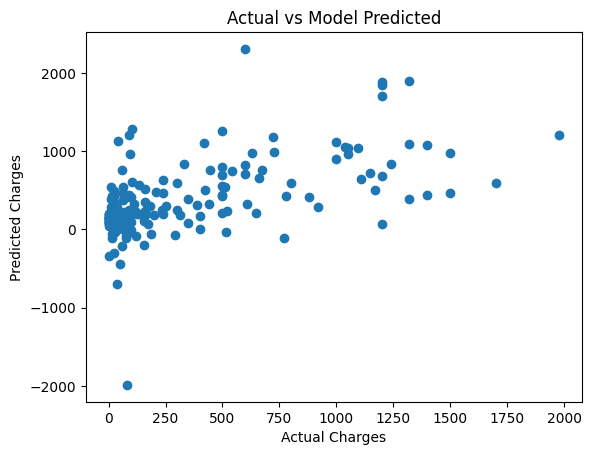

In [118]:
plt.scatter(y_test,y_pred)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

In [119]:
# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

mean_absolute_error(y_test,y_pred) # 4 % error

248.468028440099

In [120]:
mean_squared_error(y_test,y_pred) # lesser the better

135676.02093857597

In [121]:
# RMSE
np.sqrt(mean_squared_error(y_test,y_pred))

368.3422605927481

In [122]:
print("Score: ", rm.score(x_test, y_test))

Score:  0.1187305549698412


In [123]:
print(rm.coef_)
print(f"{rm.intercept_:.2f}")

[-4.10981299e+01 -1.21993857e+01  9.01927686e+01 -2.95653871e+01
 -5.48210603e+00 -1.65079490e+01  5.33842224e+01  1.67677168e+01
  1.56003926e+01 -3.35186589e+00  1.79584031e-01 -1.12899623e+00
 -2.31302893e+00  2.75172333e+00  5.26757206e-01  1.63925303e+00
 -7.81853045e-01  1.24237170e+00 -3.39903302e+00 -1.45325813e+00
  3.43623506e-02 -1.37985516e+00 -3.91997292e+00  1.16167051e+00
 -2.41835420e-01  1.34527094e+00  1.06784075e+00  2.44536902e+00
  3.28603665e-01 -3.93358683e-01  1.84747818e-01  2.08599544e+00
 -1.17255126e+00 -2.21639950e+00 -2.93513501e+00  5.72042140e+00
 -1.70699218e+00 -9.04342241e-01 -2.12301221e+00  1.41214710e+00
 -4.11940375e-01  4.09895357e+00  2.78243949e+00 -2.09769173e+00
  4.32121724e-01 -8.41597326e-01  1.20938393e+00  5.11218272e-01
 -7.04926422e-01 -6.08963613e-01  8.80811250e-01 -6.83577285e-01
 -4.33685189e-01 -1.79285612e+00 -2.18145173e-01 -3.78902389e-01
 -6.72542551e-01  4.65355975e-01  6.17214827e-01 -9.65263451e-01
 -9.93772498e-02  1.76643

In [124]:
# Solving classification problem

In [125]:
df_cl = df.copy()
df_cl.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'commissioning_year', 'owner',
       'source', 'url', 'geolocation_source', 'year_of_capacity_data',
       'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016',
       'generation_gwh_2017', 'generation_gwh_2018', 'generation_data_source'],
      dtype='object')

In [126]:
# Splitting data into features and label:

y = df_cl['primary_fuel']
X = df_cl.drop('primary_fuel',axis=1)

In [127]:
# Encoding training data:
X_dummies = pd.get_dummies(X)

In [128]:
# Encoding lables:

from sklearn.preprocessing import LabelEncoder

lbl = LabelEncoder()
y_enc = lbl.fit_transform(y)

In [129]:
X_dummies.shape

(825, 2489)

In [130]:
y_enc

array([6, 1, 7, 2, 1, 1, 3, 3, 3, 1, 1, 3, 1, 3, 2, 1, 1, 0, 0, 0, 2, 1,
       1, 6, 7, 6, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 1, 0, 3, 3, 1, 3, 1, 1,
       1, 1, 3, 3, 3, 3, 3, 1, 1, 2, 1, 3, 1, 1, 1, 2, 3, 3, 7, 1, 0, 0,
       1, 1, 1, 3, 1, 3, 1, 0, 3, 3, 3, 1, 3, 3, 3, 1, 1, 3, 3, 3, 1, 0,
       1, 1, 1, 1, 3, 3, 1, 1, 1, 7, 5, 2, 1, 3, 5, 1, 6, 6, 7, 6, 6, 6,
       6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 6, 7, 6, 6, 6, 6, 1, 3, 3, 3, 1, 1,
       1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 0, 6, 6, 7, 6, 1, 2, 4, 1, 1, 1,
       0, 0, 3, 1, 2, 3, 3, 1, 1, 3, 2, 2, 5, 3, 0, 5, 3, 3, 0, 3, 1, 1,
       1, 6, 2, 6, 7, 6, 6, 6, 6, 6, 6, 3, 7, 2, 7, 7, 7, 2, 7, 2, 7, 1,
       2, 3, 2, 2, 3, 1, 3, 3, 2, 1, 7, 3, 3, 3, 1, 1, 3, 7, 1, 2, 1, 1,
       2, 1, 3, 7, 6, 6, 6, 6, 6, 6, 7, 6, 6, 6, 1, 3, 0, 3, 0, 2, 2, 0,
       3, 0, 7, 7, 7, 7, 7, 1, 7, 6, 1, 2, 3, 3, 1, 7, 1, 1, 3, 1, 1, 7,
       6, 6, 3, 0, 3, 1, 1, 1, 1, 1, 2, 3, 1, 3, 1, 6, 6, 7, 7, 7, 7, 7,
       3, 3, 3, 4, 1, 3, 4, 3, 3, 1, 3, 1, 1, 1, 3,

In [131]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

X_trans_cl = pt.fit_transform(X_dummies)

In [132]:
from sklearn.decomposition import PCA
# Using PCA i.e. Principal Component Analysis that is a diamensionallity reduction technique:

pca1 = PCA()
pca1.fit_transform(X_trans_cl)



array([[ 3.98105304e+00,  5.14753364e+00,  3.29391043e+01, ...,
         3.41711609e-15,  6.62081951e-15,  1.09580731e-14],
       [ 3.33320988e+00, -2.83090561e+00, -1.19095784e-02, ...,
         1.15695546e+00,  2.66780637e-01,  1.09580731e-14],
       [ 3.86193716e+00, -2.58234242e+00, -2.97100578e-01, ...,
         5.40357800e-15,  4.84249112e-15,  1.09580731e-14],
       ...,
       [ 2.56912735e+00, -2.23023535e+00, -3.37799902e-01, ...,
        -4.77688621e-15, -1.01222395e-14,  1.09580731e-14],
       [ 3.40133162e+00, -2.71372183e+00,  2.01113163e-01, ...,
         6.09369346e-02,  3.08851544e-02,  1.09580731e-14],
       [ 3.52306078e+00, -3.33733387e+00, -7.75563410e-01, ...,
        -2.03700706e-15, -5.39823395e-15,  1.09580731e-14]])

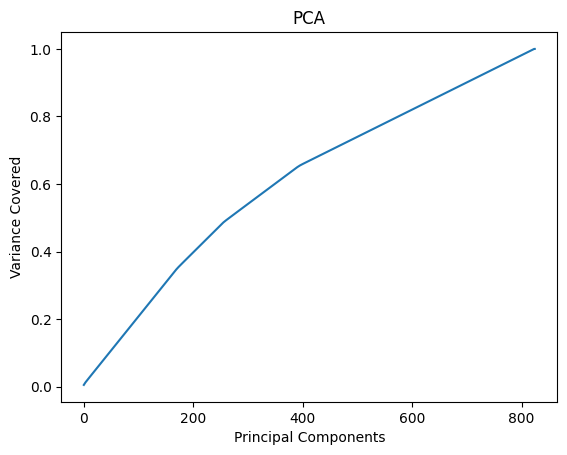

In [133]:
# Using Scree Plot to identify best components:

plt.figure()
plt.plot(np.cumsum(pca1.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()


In [134]:
pca1 = PCA(n_components=800)
new_pcomp = pca1.fit_transform(X_trans)
princi_comp = pd.DataFrame(new_pcomp)
princi_comp

,0,1,2,3,4,5,6,7,8,9,...,790,791,792,793,794,795,796,797,798,799
0,4.210533,5.931919,13.412360,31.686018,4.205724,0.713506,-1.536854,-1.110226,0.781194,0.171765,...,-3.355521e-14,6.072441e-16,-8.961596e-16,1.053251e-16,-1.177886e-15,-3.461435e-16,-7.767849e-16,-4.757763e-17,-1.265262e-16,-1.510304e-14
1,3.125416,-2.442979,2.857298,-1.499244,-0.026418,2.696031,-5.399714,-1.087987,-2.258486,-0.224198,...,-7.171781e-01,3.592171e-01,-5.452174e+00,9.027010e-01,-2.574564e+00,-3.153278e+00,-4.279942e+00,-1.228265e+00,1.711515e+00,-3.312556e+00
2,4.076508,-3.482761,-2.504055,2.016532,-4.474340,-1.760286,1.110514,0.411390,-1.416840,0.204823,...,2.397942e-16,1.029741e-14,-1.378420e-14,-3.906559e-15,6.786348e-15,9.668624e-15,6.583644e-15,-5.993759e-16,1.196866e-14,-2.497229e-14
3,-3.989484,0.562112,-0.526852,-0.044152,0.173105,-0.004765,-0.369484,0.719244,0.932578,0.414703,...,-5.587583e-01,-1.064862e+00,-1.003691e+00,2.427988e-01,-1.768383e+00,-6.369468e-01,-3.638674e-02,-3.588158e-01,6.746277e-01,-2.728296e-01
4,-1.798080,-1.046977,4.955180,-1.858232,-0.293497,-0.910264,2.543076,0.538195,0.697979,-0.043641,...,-5.565457e+00,-7.188588e-02,-3.688346e-01,1.223666e-01,-8.084503e-01,1.081095e+00,1.332236e+00,7.436413e-01,1.335583e-01,-2.756168e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,-3.699111,0.258138,-0.071756,-0.208219,0.040402,0.193378,-0.741303,-0.410297,-0.142309,-0.353978,...,-7.577071e-01,-5.026086e-01,7.066034e-04,-5.598097e-01,-2.334501e+00,-1.388781e-01,-7.203322e-01,-2.540508e-02,2.731647e-02,3.941612e-01
821,5.214896,4.612724,-0.761988,-1.313829,0.237325,-0.552464,0.030913,-4.497560,9.268823,-7.494257,...,-5.614016e-01,4.642805e-01,8.086714e-02,8.120350e-02,1.159078e+00,6.538729e-01,5.228491e-01,2.601563e-01,1.928752e-01,2.079561e-01
822,2.756381,-3.014753,-1.452941,1.075911,-3.013453,-1.370659,0.825570,-0.445207,0.198441,0.206556,...,-7.403292e-16,8.341924e-15,-6.715844e-15,-4.129098e-15,-2.961317e-15,-9.708008e-15,-7.024314e-15,-8.549040e-15,4.935528e-15,-1.780316e-15
823,3.197066,-2.342400,2.754812,-1.311901,-0.196962,2.776996,-5.084559,1.209573,-6.121158,-0.677854,...,2.143059e-01,-7.822485e-01,3.268574e-01,3.263953e-01,-1.932677e-01,-1.187082e-01,-2.009461e-01,-1.013694e-01,-5.062749e-02,-1.807213e-01


In [135]:
X_train, X_test, Y_train, y_test = train_test_split(princi_comp, y_enc, test_size=0.3, random_state=0)

In [136]:
pip install imbalanced-learn


Note: you may need to restart the kernel to use updated packages.


In [137]:
# Assuming you have already loaded and split your data into X_train, X_test, Y_train, and Y_test

from imblearn.over_sampling import SMOTE

# Print the counts of labels before oversampling
print("Before OverSampling, counts of label '1': {} \n".format(sum(Y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(Y_train == 0)))

# Apply SMOTE to oversample the minority class ('1' in this case) in the training data
sm = SMOTE(random_state=2)
X_train_res, Y_train_res = sm.fit_resample(X_train, Y_train.ravel())

# Print the shape of the resampled training data after oversampling
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))

# Now, you can proceed with training your model using the resampled data (X_train_res and Y_train_res).
# Remember to use the same model and steps as before, but now with the resampled data.


Before OverSampling, counts of label '1': 163 

Before OverSampling, counts of label '0': 30 

After OverSampling, the shape of train_X: (1304, 800)


In [138]:
print("Before OverSampling, counts of label '7': {}".format(sum(Y_train==7)))
print("Before OverSampling, counts of label '6': {}".format(sum(Y_train==6)))
print("Before OverSampling, counts of label '5': {}".format(sum(Y_train==5)))
print("Before OverSampling, counts of label '4': {}".format(sum(Y_train==4)))
print("Before OverSampling, counts of label '3': {}".format(sum(Y_train==3)))
print("Before OverSampling, counts of label '2': {}".format(sum(Y_train==2)))
print("Before OverSampling, counts of label '1': {} \n".format(sum(Y_train==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(Y_train==0)))

sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_resample(X_train, Y_train.ravel())

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '7': {}".format(sum(y_train_res==7)))
print("After OverSampling, counts of label '6': {}".format(sum(y_train_res==6)))
print("After OverSampling, counts of label '5': {}".format(sum(y_train_res==5)))
print("After OverSampling, counts of label '4': {}".format(sum(y_train_res==4)))
print("After OverSampling, counts of label '3': {}".format(sum(y_train_res==3)))
print("After OverSampling, counts of label '2': {}".format(sum(y_train_res==2)))
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

Before OverSampling, counts of label '7': 71
Before OverSampling, counts of label '6': 97
Before OverSampling, counts of label '5': 15
Before OverSampling, counts of label '4': 8
Before OverSampling, counts of label '3': 143
Before OverSampling, counts of label '2': 50
Before OverSampling, counts of label '1': 163 

Before OverSampling, counts of label '0': 30 

After OverSampling, the shape of train_X: (1304, 800)
After OverSampling, the shape of train_y: (1304,) 

After OverSampling, counts of label '7': 163
After OverSampling, counts of label '6': 163
After OverSampling, counts of label '5': 163
After OverSampling, counts of label '4': 163
After OverSampling, counts of label '3': 163
After OverSampling, counts of label '2': 163
After OverSampling, counts of label '1': 163
After OverSampling, counts of label '0': 163


In [139]:
# Logistic Regression:

log_reg = LogisticRegression(random_state=1)

log_reg.fit(X_train_res,y_train_res) 

pred_train = log_reg.predict(X_train_res)

y_pred = log_reg.predict(X_test)

acc = accuracy_score(y_test,y_pred)

print('Accuracy report: ',acc)

confusion_mat = confusion_matrix(y_test,y_pred)

print('Confusion matrix: \n',confusion_mat)

clr = classification_report(y_test,y_pred)

print('classification report: ' ,clr)

Accuracy report:  0.9032258064516129
Confusion matrix: 
 [[ 3 17  0  0  0  0  0  0]
 [ 0 67  0  0  0  0  0  0]
 [ 0  2 11  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  1  0  1  0  0  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      0.15      0.26        20
           1       0.76      1.00      0.86        67
           2       1.00      0.79      0.88        14
           3       0.98      0.99      0.98        82
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.90       248
   macro avg       0.72      0.62      0.62       248
weighted avg       0.92      0.90      0.88       248



In [140]:
# Best result for Decision Tree Classifier:

dtc = DecisionTreeClassifier(random_state=1)
dtc.fit(X_train_res,y_train_res) 
pred_train_dtc = dtc.predict(X_train_res)
y_pred = dtc.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_dtc)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  94.35483870967742
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 58  1  8  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  4  0 78  0  0  0  0]
 [ 0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.94      0.87      0.90        67
           2       0.93      0.93      0.93        14
           3       0.91      0.95      0.93        82
           4       1.00      1.00      1.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.94       248
   macro avg       0.93      0.97      0.94       248
weighted avg       0.95      0.94      0.94       248



In [141]:
# Random forrest classifier model:

rfc_f = RandomForestClassifier()
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  98.79032258064517
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 67  0  0  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.99      1.00      0.99        67
           2       1.00      0.93      0.96        14
           3       0.99      0.99      0.99        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.99       248
   macro avg       0.83      0.86      0.84       248
weighted avg       0.99      0.99      0.99       248



In [142]:
# Using best parameters for improved score:

svc = SVC()

svc.fit(X_train_res,y_train_res)

pred_train_svc = svc.predict(X_train_res)
y_pred = svc.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_svc)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  99.92331288343557
Testing accuracy:  62.903225806451616
Confusion matrix: 
 [[ 0  1  0  0  0  0 19  0]
 [ 0 55  0  4  0  0  8  0]
 [ 0  5  0  8  0  0  1  0]
 [ 0  6  0 76  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  1  0  0  1  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0 20  0  0  0  0 17  0]]
classification report:                precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.63      0.82      0.71        67
           2       0.00      0.00      0.00        14
           3       0.84      0.93      0.88        82
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           6       0.35      1.00      0.52        25
           7       0.00      0.00      0.00        37

    accuracy                           0.63       248
   macro avg       0.23      0.34      0.26       248
weighted avg       0.49      0.63      0.54       248



In [143]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Assuming you have already split and preprocessed your data into X_train_res, X_test, y_train_res, and y_test

# Convert DataFrame to NumPy array if needed
X_train_res = X_train_res.values
X_test = X_test.values

# Create and fit the KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train_res, y_train_res)

# Predict on the training set
pred_train_knn = knn.predict(X_train_res)

# Predict on the test set
y_pred = knn.predict(X_test)

# Calculate accuracy on the test set
acc = accuracy_score(y_test, y_pred)
print("Accuracy:", acc)


Accuracy: 0.3911290322580645


In [144]:
# KNN classifier:

knn = KNeighborsClassifier()
knn.fit(X_train_res,y_train_res) 
pred_train_knn = knn.predict(X_train_res)
y_pred = knn.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_knn)*100)
print('Testing accuracy: ', acc*100)

Training accuracy:  85.50613496932516
Testing accuracy:  39.11290322580645


In [145]:
from sklearn.ensemble import GradientBoostingClassifier

# GBC

gbdt_clf = GradientBoostingClassifier(random_state=3)
gbdt_clf.fit(X_train_res,y_train_res) 
pred_train_gbdt_clf = gbdt_clf.predict(X_train_res)
y_pred = gbdt_clf.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_gbdt_clf)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  98.79032258064517
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 66  1  0  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.99      0.99      0.99        67
           2       0.93      0.93      0.93        14
           3       1.00      0.99      0.99        82
           4       1.00      1.00      1.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.99       248
   macro avg       0.95      0.99      0.96       248
weighted avg       0.99      0.99      0.99       248



In [146]:
# ADA model:
from sklearn.ensemble import AdaBoostClassifier

ada_boosted = AdaBoostClassifier()
ada_boosted.fit(X_train_res,y_train_res)
yb_pred = ada_boosted.predict(X_test)
pred_train_ada = ada_boosted.predict(X_train_res)
y_pred = ada_boosted.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_ada)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  75.0
Testing accuracy:  61.29032258064516
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 67  0  0  0  0  0  0]
 [ 0 13  0  0  0  1  0  0]
 [ 0 82  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.41      1.00      0.59        67
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        82
           4       1.00      1.00      1.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.61       248
   macro avg       0.64      0.75      0.67       248
weighted avg       0.45      0.61      0.50       248



In [147]:
# training a Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB().fit(X_train_res, y_train_res)
gnb_predictions = gnb.predict(X_test)
  
# accuracy on X_test
accuracy = gnb.score(X_test, y_test)
print(accuracy)

0.657258064516129


In [148]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [149]:
# Chosing best models for classification and regression problems:

In [150]:
# Random forest:

from sklearn.ensemble import RandomForestRegressor
regressor_rf = RandomForestRegressor(n_estimators = 100)

regressor_rf.fit(x_train, y_train)

lr_normal_rf = regressor_rf.score(x_train, y_train)

lr_normal_rf

0.9576119033217201

In [151]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [152]:
# Our besy model for classification problem is:

# Random forrest classifier model:

rfc_f = RandomForestClassifier()
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  97.98387096774194
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 66  0  1  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  2  0 80  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.97      0.99      0.98        67
           2       1.00      0.93      0.96        14
           3       0.98      0.98      0.98        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.98       248
   macro avg       0.83      0.86      0.84       248
weighted avg       0.98      0.98      0.98       248



In [153]:
# Finding best random state for RandomForestClassifier model:

maxAccu = 0
maxRS = 0

for i in range(1,200):
    rfc = RandomForestClassifier()
    rfc.fit(X_train_res,y_train_res) 
    y_pred = rfc.predict(X_test)
    acc = accuracy_score(y_test,y_pred)
    print('Testing accuracy: ', acc, 'at random state', i)
    
    if acc > maxAccu:
        maxAccu = acc
        maxRS = i
        print('Max accuracy',maxAccu,'max random state',maxRS)

Testing accuracy:  0.9798387096774194 at random state 1
Max accuracy 0.9798387096774194 max random state 1
Testing accuracy:  0.9717741935483871 at random state 2
Testing accuracy:  0.9879032258064516 at random state 3
Max accuracy 0.9879032258064516 max random state 3
Testing accuracy:  0.9798387096774194 at random state 4
Testing accuracy:  0.9798387096774194 at random state 5
Testing accuracy:  0.9838709677419355 at random state 6
Testing accuracy:  0.9798387096774194 at random state 7
Testing accuracy:  0.9798387096774194 at random state 8
Testing accuracy:  0.9838709677419355 at random state 9
Testing accuracy:  0.9798387096774194 at random state 10
Testing accuracy:  0.9838709677419355 at random state 11
Testing accuracy:  0.9798387096774194 at random state 12
Testing accuracy:  0.9838709677419355 at random state 13
Testing accuracy:  0.9879032258064516 at random state 14
Testing accuracy:  0.9838709677419355 at random state 15
Testing accuracy:  0.9798387096774194 at random stat

In [154]:
print('Best accuracy: ',maxAccu,'at random state: ',maxRS)

Best accuracy:  0.9919354838709677 at random state:  34


In [155]:
rfc_f = RandomForestClassifier(random_state=66)
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  97.58064516129032
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 65  0  2  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  2  0 80  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.97      0.97      0.97        67
           2       1.00      0.93      0.96        14
           3       0.96      0.98      0.97        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.98       248
   macro avg       0.83      0.86      0.84       248
weighted avg       0.97      0.98      0.97       248



In [156]:
from sklearn.model_selection import GridSearchCV

param_grid = [{'n_estimators': [5,10,15,25,30,50,100],'criterion':['gini','entropy'], 'max_depth': [5,10,15,20,40,50,100], 'bootstrap': [True, False]}]

grid_search_forest = GridSearchCV(rfc_f, param_grid, cv=10, scoring='neg_mean_squared_error')
grid_search_forest.fit(X_train_res,y_train_res)

GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=66),
             param_grid=[{'bootstrap': [True, False],
                          'criterion': ['gini', 'entropy'],
                          'max_depth': [5, 10, 15, 20, 40, 50, 100],
                          'n_estimators': [5, 10, 15, 25, 30, 50, 100]}],
             scoring='neg_mean_squared_error')

In [157]:
#find the best model of grid search
grid_search_forest.best_estimator_

RandomForestClassifier(bootstrap=False, max_depth=10, n_estimators=25,
                       random_state=66)

In [158]:
rfc_f = RandomForestClassifier(random_state=6)
rfc_f.fit(X_train_res,y_train_res) 
pred_train_rfc_f = rfc_f.predict(X_train_res)
y_pred = rfc_f.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_f)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  98.79032258064517
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 67  0  0  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.99      1.00      0.99        67
           2       1.00      0.93      0.96        14
           3       0.99      0.99      0.99        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.99       248
   macro avg       0.83      0.86      0.84       248
weighted avg       0.99      0.99      0.99       248



In [159]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in range(200,2000,200)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [160]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier(random_state=6)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train_res,y_train_res)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=6),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800]},
                   random_state=42, verbose=2)

In [161]:
pred_train_rfc_ran = rf_random.predict(X_train_res)
y_pred = rf_random.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_rfc_ran)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  98.79032258064517
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 67  0  0  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.99      1.00      0.99        67
           2       1.00      0.93      0.96        14
           3       0.99      0.99      0.99        82
           4       0.00      0.00      0.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.99       248
   macro avg       0.83      0.86      0.84       248
weighted avg       0.99      0.99      0.99       248



In [162]:
from sklearn.ensemble import GradientBoostingClassifier

# GBC

gbdt_clf = GradientBoostingClassifier(random_state=3)
gbdt_clf.fit(X_train_res,y_train_res) 
pred_train_gbdt_clf = gbdt_clf.predict(X_train_res)
y_pred = gbdt_clf.predict(X_test)
acc = accuracy_score(y_test,y_pred)
print('Training accuracy: ', accuracy_score(y_train_res,pred_train_gbdt_clf)*100)
print('Testing accuracy: ', acc*100)
confusion_mat = confusion_matrix(y_test,y_pred)
print('Confusion matrix: \n',confusion_mat)
clr = classification_report(y_test,y_pred)
print('classification report: ' ,clr)

Training accuracy:  100.0
Testing accuracy:  98.79032258064517
Confusion matrix: 
 [[20  0  0  0  0  0  0  0]
 [ 0 66  1  0  0  0  0  0]
 [ 0  0 13  0  0  1  0  0]
 [ 0  1  0 81  0  0  0  0]
 [ 0  0  0  0  1  0  0  0]
 [ 0  0  0  0  0  2  0  0]
 [ 0  0  0  0  0  0 25  0]
 [ 0  0  0  0  0  0  0 37]]
classification report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       0.99      0.99      0.99        67
           2       0.93      0.93      0.93        14
           3       1.00      0.99      0.99        82
           4       1.00      1.00      1.00         1
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        37

    accuracy                           0.99       248
   macro avg       0.95      0.99      0.96       248
weighted avg       0.99      0.99      0.99       248



In [163]:
# Creating pipeline:

from sklearn.pipeline import Pipeline

pipecl = Pipeline([('pt',PowerTransformer()),('pca',PCA(n_components=800)),('base_model1',GradientBoostingClassifier(random_state=3))])

pipecl.fit(X_train_res,y_train_res)

y_predcl = pipecl.predict(X_test)

accuracy_score(y_test,y_predcl)


0.25806451612903225

In [164]:
# Saving regression model to pickle string

import pickle 
saved_model1 = pickle.dumps(pipecl) 
pipe_pickle1 = pickle.loads(saved_model1)
pipe_pickle1.predict(X_test) # predicting testing data


array([4, 7, 3, 4, 4, 0, 7, 5, 0, 7, 0, 0, 7, 7, 1, 3, 1, 0, 6, 3, 3, 4,
       7, 0, 7, 7, 6, 6, 7, 3, 6, 7, 7, 0, 3, 4, 3, 3, 3, 7, 0, 3, 7, 7,
       6, 6, 7, 7, 7, 6, 0, 6, 0, 7, 4, 4, 7, 7, 4, 6, 7, 3, 7, 7, 0, 7,
       2, 5, 6, 5, 0, 0, 7, 7, 6, 6, 0, 6, 7, 4, 7, 3, 4, 0, 7, 7, 7, 6,
       7, 0, 6, 4, 3, 4, 4, 5, 4, 3, 7, 7, 7, 0, 3, 0, 3, 7, 3, 6, 0, 7,
       0, 0, 2, 7, 0, 7, 6, 7, 0, 0, 0, 6, 7, 0, 7, 3, 0, 0, 7, 6, 7, 1,
       7, 7, 6, 7, 0, 7, 4, 4, 0, 7, 6, 7, 4, 7, 0, 6, 7, 7, 7, 0, 7, 4,
       6, 7, 6, 7, 6, 0, 7, 2, 7, 4, 6, 0, 7, 0, 4, 7, 6, 6, 3, 7, 7, 7,
       0, 0, 6, 0, 3, 7, 5, 0, 0, 0, 7, 0, 0, 7, 6, 4, 6, 7, 6, 4, 0, 0,
       0, 7, 7, 0, 1, 7, 0, 7, 7, 6, 3, 7, 3, 7, 7, 7, 0, 0, 7, 4, 7, 7,
       4, 7, 7, 7, 7, 6, 2, 3, 3, 0, 0, 3, 7, 4, 7, 0, 7, 7, 0, 0, 4, 0,
       0, 4, 0, 3, 0, 3])

In [165]:
# Creating pipeline:

from sklearn.pipeline import Pipeline

pipereg = Pipeline([('pt',PowerTransformer()),('pca1',PCA(n_components=800)),('base_model2',xgb.XGBRegressor())])

pipereg.fit(X_train_res,y_train_res)

y_predreg = pipereg.predict(X_test)

accuracy_score(y_test,y_pred)


0.9879032258064516

In [166]:
# Saving regression model to pickle string

import pickle 
saved_model2 = pickle.dumps(pipereg) 
pipe_pickle2 = pickle.loads(saved_model1)
pipe_pickle1.predict(X_test) # predicting testing data


array([4, 7, 3, 4, 4, 0, 7, 5, 0, 7, 0, 0, 7, 7, 1, 3, 1, 0, 6, 3, 3, 4,
       7, 0, 7, 7, 6, 6, 7, 3, 6, 7, 7, 0, 3, 4, 3, 3, 3, 7, 0, 3, 7, 7,
       6, 6, 7, 7, 7, 6, 0, 6, 0, 7, 4, 4, 7, 7, 4, 6, 7, 3, 7, 7, 0, 7,
       2, 5, 6, 5, 0, 0, 7, 7, 6, 6, 0, 6, 7, 4, 7, 3, 4, 0, 7, 7, 7, 6,
       7, 0, 6, 4, 3, 4, 4, 5, 4, 3, 7, 7, 7, 0, 3, 0, 3, 7, 3, 6, 0, 7,
       0, 0, 2, 7, 0, 7, 6, 7, 0, 0, 0, 6, 7, 0, 7, 3, 0, 0, 7, 6, 7, 1,
       7, 7, 6, 7, 0, 7, 4, 4, 0, 7, 6, 7, 4, 7, 0, 6, 7, 7, 7, 0, 7, 4,
       6, 7, 6, 7, 6, 0, 7, 2, 7, 4, 6, 0, 7, 0, 4, 7, 6, 6, 3, 7, 7, 7,
       0, 0, 6, 0, 3, 7, 5, 0, 0, 0, 7, 0, 0, 7, 6, 4, 6, 7, 6, 4, 0, 0,
       0, 7, 7, 0, 1, 7, 0, 7, 7, 6, 3, 7, 3, 7, 7, 7, 0, 0, 7, 4, 7, 7,
       4, 7, 7, 7, 7, 6, 2, 3, 3, 0, 0, 3, 7, 4, 7, 0, 7, 7, 0, 0, 4, 0,
       0, 4, 0, 3, 0, 3])